In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.linear_model import RidgeCV, LassoCV
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error
from scipy import stats
from sklearn.decomposition import PCA
import umap
from lifelines.utils import concordance_index
from matplotlib.lines import Line2D
from scipy.stats import gaussian_kde

path = '/Users/rheajaisinghani/Desktop/OTC/'

## Preprocessing

### Raw Accelerometer Data GPT 50

In [43]:
gpt50 = pd.read_csv(path+"data_accel_embedding_gpt50.csv")
cig_risk = pd.read_csv(path+"cig_risk.csv")

In [9]:
healthy_participants = gpt50[(gpt50['Activity_Risk'] == False) & (gpt50['BMI_Risk'] == False)]['SEQN'].values
unhealthy_participants = gpt50[(gpt50['Activity_Risk'] == True) | (gpt50['BMI_Risk'] == True)]['SEQN'].values

In [4]:
columns_to_exclude = ['Education', 'Married', 'BMI', 'combined', 'n_tokens', 'Age', 'PAD590', 'TV_Risk']
gpt50_prediction = gpt50[[col for col in gpt50.columns if col not in columns_to_exclude]]

### Raw Accelerometer Data GPT 1536

In [22]:
gpt1536 = pd.read_csv(path+"data_wide_embedding_gpt1536_clean.csv")

In [24]:
gpt1536 = gpt1536.merge(
    gpt50[['SEQN', 'BMXBMI', 'Activity_Risk', 'BMI_Risk']], 
    on='SEQN', 
    how='left'
).drop(columns=['BMI', 'Unnamed: 0', 'Married', 'Education'], errors='ignore')

### OTC Data GPT 50

In [7]:
gpt50_otc = pd.read_csv(path+"data_otc_correct_embedding_gpt50.csv")

In [8]:
gpt50_otc = gpt50_otc.merge(
    gpt50[['SEQN', 'Gender', 'Race', 'PIR', 'BMXBMI', 'Age', 'Activity_Risk', 'BMI_Risk']], 
    on='SEQN', 
    how='left'
)

### OTC Data GPT 1536

In [9]:
gpt1536_otc = pd.read_csv(path+"data_otc_correct_embedding_gpt1536.csv")

In [10]:
gpt1536_otc = gpt1536_otc.merge(
    gpt50[['SEQN', 'Gender', 'Race', 'PIR', 'BMXBMI', 'Age', 'Activity_Risk', 'BMI_Risk']], 
    on='SEQN', 
    how='left'
)

### OTC Data

In [11]:
otc_30 = pd.read_csv(path+"oct_raw_30.csv")

In [12]:
otc_30 = otc_30.rename(columns={'Unnamed: 0': 'SEQN'})

In [13]:
otc_30 = otc_30.merge(
    gpt50[['SEQN', 'Gender', 'Race', 'PIR', 'BMXBMI', 'Age', 'Activity_Risk', 'BMI_Risk']], 
    on='SEQN', 
    how='left'
)

In [14]:
otc_30.columns = otc_30.columns.astype(str)

# Modeling

## All Participants Together

### OTC Data

In [144]:
X = otc_30.drop(columns=["Age", 'SEQN', 'Activity_Risk', 'BMI_Risk'], errors="ignore")
y = otc_30["Age"]

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

X_scaler = StandardScaler()

X_train_scaled = X_scaler.fit_transform(X_train)
X_test_scaled = X_scaler.transform(X_test)

X_train_scaled = pd.DataFrame(X_train_scaled, columns=X_train.columns)
X_test_scaled = pd.DataFrame(X_test_scaled, columns=X_test.columns)

lr_otc_raw = LinearRegression()
lr_otc_raw.fit(X_train_scaled, y_train)
y_pred_otc_raw = lr_otc_raw.predict(X_test_scaled)
rmse_otc_raw = np.sqrt(mean_squared_error(y_test, y_pred_otc_raw))
r_otc_raw = stats.pearsonr(y_test, y_pred_otc_raw)[0]

print("Model 1: OTC Raw Features with All Participants")
print(f"RMSE for test set: {rmse_otc_raw}")
print(f"R for test set: {r_otc_raw}")

Model 1: OTC Raw Features with All Participants
RMSE for test set: 15.768961060505374
R for test set: 0.45431018605756807


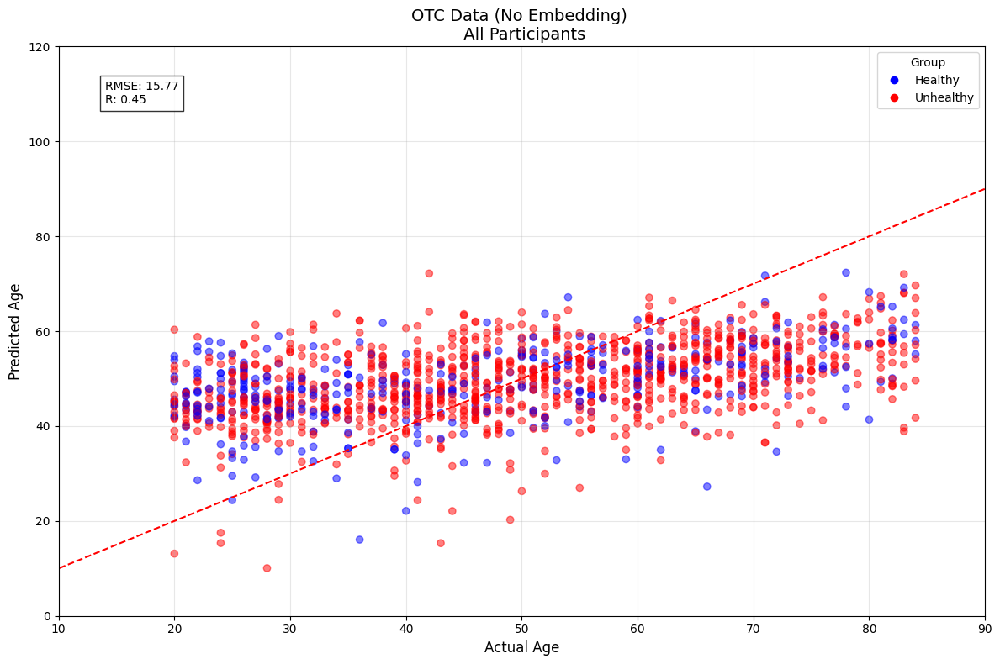

In [145]:
colors = [
    'blue' if seqn in healthy_participants else 'red'
    for seqn in otc_30.loc[y_test.index, 'SEQN']
]

plt.figure(figsize=(12, 8))
plt.scatter(y_test, y_pred_otc_raw, c=colors, alpha=0.5)

plt.plot([0, 90], [0, 90], 'r--', label='Perfect Prediction')

plt.xlim(10, 90)
plt.ylim(0, 120)

plt.xlabel('Actual Age', fontsize=12)
plt.ylabel('Predicted Age', fontsize=12)
plt.title('OTC Data (No Embedding) \n All Participants', fontsize=14)

plt.grid(True, alpha=0.3)
plt.legend()

custom_lines = [Line2D([0], [0], marker='o', color='w', label='Healthy',
                      markerfacecolor='blue', markersize=8),
                Line2D([0], [0], marker='o', color='w', label='Unhealthy',
                      markerfacecolor='red', markersize=8)]
plt.legend(handles=custom_lines, title='Group')

metrics_text = f'RMSE: {rmse_otc_raw:.2f}\nR: {r_otc_raw:.2f}'
plt.text(0.05, 0.9, metrics_text, transform=plt.gca().transAxes, 
         bbox=dict(facecolor='white', alpha=0.8), fontsize=10)

plt.tight_layout()
plt.show()


<Figure size 800x600 with 0 Axes>

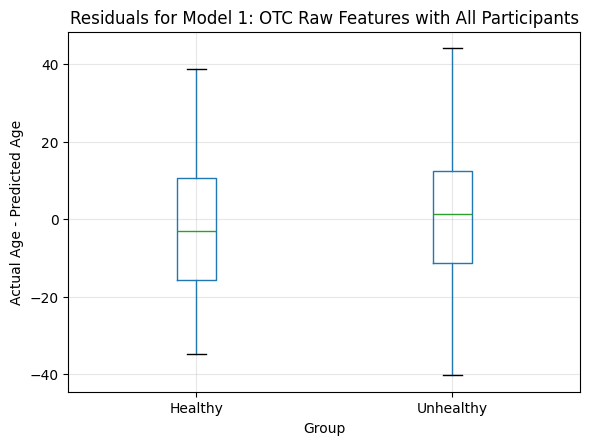

Residuals for Model 1: OTC Raw Features with All Participants
Average residual (Healthy): -2.52
Average residual (Unhealthy): 0.95


In [146]:
residuals = y_test - y_pred_otc_raw

seqn_test = otc_30.loc[y_test.index, 'SEQN']

mask_healthy = seqn_test.isin(healthy_participants)
mask_unhealthy = seqn_test.isin(unhealthy_participants)

avg_resid_healthy = residuals[mask_healthy].mean()
avg_resid_unhealthy = residuals[mask_unhealthy].mean()

residuals_df = pd.DataFrame({
    'Residual': residuals,
    'Group': np.where(mask_healthy, 'Healthy', 'Unhealthy')
})

plt.figure(figsize=(8,6))
residuals_df.boxplot(column='Residual', by='Group')
plt.title('Residuals for Model 1: OTC Raw Features with All Participants')
plt.suptitle('')
plt.ylabel('Actual Age - Predicted Age')
plt.grid(alpha=0.3)
plt.show()

print('Residuals for Model 1: OTC Raw Features with All Participants')
print(f"Average residual (Healthy): {avg_resid_healthy:.2f}")
print(f"Average residual (Unhealthy): {avg_resid_unhealthy:.2f}")

#### Risk Factors Analysis

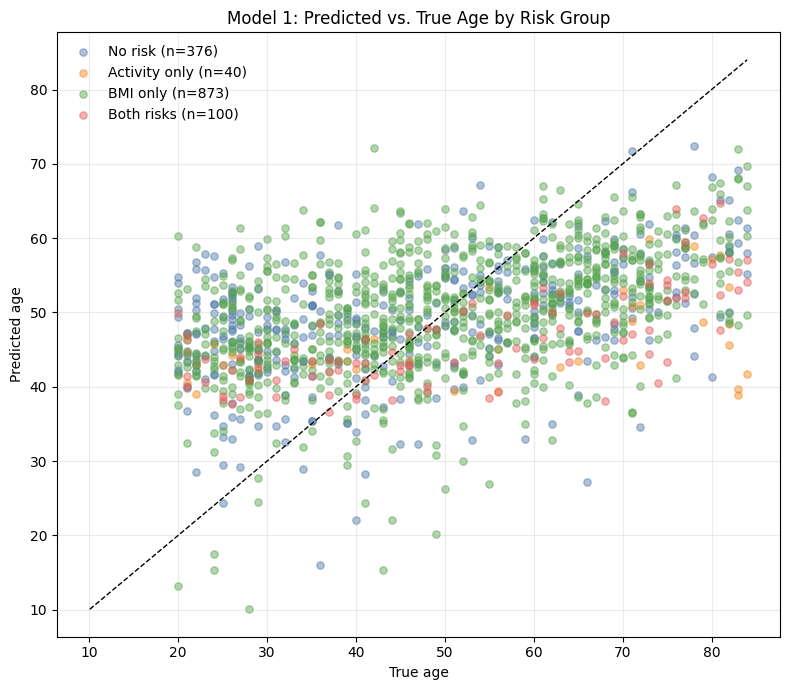

/var/folders/dz/ggx10pdx1p91s2hsnvsw_sy40000gn/T/ipykernel_37523/3080520401.py:64: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = plt.boxplot(


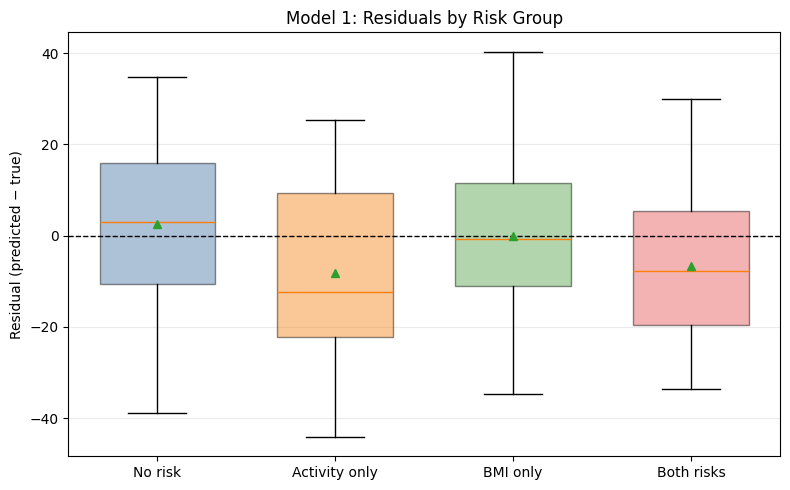

                 n    mae  mean_residual   rmse
group                                          
No risk        376  13.87           2.52  16.50
Activity only   40  19.24          -8.24  22.17
BMI only       873  12.54           0.03  14.94
Both risks     100  14.22          -6.61  16.88


In [147]:
eval_df_otc_30 = otc_30.loc[y_test.index, ['Activity_Risk', 'BMI_Risk']].copy()
eval_df_otc_30['y_true'] = y_test.values
eval_df_otc_30['y_pred'] = y_pred_otc_raw


eval_df_otc_30['activity_risk'] = eval_df_otc_30['Activity_Risk'].astype(bool)
eval_df_otc_30['bmi_risk'] = eval_df_otc_30['BMI_Risk'].astype(bool)

# Create mutually exclusive groups
def label_group(row):
    a, b = row['activity_risk'], row['bmi_risk']
    if a and b:
        return 'Both risks'
    elif a and not b:
        return 'Activity only'
    elif not a and b:
        return 'BMI only'
    else:
        return 'No risk'

eval_df_otc_30['group'] = eval_df_otc_30.apply(label_group, axis=1)

# --- 1) Calibration scatter: true vs predicted by group ---
group_order = ['No risk', 'Activity only', 'BMI only', 'Both risks']
group_colors = {
    'No risk': '#4C78A8',        # blue-ish
    'Activity only': '#F58518',  # orange
    'BMI only': '#54A24B',       # green
    'Both risks': '#E45756'      # red
}

plt.figure(figsize=(8, 7))
for g in group_order:
    m = eval_df_otc_30['group'] == g
    plt.scatter(
        eval_df_otc_30.loc[m, 'y_true'],
        eval_df_otc_30.loc[m, 'y_pred'],
        alpha=0.45,
        s=28,
        label=f"{g} (n={m.sum()})",
        c=group_colors[g]
    )

# 45° reference line
lo = np.min([eval_df_otc_30['y_true'].min(), eval_df_otc_30['y_pred'].min()])
hi = np.max([eval_df_otc_30['y_true'].max(), eval_df_otc_30['y_pred'].max()])
plt.plot([lo, hi], [lo, hi], linestyle='--', linewidth=1, color='black')

plt.xlabel('True age')
plt.ylabel('Predicted age')
plt.title('Model 1: Predicted vs. True Age by Risk Group')
plt.legend(frameon=False)
plt.grid(alpha=0.25)
plt.tight_layout()
plt.show()

# --- 2) Residuals by group (pred - true): bias visualization ---
eval_df_otc_30['residual'] = eval_df_otc_30['y_pred'] - eval_df_otc_30['y_true']

data_for_box = [eval_df_otc_30.loc[eval_df_otc_30['group'] == g, 'residual'].values for g in group_order]
box_colors = [group_colors[g] for g in group_order]

plt.figure(figsize=(8, 5))
bp = plt.boxplot(
    data_for_box,
    labels=group_order,
    showfliers=False,
    widths=0.65,
    patch_artist=True,
    showmeans=True
)

# Color the boxes
for patch, color in zip(bp['boxes'], box_colors):
    patch.set_facecolor(color)
    patch.set_alpha(0.45)

# Add a 0 baseline (no bias)
plt.axhline(0, linestyle='--', linewidth=1, color='black')

plt.ylabel('Residual (predicted − true)')
plt.title('Model 1: Residuals by Risk Group')
plt.grid(axis='y', alpha=0.25)
plt.tight_layout()
plt.show()

summary = (
    eval_df_otc_30.groupby('group')
           .agg(n=('residual', 'size'),
                mae=('residual', lambda x: np.mean(np.abs(x))),
                mean_residual=('residual', 'mean'),
                rmse=('residual', lambda x: np.sqrt(np.mean(x**2))))
           .reindex(group_order)
           .round(2)
)
print(summary)


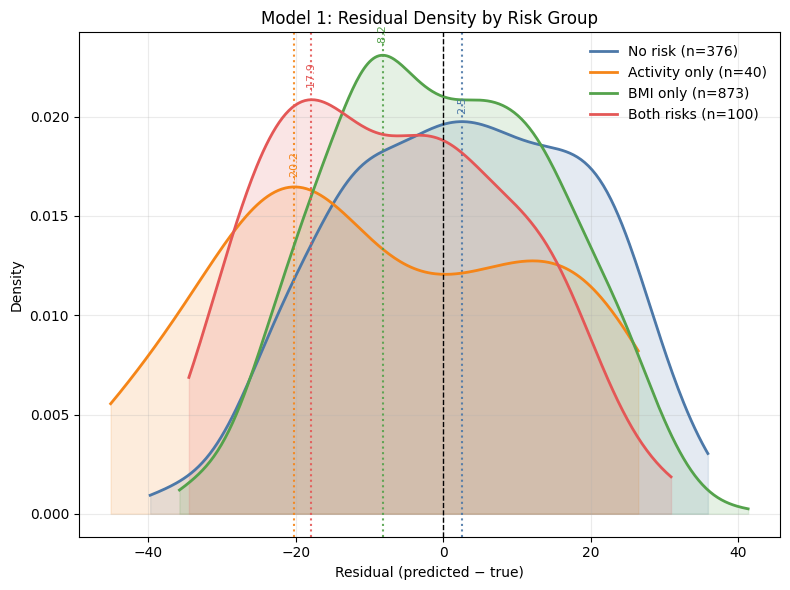

In [148]:
eval_df_otc_30['residual'] = eval_df_otc_30['y_pred'] - eval_df_otc_30['y_true']

group_order = ['No risk', 'Activity only', 'BMI only', 'Both risks']
group_colors = {
    'No risk': '#4C78A8',
    'Activity only': '#F58518',
    'BMI only': '#54A24B',
    'Both risks': '#E45756'
}

plt.figure(figsize=(8, 6))

for g in group_order:
    resid = eval_df_otc_30.loc[eval_df_otc_30['group'] == g, 'residual'].values
    if len(resid) < 2: 
        continue
    kde = gaussian_kde(resid)
    xs = np.linspace(resid.min() - 1, resid.max() + 1, 300)
    ys = kde(xs)
    plt.plot(xs, ys, label=f"{g} (n={len(resid)})",
             color=group_colors[g], linewidth=2)
   
    plt.fill_between(xs, ys, color=group_colors[g], alpha=0.15)

    mode_x = xs[np.argmax(ys)]
    plt.axvline(mode_x, color=group_colors[g], linestyle=':', linewidth=1.5,
                alpha=0.9)
    plt.text(mode_x, max(ys)*1.02, f"{mode_x:.1f}", color=group_colors[g],
             ha='center', va='bottom', fontsize=8, rotation=90)

plt.axvline(0, linestyle='--', color='black', linewidth=1)
plt.xlabel('Residual (predicted − true)')
plt.ylabel('Density')
plt.title('Model 1: Residual Density by Risk Group')
plt.legend(frameon=False)
plt.grid(alpha=0.25)
plt.tight_layout()
plt.show()

#### 50+

In [87]:
otc_30_50plus = otc_30[otc_30['Age'] >= 50]

X = otc_30_50plus.drop(columns=["Age", 'SEQN', 'Activity_Risk', 'BMI_Risk'], errors="ignore")
y = otc_30_50plus["Age"]

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

X_scaler = StandardScaler()

X_train_scaled = X_scaler.fit_transform(X_train)
X_test_scaled = X_scaler.transform(X_test)

X_train_scaled = pd.DataFrame(X_train_scaled, columns=X_train.columns)
X_test_scaled = pd.DataFrame(X_test_scaled, columns=X_test.columns)

lr_otc_raw_50 = LinearRegression()
lr_otc_raw_50.fit(X_train_scaled, y_train)
y_pred_otc_raw_50 = lr_otc_raw_50.predict(X_test_scaled)
rmse_otc_raw_50 = np.sqrt(mean_squared_error(y_test, y_pred_otc_raw_50))
r_otc_raw_50 = stats.pearsonr(y_test, y_pred_otc_raw_50)[0]

print("Model 1.1: OTC Raw Features with Participants Aged 50+")
print(f"RMSE for test set: {rmse_otc_raw_50}")
print(f"R for test set: {r_otc_raw_50}")

Model 1.1: OTC Raw Features with Participants Aged 50+
RMSE for test set: 8.645281208661155
R for test set: 0.46357528793235364


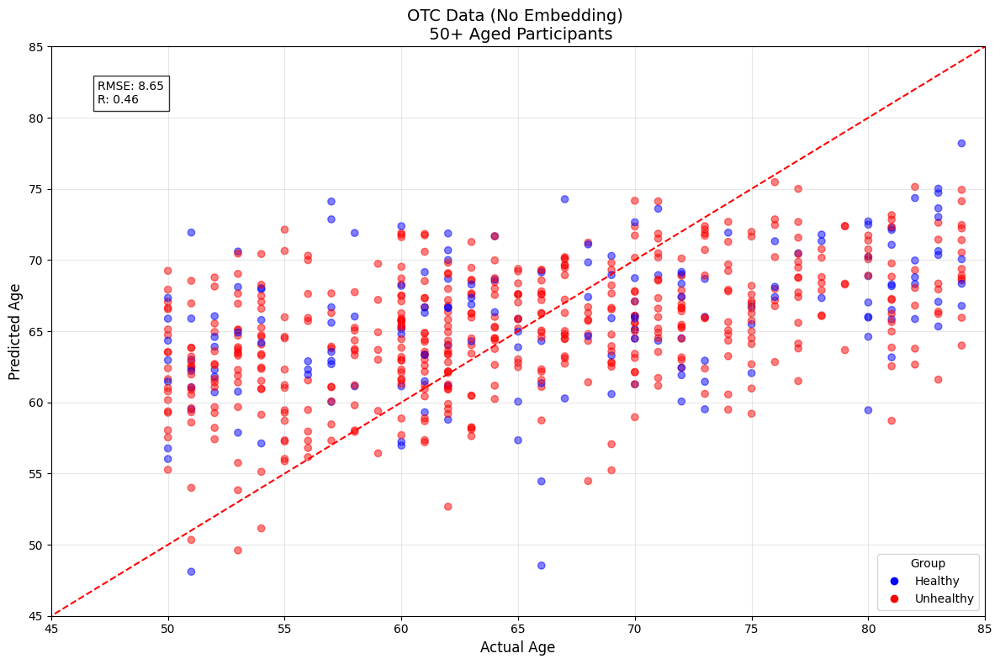

In [88]:
colors = [
    'blue' if seqn in healthy_participants else 'red'
    for seqn in otc_30_50plus.loc[y_test.index, 'SEQN']
]

plt.figure(figsize=(12, 8))
plt.scatter(y_test, y_pred_otc_raw_50, c=colors, alpha=0.5)

plt.plot([0, 90], [0, 90], 'r--', label='Perfect Prediction')

plt.xlim(45, 85)
plt.ylim(45, 85)

plt.xlabel('Actual Age', fontsize=12)
plt.ylabel('Predicted Age', fontsize=12)
plt.title('OTC Data (No Embedding) \n 50+ Aged Participants', fontsize=14)

plt.grid(True, alpha=0.3)
plt.legend()

custom_lines = [Line2D([0], [0], marker='o', color='w', label='Healthy',
                      markerfacecolor='blue', markersize=8),
                Line2D([0], [0], marker='o', color='w', label='Unhealthy',
                      markerfacecolor='red', markersize=8)]
plt.legend(handles=custom_lines, title='Group')

metrics_text = f'RMSE: {rmse_otc_raw_50:.2f}\nR: {r_otc_raw_50:.2f}'
plt.text(0.05, 0.9, metrics_text, transform=plt.gca().transAxes, 
         bbox=dict(facecolor='white', alpha=0.8), fontsize=10)

plt.tight_layout()
plt.show()


<Figure size 800x600 with 0 Axes>

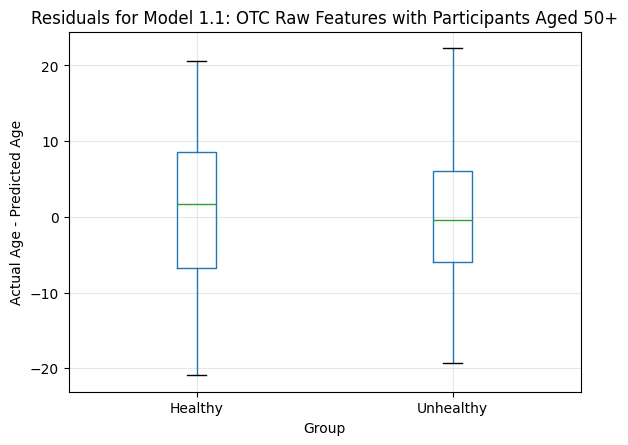

Residuals for Model 1.1: OTC Raw Features with Participants Aged 50+
Average residual (Healthy): 0.80
Average residual (Unhealthy): -0.11


In [89]:
residuals = y_test - y_pred_otc_raw_50

seqn_test = otc_30_50plus.loc[y_test.index, 'SEQN']

mask_healthy = seqn_test.isin(healthy_participants)
mask_unhealthy = seqn_test.isin(unhealthy_participants)

avg_resid_healthy = residuals[mask_healthy].mean()
avg_resid_unhealthy = residuals[mask_unhealthy].mean()

residuals_df = pd.DataFrame({
    'Residual': residuals,
    'Group': np.where(mask_healthy, 'Healthy', 'Unhealthy')
})

plt.figure(figsize=(8,6))
residuals_df.boxplot(column='Residual', by='Group')
plt.title('Residuals for Model 1.1: OTC Raw Features with Participants Aged 50+')
plt.suptitle('')
plt.ylabel('Actual Age - Predicted Age')
plt.grid(alpha=0.3)
plt.show()

print('Residuals for Model 1.1: OTC Raw Features with Participants Aged 50+')
print(f"Average residual (Healthy): {avg_resid_healthy:.2f}")
print(f"Average residual (Unhealthy): {avg_resid_unhealthy:.2f}")

### Raw Accelerometer Data GPT 50

In [182]:
X = gpt50_prediction.drop(columns=["RIDAGEYR", 'SEQN', 'Activity_Risk', 'BMI_Risk'], errors="ignore")
y = gpt50_prediction["RIDAGEYR"]

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

X_scaler = StandardScaler()

X_train_scaled = X_scaler.fit_transform(X_train)
X_test_scaled = X_scaler.transform(X_test)

X_train_scaled = pd.DataFrame(X_train_scaled, columns=X_train.columns)
X_test_scaled = pd.DataFrame(X_test_scaled, columns=X_test.columns)

lr_gpt50_raw = LinearRegression()
lr_gpt50_raw.fit(X_train_scaled, y_train)
y_pred_gpt50_raw = lr_gpt50_raw.predict(X_test_scaled)
rmse_gpt50_raw = np.sqrt(mean_squared_error(y_test, y_pred_gpt50_raw))
r_gpt50_raw = stats.pearsonr(y_test, y_pred_gpt50_raw)[0]

print("Model 2: GPT-50 Embeddings from Raw Accelerometer Data with All Participants")
print(f"RMSE for test set: {rmse_gpt50_raw}")
print(f"R Squared for test set: {r_gpt50_raw}")

Model 2: GPT-50 Embeddings from Raw Accelerometer Data with All Participants
RMSE for test set: 13.612340355272796
R Squared for test set: 0.6405011046094953


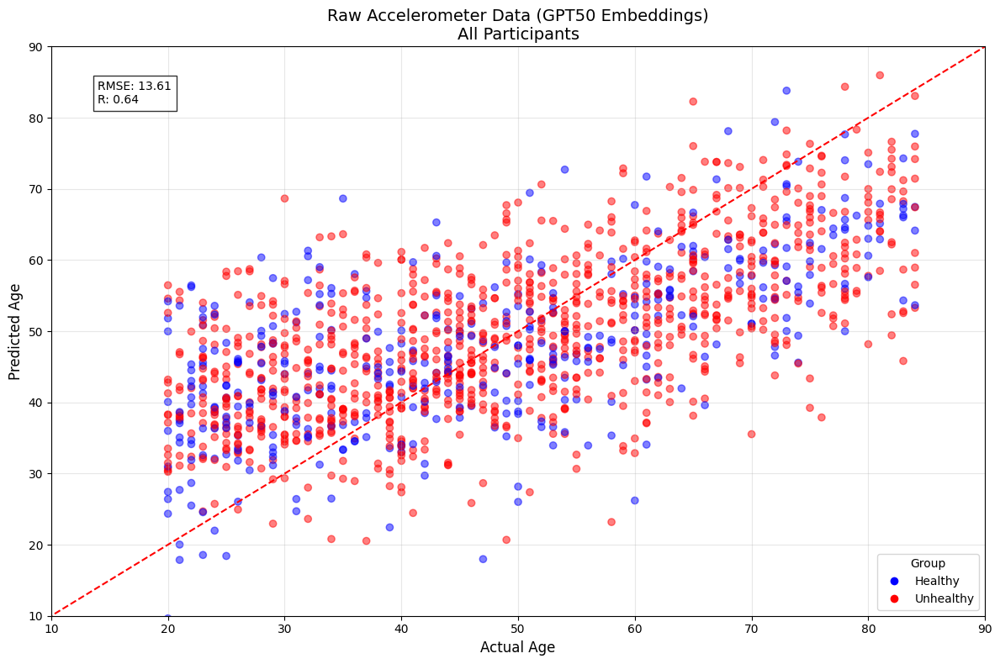

In [183]:
colors = [
    'blue' if seqn in healthy_participants else 'red'
    for seqn in gpt50_prediction.loc[y_test.index, 'SEQN']
]

plt.figure(figsize=(12, 8))
plt.scatter(y_test, y_pred_gpt50_raw, c=colors, alpha=0.5)

plt.plot([0, 90], [0, 90], 'r--', label='Perfect Prediction')

plt.xlim(10, 90)
plt.ylim(10, 90)

plt.xlabel('Actual Age', fontsize=12)
plt.ylabel('Predicted Age', fontsize=12)
plt.title('Raw Accelerometer Data (GPT50 Embeddings)\nAll Participants', fontsize=14)

plt.grid(True, alpha=0.3)
plt.legend()

custom_lines = [Line2D([0], [0], marker='o', color='w', label='Healthy',
                      markerfacecolor='blue', markersize=8),
                Line2D([0], [0], marker='o', color='w', label='Unhealthy',
                      markerfacecolor='red', markersize=8)]
plt.legend(handles=custom_lines, title='Group')

metrics_text = f'RMSE: {rmse_gpt50_raw:.2f}\nR: {r_gpt50_raw:.2f}'
plt.text(0.05, 0.9, metrics_text, transform=plt.gca().transAxes, 
         bbox=dict(facecolor='white', alpha=0.8), fontsize=10)

plt.tight_layout()
plt.show()

<Figure size 800x600 with 0 Axes>

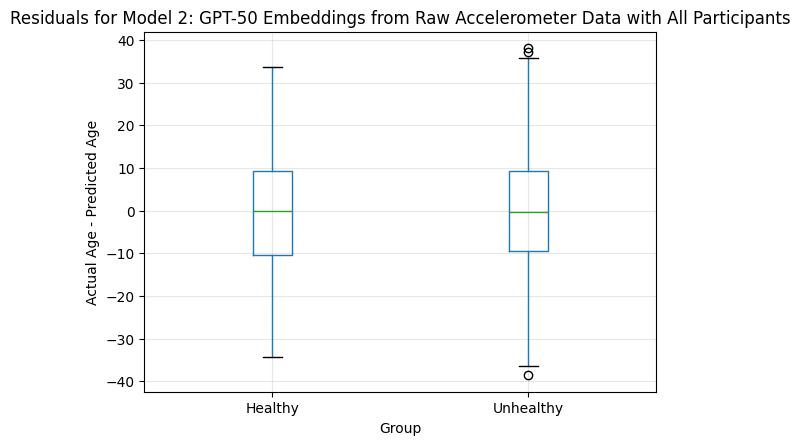

Residuals for Model 2: GPT-50 Embeddings from Raw Accelerometer Data with All Participants
Average residual (Healthy): -0.83
Average residual (Unhealthy): -0.18


In [184]:
residuals = y_test - y_pred_gpt50_raw

seqn_test = gpt50_prediction.loc[y_test.index, 'SEQN']

mask_healthy = seqn_test.isin(healthy_participants)
mask_unhealthy = seqn_test.isin(unhealthy_participants)

avg_resid_healthy = residuals[mask_healthy].mean()
avg_resid_unhealthy = residuals[mask_unhealthy].mean()

residuals_df = pd.DataFrame({
    'Residual': residuals,
    'Group': np.where(mask_healthy, 'Healthy', 'Unhealthy')
})

plt.figure(figsize=(8,6))
residuals_df.boxplot(column='Residual', by='Group')
plt.title('Residuals for Model 2: GPT-50 Embeddings from Raw Accelerometer Data with All Participants')
plt.suptitle('')
plt.ylabel('Actual Age - Predicted Age')
plt.grid(alpha=0.3)
plt.show()

print('Residuals for Model 2: GPT-50 Embeddings from Raw Accelerometer Data with All Participants')
print(f"Average residual (Healthy): {avg_resid_healthy:.2f}")
print(f"Average residual (Unhealthy): {avg_resid_unhealthy:.2f}")

#### Risk Factor Analysis

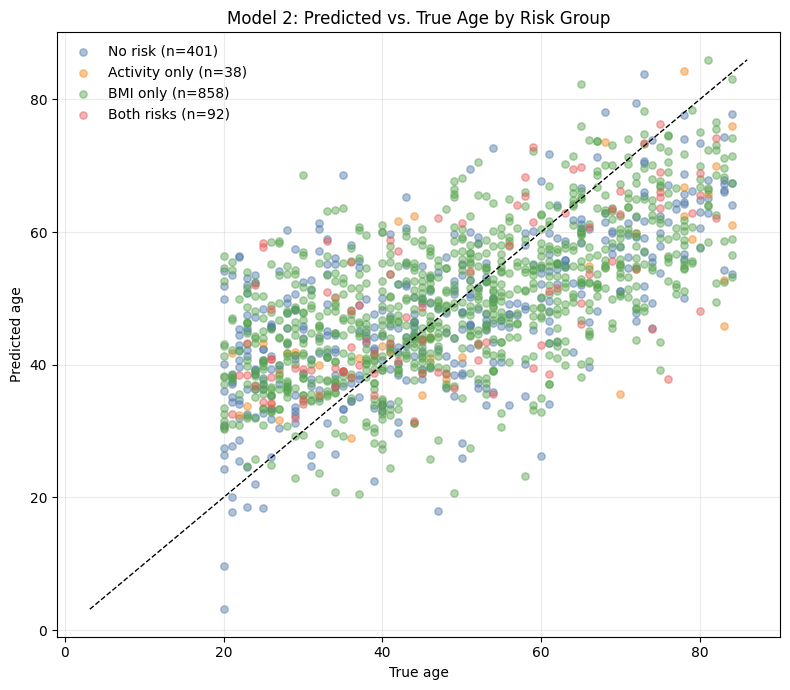

/var/folders/dz/ggx10pdx1p91s2hsnvsw_sy40000gn/T/ipykernel_37523/3668010764.py:64: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = plt.boxplot(


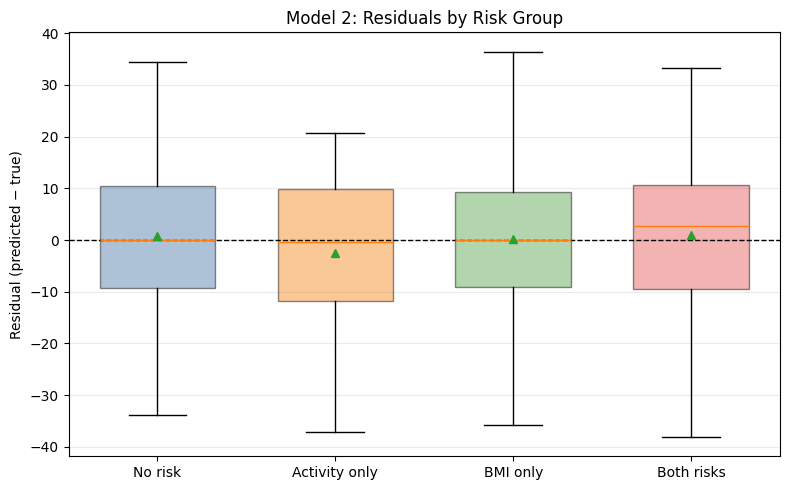

                 n    mae  mean_residual   rmse
group                                          
No risk        401  11.56           0.83  14.10
Activity only   38  12.82          -2.47  15.29
BMI only       858  10.73           0.21  13.28
Both risks      92  11.15           0.95  13.76


In [185]:
eval_df_raw_gpt50 = gpt50_prediction.loc[y_test.index, ['Activity_Risk', 'BMI_Risk']].copy()
eval_df_raw_gpt50['y_true'] = y_test.values
eval_df_raw_gpt50['y_pred'] = y_pred_gpt50_raw


eval_df_raw_gpt50['activity_risk'] = eval_df_raw_gpt50['Activity_Risk'].astype(bool)
eval_df_raw_gpt50['bmi_risk'] = eval_df_raw_gpt50['BMI_Risk'].astype(bool)

# Create mutually exclusive groups
def label_group(row):
    a, b = row['activity_risk'], row['bmi_risk']
    if a and b:
        return 'Both risks'
    elif a and not b:
        return 'Activity only'
    elif not a and b:
        return 'BMI only'
    else:
        return 'No risk'

eval_df_raw_gpt50['group'] = eval_df_raw_gpt50.apply(label_group, axis=1)

# --- 1) Calibration scatter: true vs predicted by group ---
group_order = ['No risk', 'Activity only', 'BMI only', 'Both risks']
group_colors = {
    'No risk': '#4C78A8',        # blue-ish
    'Activity only': '#F58518',  # orange
    'BMI only': '#54A24B',       # green
    'Both risks': '#E45756'      # red
}

plt.figure(figsize=(8, 7))
for g in group_order:
    m = eval_df_raw_gpt50['group'] == g
    plt.scatter(
        eval_df_raw_gpt50.loc[m, 'y_true'],
        eval_df_raw_gpt50.loc[m, 'y_pred'],
        alpha=0.45,
        s=28,
        label=f"{g} (n={m.sum()})",
        c=group_colors[g]
    )

# 45° reference line
lo = np.min([eval_df_raw_gpt50['y_true'].min(), eval_df_raw_gpt50['y_pred'].min()])
hi = np.max([eval_df_raw_gpt50['y_true'].max(), eval_df_raw_gpt50['y_pred'].max()])
plt.plot([lo, hi], [lo, hi], linestyle='--', linewidth=1, color='black')

plt.xlabel('True age')
plt.ylabel('Predicted age')
plt.title('Model 2: Predicted vs. True Age by Risk Group')
plt.legend(frameon=False)
plt.grid(alpha=0.25)
plt.tight_layout()
plt.show()

# --- 2) Residuals by group (pred - true): bias visualization ---
eval_df_raw_gpt50['residual'] = eval_df_raw_gpt50['y_pred'] - eval_df_raw_gpt50['y_true']

data_for_box = [eval_df_raw_gpt50.loc[eval_df_raw_gpt50['group'] == g, 'residual'].values for g in group_order]
box_colors = [group_colors[g] for g in group_order]

plt.figure(figsize=(8, 5))
bp = plt.boxplot(
    data_for_box,
    labels=group_order,
    showfliers=False,
    widths=0.65,
    patch_artist=True,
    showmeans=True
)

# Color the boxes
for patch, color in zip(bp['boxes'], box_colors):
    patch.set_facecolor(color)
    patch.set_alpha(0.45)

# Add a 0 baseline (no bias)
plt.axhline(0, linestyle='--', linewidth=1, color='black')

plt.ylabel('Residual (predicted − true)')
plt.title('Model 2: Residuals by Risk Group')
plt.grid(axis='y', alpha=0.25)
plt.tight_layout()
plt.show()

summary = (
    eval_df_raw_gpt50.groupby('group')
           .agg(n=('residual', 'size'),
                mae=('residual', lambda x: np.mean(np.abs(x))),
                mean_residual=('residual', 'mean'),
                rmse=('residual', lambda x: np.sqrt(np.mean(x**2))))
           .reindex(group_order)
           .round(2)
)
print(summary)


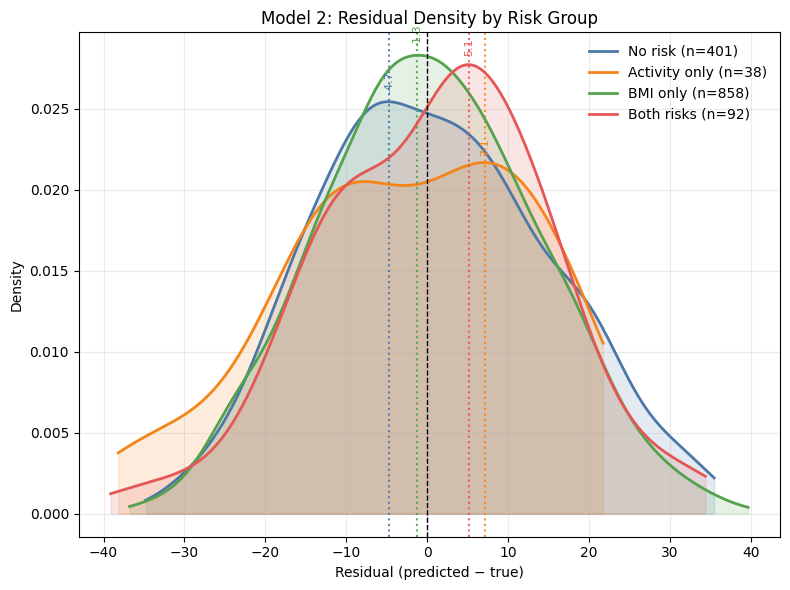

In [186]:
eval_df_raw_gpt50['residual'] = eval_df_raw_gpt50['y_pred'] - eval_df_raw_gpt50['y_true']

group_order = ['No risk', 'Activity only', 'BMI only', 'Both risks']
group_colors = {
    'No risk': '#4C78A8',
    'Activity only': '#F58518',
    'BMI only': '#54A24B',
    'Both risks': '#E45756'
}

plt.figure(figsize=(8, 6))

for g in group_order:
    resid = eval_df_raw_gpt50.loc[eval_df_raw_gpt50['group'] == g, 'residual'].values
    if len(resid) < 2: 
        continue
    kde = gaussian_kde(resid)
    xs = np.linspace(resid.min() - 1, resid.max() + 1, 300)
    ys = kde(xs)
    plt.plot(xs, ys, label=f"{g} (n={len(resid)})",
             color=group_colors[g], linewidth=2)
   
    plt.fill_between(xs, ys, color=group_colors[g], alpha=0.15)

    mode_x = xs[np.argmax(ys)]
    plt.axvline(mode_x, color=group_colors[g], linestyle=':', linewidth=1.5,
                alpha=0.9)
    plt.text(mode_x, max(ys)*1.02, f"{mode_x:.1f}", color=group_colors[g],
             ha='center', va='bottom', fontsize=8, rotation=90)

plt.axvline(0, linestyle='--', color='black', linewidth=1)
plt.xlabel('Residual (predicted − true)')
plt.ylabel('Density')
plt.title('Model 2: Residual Density by Risk Group')
plt.legend(frameon=False)
plt.grid(alpha=0.25)
plt.tight_layout()
plt.show()

#### 50+

In [93]:
gpt50_raw_50plus = gpt50_prediction[gpt50_prediction['RIDAGEYR'] >= 50]

X = gpt50_raw_50plus.drop(columns=["RIDAGEYR", 'SEQN', 'Activity_Risk', 'BMI_Risk'], errors="ignore")
y = gpt50_raw_50plus["RIDAGEYR"]

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

X_scaler = StandardScaler()

X_train_scaled = X_scaler.fit_transform(X_train)
X_test_scaled = X_scaler.transform(X_test)

X_train_scaled = pd.DataFrame(X_train_scaled, columns=X_train.columns)
X_test_scaled = pd.DataFrame(X_test_scaled, columns=X_test.columns)

lr_gpt50_raw_50 = LinearRegression()
lr_gpt50_raw_50.fit(X_train_scaled, y_train)
y_pred_gpt50_raw_50 = lr_gpt50_raw_50.predict(X_test_scaled)
rmse_gpt50_raw_50 = np.sqrt(mean_squared_error(y_test, y_pred_gpt50_raw_50))
r_gpt50_raw_50 = stats.pearsonr(y_test, y_pred_gpt50_raw_50)[0]

print("Model 2.1: GPT-50 Embeddings from Raw Accelerometer Data with Participants Aged 50+\n")
print(f"RMSE for test set: {rmse_gpt50_raw_50}")
print(f"R Squared for test set: {r_gpt50_raw_50}")

Model 2.1: GPT-50 Embeddings from Raw Accelerometer Data with Participants Aged 50+

RMSE for test set: 7.817305733788706
R Squared for test set: 0.5840250062419761


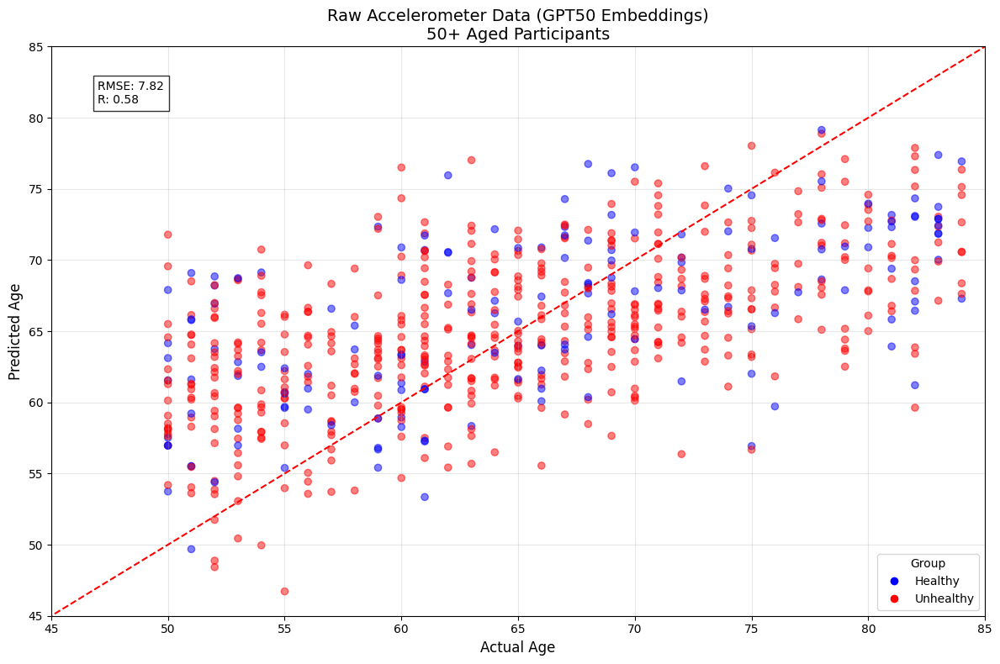

In [94]:
colors = [
    'blue' if seqn in healthy_participants else 'red'
    for seqn in gpt50_raw_50plus.loc[y_test.index, 'SEQN']
]

plt.figure(figsize=(12, 8))
plt.scatter(y_test, y_pred_gpt50_raw_50, c=colors, alpha=0.5)

plt.plot([0, 90], [0, 90], 'r--', label='Perfect Prediction')

plt.xlim(45, 85)
plt.ylim(45, 85)

plt.xlabel('Actual Age', fontsize=12)
plt.ylabel('Predicted Age', fontsize=12)
plt.title('Raw Accelerometer Data (GPT50 Embeddings)\n50+ Aged Participants', fontsize=14)

plt.grid(True, alpha=0.3)
plt.legend()

custom_lines = [Line2D([0], [0], marker='o', color='w', label='Healthy',
                      markerfacecolor='blue', markersize=8),
                Line2D([0], [0], marker='o', color='w', label='Unhealthy',
                      markerfacecolor='red', markersize=8)]
plt.legend(handles=custom_lines, title='Group')

metrics_text = f'RMSE: {rmse_gpt50_raw_50:.2f}\nR: {r_gpt50_raw_50:.2f}'
plt.text(0.05, 0.9, metrics_text, transform=plt.gca().transAxes, 
         bbox=dict(facecolor='white', alpha=0.8), fontsize=10)

plt.tight_layout()
plt.show()


<Figure size 800x600 with 0 Axes>

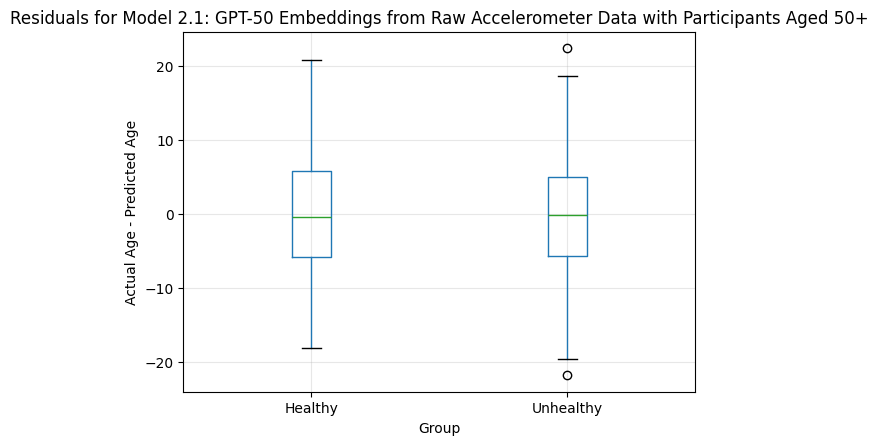

Residuals for Model 2.1: GPT-50 Embeddings from Raw Accelerometer Data with Participants Aged 50+
Average residual (Healthy): -0.17
Average residual (Unhealthy): -0.31


In [95]:
residuals = y_test - y_pred_gpt50_raw_50

seqn_test = gpt50_raw_50plus.loc[y_test.index, 'SEQN']

mask_healthy = seqn_test.isin(healthy_participants)
mask_unhealthy = seqn_test.isin(unhealthy_participants)

avg_resid_healthy = residuals[mask_healthy].mean()
avg_resid_unhealthy = residuals[mask_unhealthy].mean()

residuals_df = pd.DataFrame({
    'Residual': residuals,
    'Group': np.where(mask_healthy, 'Healthy', 'Unhealthy')
})

plt.figure(figsize=(8,6))
residuals_df.boxplot(column='Residual', by='Group')
plt.title('Residuals for Model 2.1: GPT-50 Embeddings from Raw Accelerometer Data with Participants Aged 50+')
plt.suptitle('')
plt.ylabel('Actual Age - Predicted Age')
plt.grid(alpha=0.3)
plt.show()

print('Residuals for Model 2.1: GPT-50 Embeddings from Raw Accelerometer Data with Participants Aged 50+')
print(f"Average residual (Healthy): {avg_resid_healthy:.2f}")
print(f"Average residual (Unhealthy): {avg_resid_unhealthy:.2f}")

### Raw Accelerometer Data GPT 1536

In [17]:
X = gpt1536.drop(columns=["Age", 'SEQN', 'Activity_Risk', 'BMI_Risk', 'BMXBMI', 'Group'], errors="ignore")
y = gpt1536["Age"]

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

X_scaler = StandardScaler()

X_train_scaled = X_scaler.fit_transform(X_train)
X_test_scaled = X_scaler.transform(X_test)

X_train_scaled = pd.DataFrame(X_train_scaled, columns=X_train.columns)
X_test_scaled = pd.DataFrame(X_test_scaled, columns=X_test.columns)

ridge_raw1536 = RidgeCV(alphas=np.logspace(-6, 6, 13), store_cv_values=True)
ridge_raw1536.fit(X_train_scaled, y_train)

y_pred_gpt1536_raw = ridge_raw1536.predict(X_test_scaled)
rmse_gpt1536_raw = np.sqrt(mean_squared_error(y_test, y_pred_gpt1536_raw))
r_gpt1536_raw = stats.pearsonr(y_test, y_pred_gpt1536_raw)[0]

print("Model 3: GPT-1536 Embeddings from Raw Accelerometer Data with All Participants")
print(f"RMSE for test set (healthy participants): {rmse_gpt1536_raw}")
print(f"R Squared for test set (healthy participants): {r_gpt1536_raw}")

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/linear_model/_ridge.py:2341: FutureWarning: 'store_cv_values' is deprecated in version 1.5 and will be removed in 1.7. Use 'store_cv_results' instead.
  warnings.warn(


Model 3: GPT-1536 Embeddings from Raw Accelerometer Data with All Participants
RMSE for test set (healthy participants): 12.102093955019107
R Squared for test set (healthy participants): 0.7306828272937788


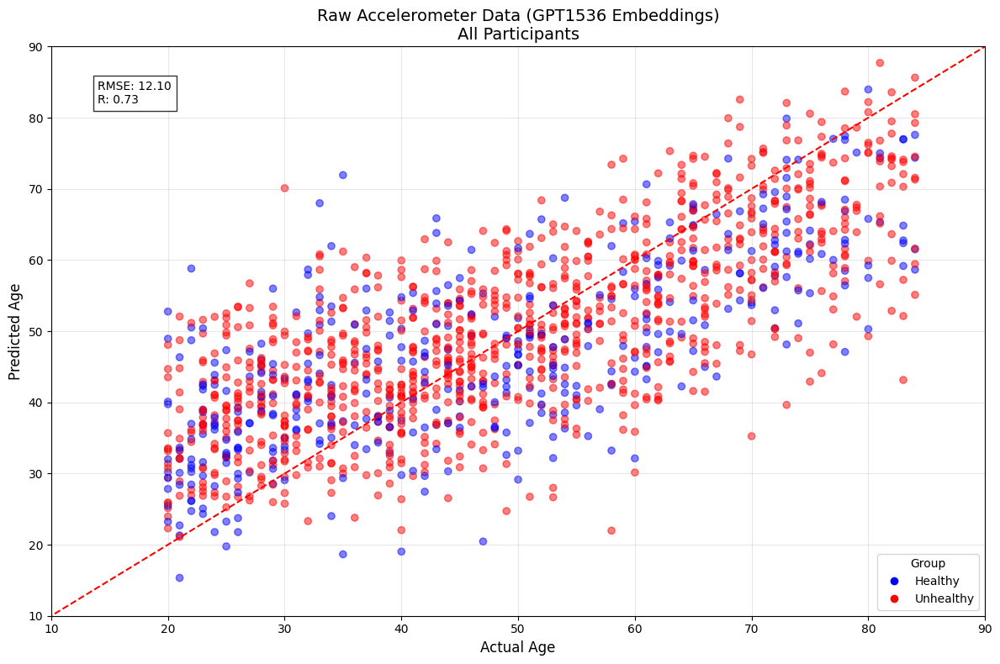


Prediction Statistics:
Mean Absolute Error: 9.67
Mean prediction: 49.02
Mean actual age: 48.68
Age range in test set: 20 to 84


In [18]:
colors = [
    'blue' if seqn in healthy_participants else 'red'
    for seqn in gpt1536.loc[y_test.index, 'SEQN']
]

plt.figure(figsize=(12, 8))
plt.scatter(y_test, y_pred_gpt1536_raw, c=colors, alpha=0.5)

plt.plot([0, 90], [0, 90], 'r--', label='Perfect Prediction')

plt.xlim(10, 90)
plt.ylim(10, 90)

plt.xlabel('Actual Age', fontsize=12)
plt.ylabel('Predicted Age', fontsize=12)
plt.title('Raw Accelerometer Data (GPT1536 Embeddings)\nAll Participants', fontsize=14)

plt.grid(True, alpha=0.3)
plt.legend()

custom_lines = [Line2D([0], [0], marker='o', color='w', label='Healthy',
                      markerfacecolor='blue', markersize=8),
                Line2D([0], [0], marker='o', color='w', label='Unhealthy',
                      markerfacecolor='red', markersize=8)]
plt.legend(handles=custom_lines, title='Group')

metrics_text = f'RMSE: {rmse_gpt1536_raw:.2f}\nR: {r_gpt1536_raw:.2f}'
plt.text(0.05, 0.9, metrics_text, transform=plt.gca().transAxes, 
         bbox=dict(facecolor='white', alpha=0.8), fontsize=10)

plt.tight_layout()
plt.show()

print("\nPrediction Statistics:")
print(f"Mean Absolute Error: {mean_absolute_error(y_test, y_pred_gpt1536_raw):.2f}")
print(f"Mean prediction: {y_pred_gpt1536_raw.mean():.2f}")
print(f"Mean actual age: {y_test.mean():.2f}")
print(f"Age range in test set: {y_test.min():.0f} to {y_test.max():.0f}")

<Figure size 800x600 with 0 Axes>

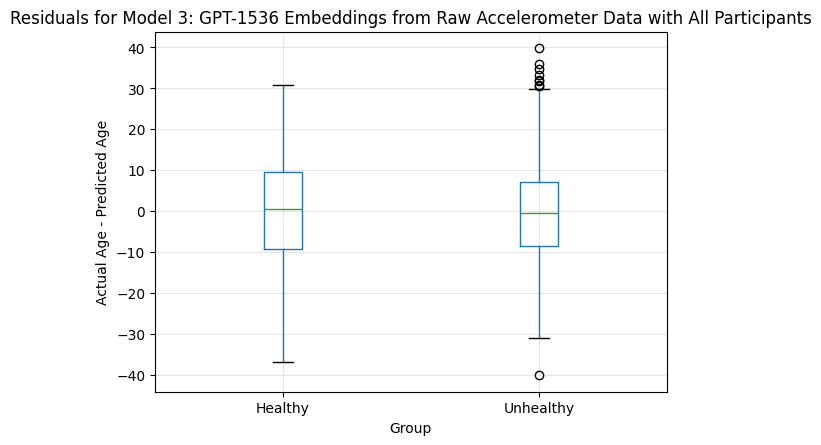

Residuals for Model 3: GPT-1536 Embeddings from Raw Accelerometer Data with All Participants
Average residual (Healthy): 0.06
Average residual (Unhealthy): -0.50


In [19]:
residuals = y_test - y_pred_gpt1536_raw

seqn_test = gpt1536.loc[y_test.index, 'SEQN']

mask_healthy = seqn_test.isin(healthy_participants)
mask_unhealthy = seqn_test.isin(unhealthy_participants)

avg_resid_healthy = residuals[mask_healthy].mean()
avg_resid_unhealthy = residuals[mask_unhealthy].mean()

residuals_df = pd.DataFrame({
    'Residual': residuals,
    'Group': np.where(mask_healthy, 'Healthy', 'Unhealthy')
})

plt.figure(figsize=(8,6))
residuals_df.boxplot(column='Residual', by='Group')
plt.title('Residuals for Model 3: GPT-1536 Embeddings from Raw Accelerometer Data with All Participants')
plt.suptitle('')
plt.ylabel('Actual Age - Predicted Age')
plt.grid(alpha=0.3)
plt.show()

print('Residuals for Model 3: GPT-1536 Embeddings from Raw Accelerometer Data with All Participants')
print(f"Average residual (Healthy): {avg_resid_healthy:.2f}")
print(f"Average residual (Unhealthy): {avg_resid_unhealthy:.2f}")

#### Risk Factors Analysis

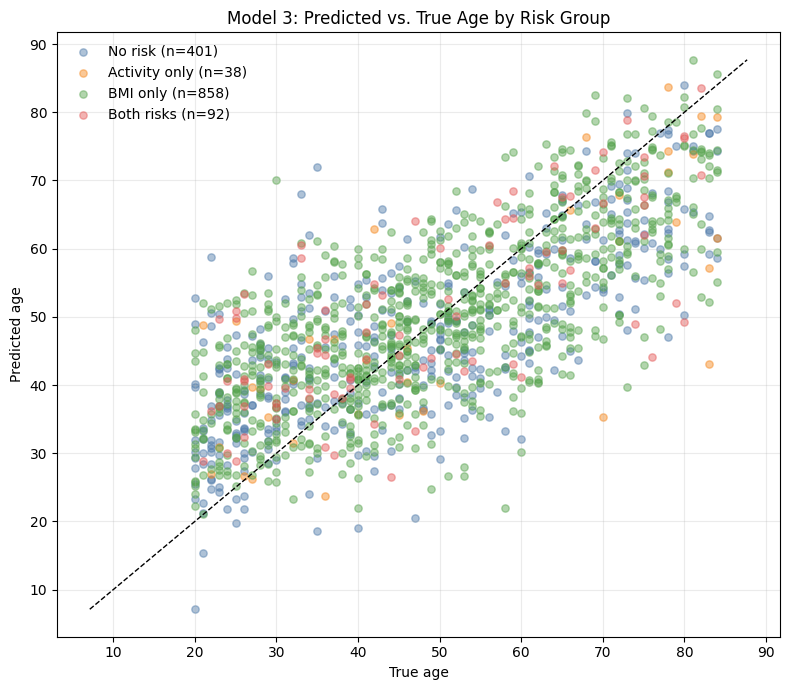

/var/folders/dz/ggx10pdx1p91s2hsnvsw_sy40000gn/T/ipykernel_12821/1968762744.py:64: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = plt.boxplot(


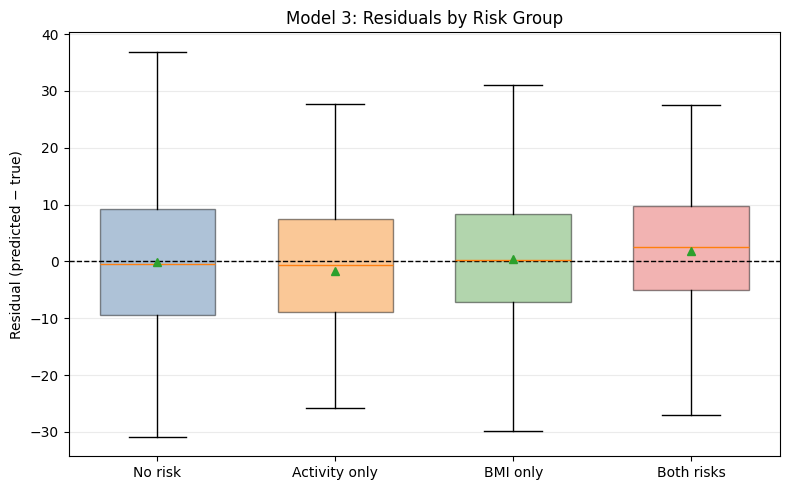

                 n    mae  mean_residual   rmse
group                                          
No risk        401  10.41          -0.06  12.73
Activity only   38  10.60          -1.65  14.21
BMI only       858   9.29           0.44  11.68
Both risks      92   9.59           1.86  12.22


In [26]:
eval_df_raw_gpt1536 = gpt1536.loc[y_test.index, ['Activity_Risk', 'BMI_Risk']].copy()
eval_df_raw_gpt1536['y_true'] = y_test.values
eval_df_raw_gpt1536['y_pred'] = y_pred_gpt1536_raw


eval_df_raw_gpt1536['activity_risk'] = eval_df_raw_gpt1536['Activity_Risk'].astype(bool)
eval_df_raw_gpt1536['bmi_risk'] = eval_df_raw_gpt1536['BMI_Risk'].astype(bool)

# Create mutually exclusive groups
def label_group(row):
    a, b = row['activity_risk'], row['bmi_risk']
    if a and b:
        return 'Both risks'
    elif a and not b:
        return 'Activity only'
    elif not a and b:
        return 'BMI only'
    else:
        return 'No risk'

eval_df_raw_gpt1536['group'] = eval_df_raw_gpt1536.apply(label_group, axis=1)

# --- 1) Calibration scatter: true vs predicted by group ---
group_order = ['No risk', 'Activity only', 'BMI only', 'Both risks']
group_colors = {
    'No risk': '#4C78A8',        # blue-ish
    'Activity only': '#F58518',  # orange
    'BMI only': '#54A24B',       # green
    'Both risks': '#E45756'      # red
}

plt.figure(figsize=(8, 7))
for g in group_order:
    m = eval_df_raw_gpt1536['group'] == g
    plt.scatter(
        eval_df_raw_gpt1536.loc[m, 'y_true'],
        eval_df_raw_gpt1536.loc[m, 'y_pred'],
        alpha=0.45,
        s=28,
        label=f"{g} (n={m.sum()})",
        c=group_colors[g]
    )

# 45° reference line
lo = np.min([eval_df_raw_gpt1536['y_true'].min(), eval_df_raw_gpt1536['y_pred'].min()])
hi = np.max([eval_df_raw_gpt1536['y_true'].max(), eval_df_raw_gpt1536['y_pred'].max()])
plt.plot([lo, hi], [lo, hi], linestyle='--', linewidth=1, color='black')

plt.xlabel('True age')
plt.ylabel('Predicted age')
plt.title('Model 3: Predicted vs. True Age by Risk Group')
plt.legend(frameon=False)
plt.grid(alpha=0.25)
plt.tight_layout()
plt.show()

# --- 2) Residuals by group (pred - true): bias visualization ---
eval_df_raw_gpt1536['residual'] = eval_df_raw_gpt1536['y_pred'] - eval_df_raw_gpt1536['y_true']

data_for_box = [eval_df_raw_gpt1536.loc[eval_df_raw_gpt1536['group'] == g, 'residual'].values for g in group_order]
box_colors = [group_colors[g] for g in group_order]

plt.figure(figsize=(8, 5))
bp = plt.boxplot(
    data_for_box,
    labels=group_order,
    showfliers=False,
    widths=0.65,
    patch_artist=True,
    showmeans=True
)

# Color the boxes
for patch, color in zip(bp['boxes'], box_colors):
    patch.set_facecolor(color)
    patch.set_alpha(0.45)

# Add a 0 baseline (no bias)
plt.axhline(0, linestyle='--', linewidth=1, color='black')

plt.ylabel('Residual (predicted − true)')
plt.title('Model 3: Residuals by Risk Group')
plt.grid(axis='y', alpha=0.25)
plt.tight_layout()
plt.show()

summary = (
    eval_df_raw_gpt1536.groupby('group')
           .agg(n=('residual', 'size'),
                mae=('residual', lambda x: np.mean(np.abs(x))),
                mean_residual=('residual', 'mean'),
                rmse=('residual', lambda x: np.sqrt(np.mean(x**2))))
           .reindex(group_order)
           .round(2)
)
print(summary)


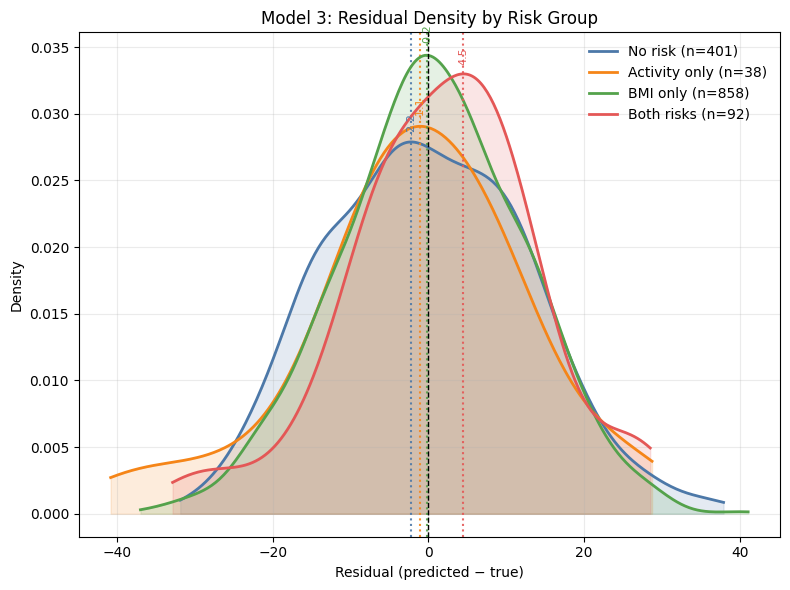

In [27]:
eval_df_raw_gpt1536['residual'] = eval_df_raw_gpt1536['y_pred'] - eval_df_raw_gpt1536['y_true']

group_order = ['No risk', 'Activity only', 'BMI only', 'Both risks']
group_colors = {
    'No risk': '#4C78A8',
    'Activity only': '#F58518',
    'BMI only': '#54A24B',
    'Both risks': '#E45756'
}

plt.figure(figsize=(8, 6))

for g in group_order:
    resid = eval_df_raw_gpt1536.loc[eval_df_raw_gpt1536['group'] == g, 'residual'].values
    if len(resid) < 2: 
        continue
    kde = gaussian_kde(resid)
    xs = np.linspace(resid.min() - 1, resid.max() + 1, 300)
    ys = kde(xs)
    plt.plot(xs, ys, label=f"{g} (n={len(resid)})",
             color=group_colors[g], linewidth=2)
   
    plt.fill_between(xs, ys, color=group_colors[g], alpha=0.15)

    mode_x = xs[np.argmax(ys)]
    plt.axvline(mode_x, color=group_colors[g], linestyle=':', linewidth=1.5,
                alpha=0.9)
    plt.text(mode_x, max(ys)*1.02, f"{mode_x:.1f}", color=group_colors[g],
             ha='center', va='bottom', fontsize=8, rotation=90)

plt.axvline(0, linestyle='--', color='black', linewidth=1)
plt.xlabel('Residual (predicted − true)')
plt.ylabel('Density')
plt.title('Model 3: Residual Density by Risk Group')
plt.legend(frameon=False)
plt.grid(alpha=0.25)
plt.tight_layout()
plt.show()

#### 50+

In [28]:
gpt1536_raw_50plus = gpt1536[gpt1536['Age'] >= 50]

X = gpt1536_raw_50plus.drop(columns=["Age", 'SEQN', 'Activity_Risk', 'BMI_Risk', 'BMXBMI', 'Group'], errors="ignore")
y = gpt1536_raw_50plus["Age"]

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

X_scaler = StandardScaler()

X_train_scaled = X_scaler.fit_transform(X_train)
X_test_scaled = X_scaler.transform(X_test)

X_train_scaled = pd.DataFrame(X_train_scaled, columns=X_train.columns)
X_test_scaled = pd.DataFrame(X_test_scaled, columns=X_test.columns)

ridge_raw1536_50 = RidgeCV(alphas=np.logspace(-6, 6, 13), store_cv_values=True)
ridge_raw1536_50.fit(X_train_scaled, y_train)

y_pred_gpt1536_raw_50 = ridge_raw1536_50.predict(X_test_scaled)
rmse_gpt1536_raw_50 = np.sqrt(mean_squared_error(y_test, y_pred_gpt1536_raw_50))
r_gpt1536_raw_50 = stats.pearsonr(y_test, y_pred_gpt1536_raw_50)[0]

print("Model 3.1: GPT-1536 Embeddings from Raw Accelerometer Data with Participants Aged 50+\n")
print(f"RMSE for test set (healthy participants): {rmse_gpt1536_raw_50}")
print(f"R Squared for test set (healthy participants): {r_gpt1536_raw_50}")

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/linear_model/_ridge.py:2341: FutureWarning: 'store_cv_values' is deprecated in version 1.5 and will be removed in 1.7. Use 'store_cv_results' instead.
  warnings.warn(


Model 3.1: GPT-1536 Embeddings from Raw Accelerometer Data with Participants Aged 50+

RMSE for test set (healthy participants): 7.70702647681954
R Squared for test set (healthy participants): 0.6004549358360931


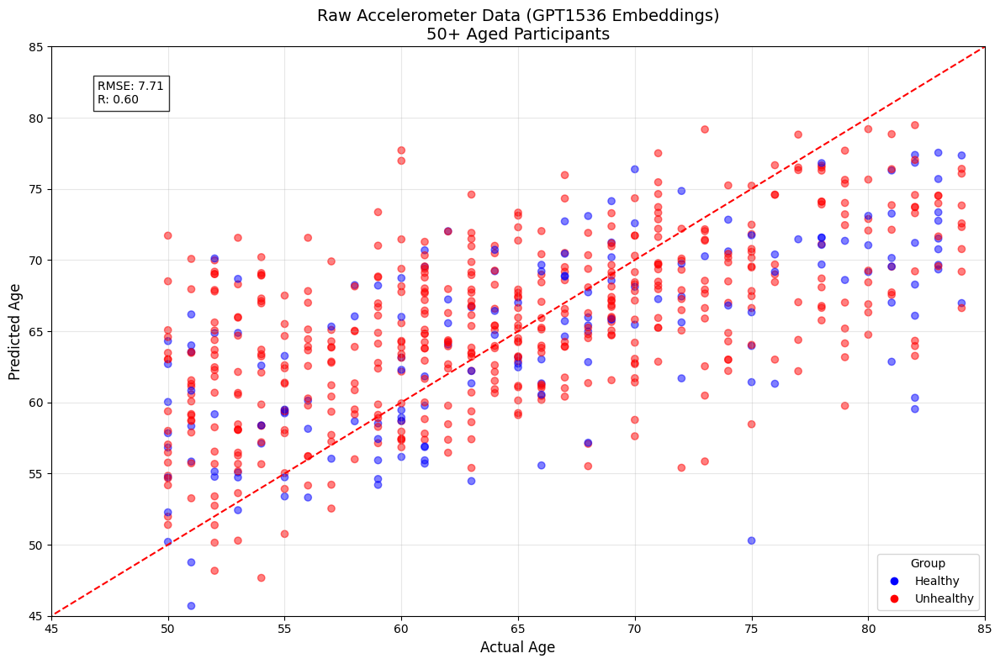

In [29]:
colors = [
    'blue' if seqn in healthy_participants else 'red'
    for seqn in gpt1536_raw_50plus.loc[y_test.index, 'SEQN']
]

plt.figure(figsize=(12, 8))
plt.scatter(y_test, y_pred_gpt1536_raw_50, c=colors, alpha=0.5)

plt.plot([0, 90], [0, 90], 'r--', label='Perfect Prediction')

plt.xlim(45, 85)
plt.ylim(45, 85)

plt.xlabel('Actual Age', fontsize=12)
plt.ylabel('Predicted Age', fontsize=12)
plt.title('Raw Accelerometer Data (GPT1536 Embeddings)\n50+ Aged Participants', fontsize=14)

plt.grid(True, alpha=0.3)
plt.legend()

custom_lines = [Line2D([0], [0], marker='o', color='w', label='Healthy',
                      markerfacecolor='blue', markersize=8),
                Line2D([0], [0], marker='o', color='w', label='Unhealthy',
                      markerfacecolor='red', markersize=8)]
plt.legend(handles=custom_lines, title='Group')

metrics_text = f'RMSE: {rmse_gpt1536_raw_50:.2f}\nR: {r_gpt1536_raw_50:.2f}'
plt.text(0.05, 0.9, metrics_text, transform=plt.gca().transAxes, 
         bbox=dict(facecolor='white', alpha=0.8), fontsize=10)

plt.tight_layout()
plt.show()


<Figure size 800x600 with 0 Axes>

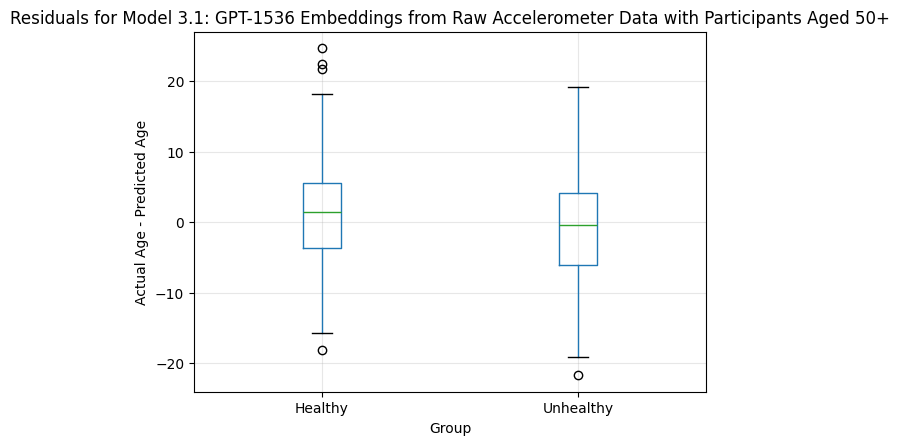

Residuals for Model 3.1: GPT-1536 Embeddings from Raw Accelerometer Data with Participants Aged 50+
Average residual (Healthy): 1.30
Average residual (Unhealthy): -0.70


In [30]:
residuals = y_test - y_pred_gpt1536_raw_50

seqn_test = gpt1536_raw_50plus.loc[y_test.index, 'SEQN']

mask_healthy = seqn_test.isin(healthy_participants)
mask_unhealthy = seqn_test.isin(unhealthy_participants)

avg_resid_healthy = residuals[mask_healthy].mean()
avg_resid_unhealthy = residuals[mask_unhealthy].mean()

residuals_df = pd.DataFrame({
    'Residual': residuals,
    'Group': np.where(mask_healthy, 'Healthy', 'Unhealthy')
})

plt.figure(figsize=(8,6))
residuals_df.boxplot(column='Residual', by='Group')
plt.title('Residuals for Model 3.1: GPT-1536 Embeddings from Raw Accelerometer Data with Participants Aged 50+')
plt.suptitle('')
plt.ylabel('Actual Age - Predicted Age')
plt.grid(alpha=0.3)
plt.show()

print('Residuals for Model 3.1: GPT-1536 Embeddings from Raw Accelerometer Data with Participants Aged 50+')
print(f"Average residual (Healthy): {avg_resid_healthy:.2f}")
print(f"Average residual (Unhealthy): {avg_resid_unhealthy:.2f}")

In [36]:
gpt1536

,SEQN,Gender,Age,Race,PIR,var1,var2,var3,var4,var5,...,var1530,var1531,var1532,var1533,var1534,var1535,var1536,BMXBMI,Activity_Risk,BMI_Risk
0,21009.0,1.0,55.0,3.0,3.79,-0.020721,0.036708,0.018236,0.032001,0.015751,...,-0.009532,0.025848,-0.013490,0.017578,-0.014686,0.013871,0.038339,31.26,False,True
1,21010.0,2.0,52.0,3.0,1.24,-0.019856,0.037008,0.018014,0.029559,0.018915,...,-0.010193,0.026086,-0.014090,0.017033,-0.015137,0.013931,0.036716,25.49,False,True
2,21012.0,1.0,63.0,4.0,0.89,-0.023683,0.037670,0.018928,0.034014,0.018000,...,-0.007722,0.024623,-0.012861,0.015139,-0.016252,0.017298,0.033325,19.60,False,False
3,21015.0,1.0,83.0,3.0,1.20,-0.022617,0.037035,0.020048,0.037168,0.018664,...,-0.008726,0.023909,-0.012913,0.015282,-0.014577,0.017852,0.034558,28.32,False,True
4,21017.0,2.0,37.0,1.0,0.21,-0.021043,0.038962,0.018168,0.039172,0.015018,...,-0.012051,0.025625,-0.012090,0.017394,-0.013797,0.015858,0.039408,19.34,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6938,41460.0,1.0,71.0,3.0,5.00,-0.019062,0.038703,0.018389,0.029258,0.016621,...,-0.010942,0.025947,-0.013904,0.016608,-0.015051,0.013079,0.036936,28.66,False,True
6939,41466.0,2.0,58.0,5.0,1.34,-0.023557,0.037621,0.018049,0.036926,0.021658,...,-0.010468,0.022821,-0.011899,0.014893,-0.010669,0.019519,0.034974,33.65,False,True
6940,41468.0,2.0,66.0,1.0,1.78,-0.022222,0.036856,0.019927,0.030435,0.015178,...,-0.008730,0.025141,-0.016159,0.014859,-0.017261,0.015788,0.034893,26.44,False,True
6941,41472.0,1.0,34.0,3.0,3.66,-0.022154,0.037848,0.017453,0.033829,0.014314,...,-0.010841,0.025070,-0.014025,0.016823,-0.015365,0.013999,0.037979,26.23,False,True


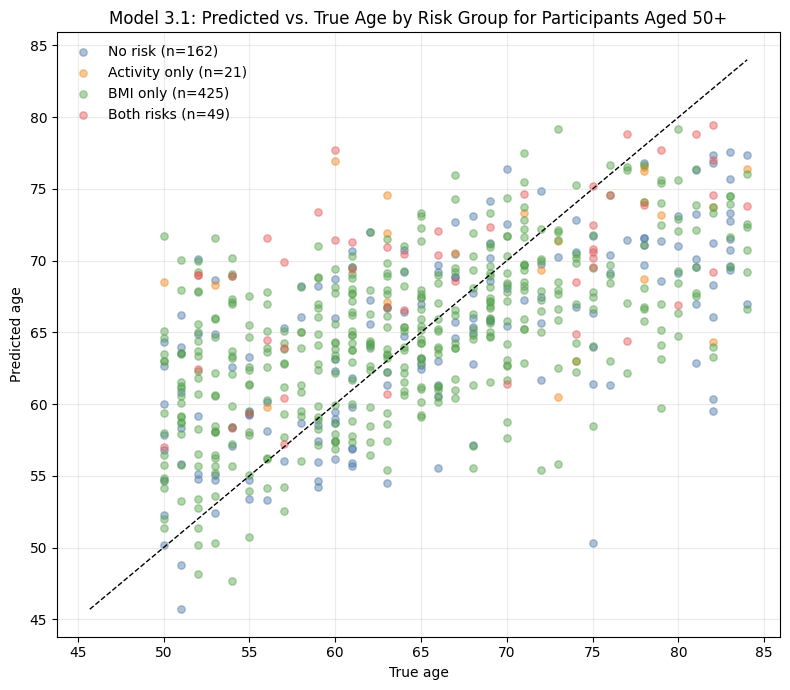

/var/folders/dz/ggx10pdx1p91s2hsnvsw_sy40000gn/T/ipykernel_12821/2916845394.py:64: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = plt.boxplot(


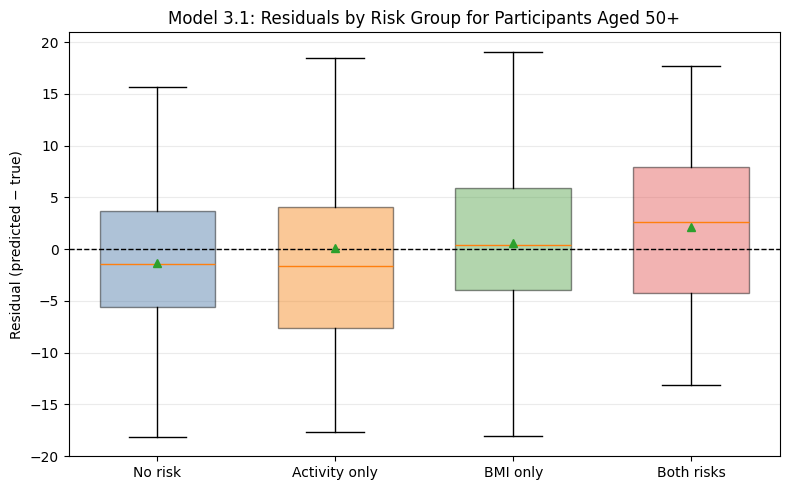

                 n   mae  mean_residual  rmse
group                                        
No risk        162  6.28          -1.30  7.92
Activity only   21  8.03           0.07  9.74
BMI only       425  5.88           0.56  7.40
Both risks      49  7.07           2.18  8.54


In [37]:
eval_df_raw_gpt1536 = gpt1536.loc[y_test.index, ['Activity_Risk', 'BMI_Risk', 'SEQN']].copy()
eval_df_raw_gpt1536['y_true'] = y_test.values
eval_df_raw_gpt1536['y_pred'] = y_pred_gpt1536_raw_50


eval_df_raw_gpt1536['activity_risk'] = eval_df_raw_gpt1536['Activity_Risk'].astype(bool)
eval_df_raw_gpt1536['bmi_risk'] = eval_df_raw_gpt1536['BMI_Risk'].astype(bool)

# Create mutually exclusive groups
def label_group(row):
    a, b = row['activity_risk'], row['bmi_risk']
    if a and b:
        return 'Both risks'
    elif a and not b:
        return 'Activity only'
    elif not a and b:
        return 'BMI only'
    else:
        return 'No risk'

eval_df_raw_gpt1536['group'] = eval_df_raw_gpt1536.apply(label_group, axis=1)

# --- 1) Calibration scatter: true vs predicted by group ---
group_order = ['No risk', 'Activity only', 'BMI only', 'Both risks']
group_colors = {
    'No risk': '#4C78A8',        # blue-ish
    'Activity only': '#F58518',  # orange
    'BMI only': '#54A24B',       # green
    'Both risks': '#E45756'      # red
}

plt.figure(figsize=(8, 7))
for g in group_order:
    m = eval_df_raw_gpt1536['group'] == g
    plt.scatter(
        eval_df_raw_gpt1536.loc[m, 'y_true'],
        eval_df_raw_gpt1536.loc[m, 'y_pred'],
        alpha=0.45,
        s=28,
        label=f"{g} (n={m.sum()})",
        c=group_colors[g]
    )

# 45° reference line
lo = np.min([eval_df_raw_gpt1536['y_true'].min(), eval_df_raw_gpt1536['y_pred'].min()])
hi = np.max([eval_df_raw_gpt1536['y_true'].max(), eval_df_raw_gpt1536['y_pred'].max()])
plt.plot([lo, hi], [lo, hi], linestyle='--', linewidth=1, color='black')

plt.xlabel('True age')
plt.ylabel('Predicted age')
plt.title('Model 3.1: Predicted vs. True Age by Risk Group for Participants Aged 50+')
plt.legend(frameon=False)
plt.grid(alpha=0.25)
plt.tight_layout()
plt.show()

# --- 2) Residuals by group (pred - true): bias visualization ---
eval_df_raw_gpt1536['residual'] = eval_df_raw_gpt1536['y_pred'] - eval_df_raw_gpt1536['y_true']

data_for_box = [eval_df_raw_gpt1536.loc[eval_df_raw_gpt1536['group'] == g, 'residual'].values for g in group_order]
box_colors = [group_colors[g] for g in group_order]

plt.figure(figsize=(8, 5))
bp = plt.boxplot(
    data_for_box,
    labels=group_order,
    showfliers=False,
    widths=0.65,
    patch_artist=True,
    showmeans=True
)

# Color the boxes
for patch, color in zip(bp['boxes'], box_colors):
    patch.set_facecolor(color)
    patch.set_alpha(0.45)

# Add a 0 baseline (no bias)
plt.axhline(0, linestyle='--', linewidth=1, color='black')

plt.ylabel('Residual (predicted − true)')
plt.title('Model 3.1: Residuals by Risk Group for Participants Aged 50+')
plt.grid(axis='y', alpha=0.25)
plt.tight_layout()
plt.show()

summary = (
    eval_df_raw_gpt1536.groupby('group')
           .agg(n=('residual', 'size'),
                mae=('residual', lambda x: np.mean(np.abs(x))),
                mean_residual=('residual', 'mean'),
                rmse=('residual', lambda x: np.sqrt(np.mean(x**2))))
           .reindex(group_order)
           .round(2)
)
print(summary)


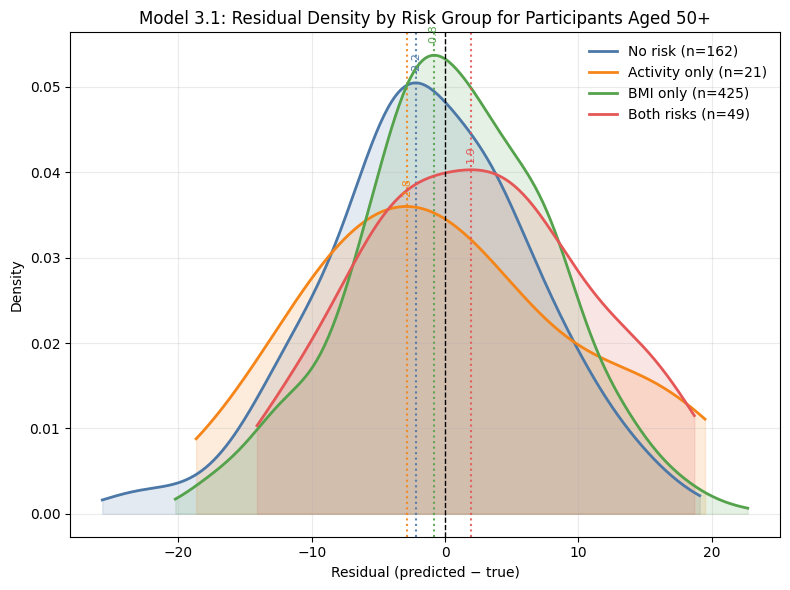

In [33]:
eval_df_raw_gpt1536['residual'] = eval_df_raw_gpt1536['y_pred'] - eval_df_raw_gpt1536['y_true']

group_order = ['No risk', 'Activity only', 'BMI only', 'Both risks']
group_colors = {
    'No risk': '#4C78A8',
    'Activity only': '#F58518',
    'BMI only': '#54A24B',
    'Both risks': '#E45756'
}

plt.figure(figsize=(8, 6))

for g in group_order:
    resid = eval_df_raw_gpt1536.loc[eval_df_raw_gpt1536['group'] == g, 'residual'].values
    if len(resid) < 2: 
        continue
    kde = gaussian_kde(resid)
    xs = np.linspace(resid.min() - 1, resid.max() + 1, 300)
    ys = kde(xs)
    plt.plot(xs, ys, label=f"{g} (n={len(resid)})",
             color=group_colors[g], linewidth=2)
   
    plt.fill_between(xs, ys, color=group_colors[g], alpha=0.15)

    mode_x = xs[np.argmax(ys)]
    plt.axvline(mode_x, color=group_colors[g], linestyle=':', linewidth=1.5,
                alpha=0.9)
    plt.text(mode_x, max(ys)*1.02, f"{mode_x:.1f}", color=group_colors[g],
             ha='center', va='bottom', fontsize=8, rotation=90)

plt.axvline(0, linestyle='--', color='black', linewidth=1)
plt.xlabel('Residual (predicted − true)')
plt.ylabel('Density')
plt.title('Model 3.1: Residual Density by Risk Group for Participants Aged 50+')
plt.legend(frameon=False)
plt.grid(alpha=0.25)
plt.tight_layout()
plt.show()

In [39]:
eval_df_raw_gpt1536

,Activity_Risk,BMI_Risk,SEQN,y_true,y_pred,activity_risk,bmi_risk,group,residual
4575,False,True,34534.0,52.0,62.277658,False,True,BMI only,10.277658
2171,False,True,27327.0,74.0,62.208666,False,True,BMI only,-11.791334
3356,False,True,30711.0,59.0,64.125622,False,True,BMI only,5.125622
3347,False,True,30684.0,65.0,60.134522,False,True,BMI only,-4.865478
2927,False,True,29536.0,65.0,59.248852,False,True,BMI only,-5.751148
...,...,...,...,...,...,...,...,...,...
140,False,True,21393.0,66.0,61.260221,False,True,BMI only,-4.739779
6258,False,True,39454.0,67.0,60.400140,False,True,BMI only,-6.599860
6033,False,True,38853.0,60.0,59.930628,False,True,BMI only,-0.069372
3830,False,True,32216.0,53.0,56.267396,False,True,BMI only,3.267396


In [42]:
gpt1536_raw_50plus_analysis

,Activity_Risk,BMI_Risk,SEQN,y_true,y_pred,group,residual
4575,False,True,34534.0,52.0,62.277658,BMI only,10.277658
2171,False,True,27327.0,74.0,62.208666,BMI only,-11.791334
3356,False,True,30711.0,59.0,64.125622,BMI only,5.125622
3347,False,True,30684.0,65.0,60.134522,BMI only,-4.865478
2927,False,True,29536.0,65.0,59.248852,BMI only,-5.751148
...,...,...,...,...,...,...,...
140,False,True,21393.0,66.0,61.260221,BMI only,-4.739779
6258,False,True,39454.0,67.0,60.400140,BMI only,-6.599860
6033,False,True,38853.0,60.0,59.930628,BMI only,-0.069372
3830,False,True,32216.0,53.0,56.267396,BMI only,3.267396


In [41]:
gpt1536_raw_50plus_analysis = eval_df_raw_gpt1536.drop(columns=['activity_risk', 'bmi_risk'])
gpt1536_raw_50plus_analysis.to_csv('gpt1536_raw_50plus_analysis.csv', index=False)

### OTC Data GPT50

In [192]:
X = gpt50_otc.drop(columns=["Age", 'SEQN', 'Activity_Risk', 'BMI_Risk'], errors="ignore")
y = gpt50_otc["Age"]

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

X_scaler = StandardScaler()

X_train_scaled = X_scaler.fit_transform(X_train)
X_test_scaled = X_scaler.transform(X_test)

X_train_scaled = pd.DataFrame(X_train_scaled, columns=X_train.columns)
X_test_scaled = pd.DataFrame(X_test_scaled, columns=X_test.columns)

lr_gpt50_otc = LinearRegression()
lr_gpt50_otc.fit(X_train_scaled, y_train)
y_pred_gpt50_otc = lr_gpt50_otc.predict(X_test_scaled)
rmse_gpt50_otc = np.sqrt(mean_squared_error(y_test, y_pred_gpt50_otc))
r_gpt50_otc = stats.pearsonr(y_test, y_pred_gpt50_otc)[0]

print("Model 4: GPT-50 Embeddings from OTC Data with All Participants")
print(f"RMSE for test set: {rmse_gpt50_otc}")
print(f"R Squared for test set: {r_gpt50_otc}")

Model 4: GPT-50 Embeddings from OTC Data with All Participants
RMSE for test set: 14.958383477021718
R Squared for test set: 0.5346899716387183


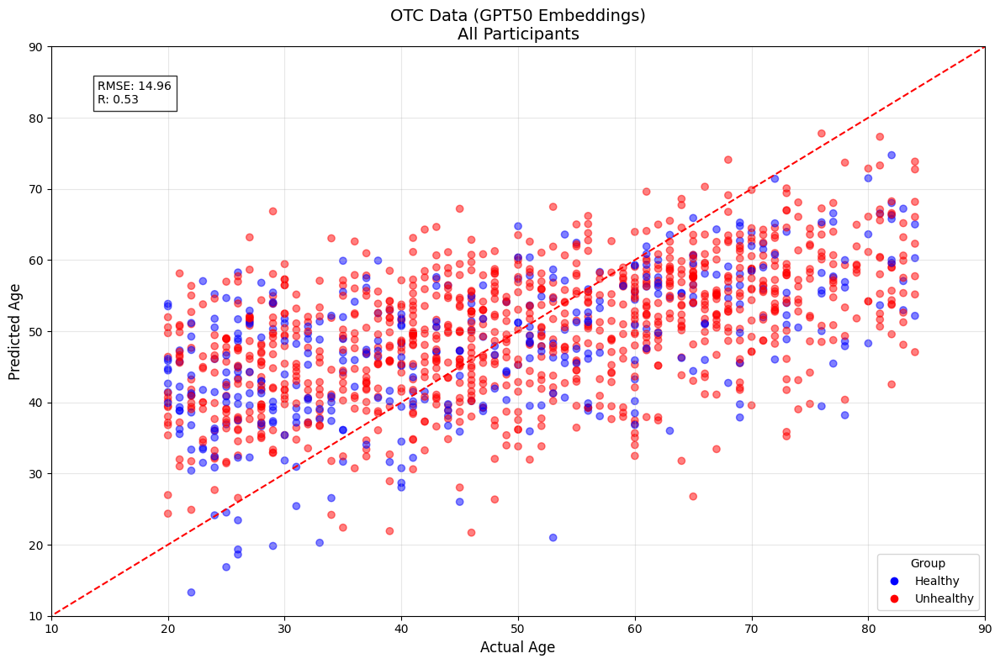

In [193]:
colors = [
    'blue' if seqn in healthy_participants else 'red'
    for seqn in gpt50_otc.loc[y_test.index, 'SEQN']
]

plt.figure(figsize=(12, 8))
plt.scatter(y_test, y_pred_gpt50_otc, c=colors, alpha=0.5)

plt.plot([0, 90], [0, 90], 'r--', label='Perfect Prediction')

plt.xlim(10, 90)
plt.ylim(10, 90)

plt.xlabel('Actual Age', fontsize=12)
plt.ylabel('Predicted Age', fontsize=12)
plt.title('OTC Data (GPT50 Embeddings)\nAll Participants', fontsize=14)

plt.grid(True, alpha=0.3)
plt.legend()

custom_lines = [Line2D([0], [0], marker='o', color='w', label='Healthy',
                      markerfacecolor='blue', markersize=8),
                Line2D([0], [0], marker='o', color='w', label='Unhealthy',
                      markerfacecolor='red', markersize=8)]
plt.legend(handles=custom_lines, title='Group')

metrics_text = f'RMSE: {rmse_gpt50_otc:.2f}\nR: {r_gpt50_otc:.2f}'
plt.text(0.05, 0.9, metrics_text, transform=plt.gca().transAxes, 
         bbox=dict(facecolor='white', alpha=0.8), fontsize=10)

plt.tight_layout()
plt.show()

<Figure size 800x600 with 0 Axes>

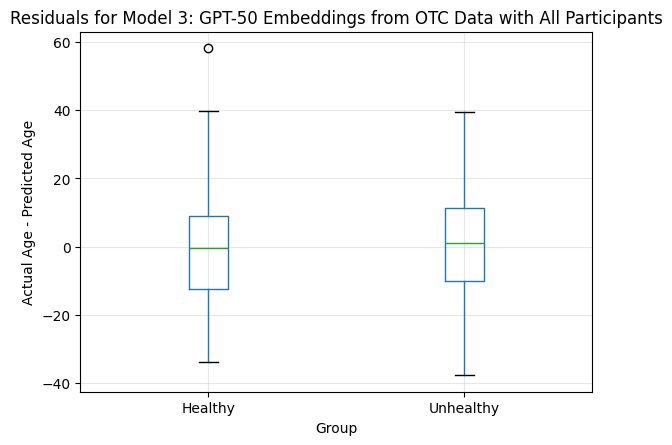

Residuals for Model 3: GPT-50 Embeddings from OTC Data with All Participants
Average residual (Healthy): -1.04
Average residual (Unhealthy): 0.44


In [194]:
residuals = y_test - y_pred_gpt50_otc

seqn_test = gpt50_otc.loc[y_test.index, 'SEQN']

mask_healthy = seqn_test.isin(healthy_participants)
mask_unhealthy = seqn_test.isin(unhealthy_participants)

avg_resid_healthy = residuals[mask_healthy].mean()
avg_resid_unhealthy = residuals[mask_unhealthy].mean()

residuals_df = pd.DataFrame({
    'Residual': residuals,
    'Group': np.where(mask_healthy, 'Healthy', 'Unhealthy')
})

plt.figure(figsize=(8,6))
residuals_df.boxplot(column='Residual', by='Group')
plt.title('Residuals for Model 3: GPT-50 Embeddings from OTC Data with All Participants')
plt.suptitle('')
plt.ylabel('Actual Age - Predicted Age')
plt.grid(alpha=0.3)
plt.show()

print('Residuals for Model 3: GPT-50 Embeddings from OTC Data with All Participants')
print(f"Average residual (Healthy): {avg_resid_healthy:.2f}")
print(f"Average residual (Unhealthy): {avg_resid_unhealthy:.2f}")

#### Risk Factor Analysis

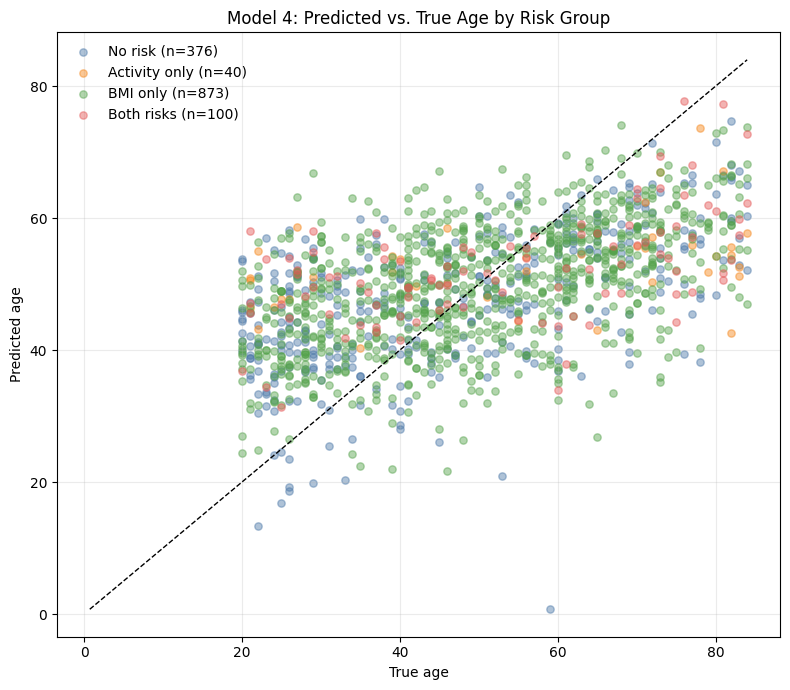

/var/folders/dz/ggx10pdx1p91s2hsnvsw_sy40000gn/T/ipykernel_37523/252852818.py:64: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = plt.boxplot(


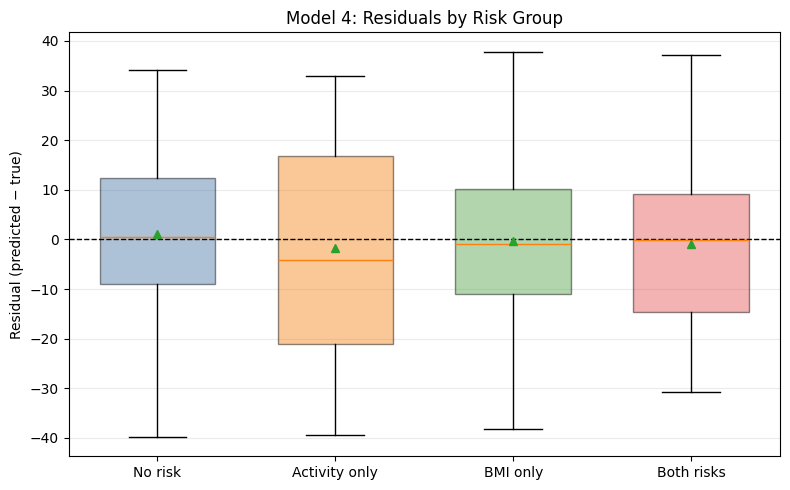

                 n    mae  mean_residual   rmse
group                                          
No risk        376  12.65           1.04  15.41
Activity only   40  18.40          -1.82  20.87
BMI only       873  11.81          -0.32  14.24
Both risks     100  13.81          -0.96  16.48


In [195]:
eval_df_otc_gpt50 = gpt50_otc.loc[y_test.index, ['Activity_Risk', 'BMI_Risk']].copy()
eval_df_otc_gpt50['y_true'] = y_test.values
eval_df_otc_gpt50['y_pred'] = y_pred_gpt50_otc


eval_df_otc_gpt50['activity_risk'] = eval_df_otc_gpt50['Activity_Risk'].astype(bool)
eval_df_otc_gpt50['bmi_risk'] = eval_df_otc_gpt50['BMI_Risk'].astype(bool)

# Create mutually exclusive groups
def label_group(row):
    a, b = row['activity_risk'], row['bmi_risk']
    if a and b:
        return 'Both risks'
    elif a and not b:
        return 'Activity only'
    elif not a and b:
        return 'BMI only'
    else:
        return 'No risk'

eval_df_otc_gpt50['group'] = eval_df_otc_gpt50.apply(label_group, axis=1)

# --- 1) Calibration scatter: true vs predicted by group ---
group_order = ['No risk', 'Activity only', 'BMI only', 'Both risks']
group_colors = {
    'No risk': '#4C78A8',        # blue-ish
    'Activity only': '#F58518',  # orange
    'BMI only': '#54A24B',       # green
    'Both risks': '#E45756'      # red
}

plt.figure(figsize=(8, 7))
for g in group_order:
    m = eval_df_otc_gpt50['group'] == g
    plt.scatter(
        eval_df_otc_gpt50.loc[m, 'y_true'],
        eval_df_otc_gpt50.loc[m, 'y_pred'],
        alpha=0.45,
        s=28,
        label=f"{g} (n={m.sum()})",
        c=group_colors[g]
    )

# 45° reference line
lo = np.min([eval_df_otc_gpt50['y_true'].min(), eval_df_otc_gpt50['y_pred'].min()])
hi = np.max([eval_df_otc_gpt50['y_true'].max(), eval_df_otc_gpt50['y_pred'].max()])
plt.plot([lo, hi], [lo, hi], linestyle='--', linewidth=1, color='black')

plt.xlabel('True age')
plt.ylabel('Predicted age')
plt.title('Model 4: Predicted vs. True Age by Risk Group')
plt.legend(frameon=False)
plt.grid(alpha=0.25)
plt.tight_layout()
plt.show()

# --- 2) Residuals by group (pred - true): bias visualization ---
eval_df_otc_gpt50['residual'] = eval_df_otc_gpt50['y_pred'] - eval_df_otc_gpt50['y_true']

data_for_box = [eval_df_otc_gpt50.loc[eval_df_otc_gpt50['group'] == g, 'residual'].values for g in group_order]
box_colors = [group_colors[g] for g in group_order]

plt.figure(figsize=(8, 5))
bp = plt.boxplot(
    data_for_box,
    labels=group_order,
    showfliers=False,
    widths=0.65,
    patch_artist=True,
    showmeans=True
)

# Color the boxes
for patch, color in zip(bp['boxes'], box_colors):
    patch.set_facecolor(color)
    patch.set_alpha(0.45)

# Add a 0 baseline (no bias)
plt.axhline(0, linestyle='--', linewidth=1, color='black')

plt.ylabel('Residual (predicted − true)')
plt.title('Model 4: Residuals by Risk Group')
plt.grid(axis='y', alpha=0.25)
plt.tight_layout()
plt.show()

summary = (
    eval_df_otc_gpt50.groupby('group')
           .agg(n=('residual', 'size'),
                mae=('residual', lambda x: np.mean(np.abs(x))),
                mean_residual=('residual', 'mean'),
                rmse=('residual', lambda x: np.sqrt(np.mean(x**2))))
           .reindex(group_order)
           .round(2)
)
print(summary)


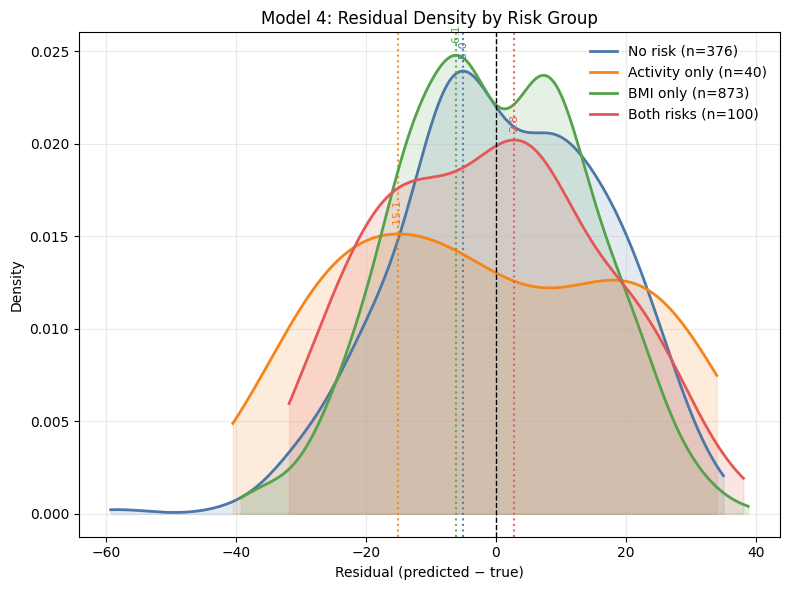

In [196]:
eval_df_otc_gpt50['residual'] = eval_df_otc_gpt50['y_pred'] - eval_df_otc_gpt50['y_true']

group_order = ['No risk', 'Activity only', 'BMI only', 'Both risks']
group_colors = {
    'No risk': '#4C78A8',
    'Activity only': '#F58518',
    'BMI only': '#54A24B',
    'Both risks': '#E45756'
}

plt.figure(figsize=(8, 6))

for g in group_order:
    resid = eval_df_otc_gpt50.loc[eval_df_otc_gpt50['group'] == g, 'residual'].values
    if len(resid) < 2: 
        continue
    kde = gaussian_kde(resid)
    xs = np.linspace(resid.min() - 1, resid.max() + 1, 300)
    ys = kde(xs)
    plt.plot(xs, ys, label=f"{g} (n={len(resid)})",
             color=group_colors[g], linewidth=2)
   
    plt.fill_between(xs, ys, color=group_colors[g], alpha=0.15)

    mode_x = xs[np.argmax(ys)]
    plt.axvline(mode_x, color=group_colors[g], linestyle=':', linewidth=1.5,
                alpha=0.9)
    plt.text(mode_x, max(ys)*1.02, f"{mode_x:.1f}", color=group_colors[g],
             ha='center', va='bottom', fontsize=8, rotation=90)

plt.axvline(0, linestyle='--', color='black', linewidth=1)
plt.xlabel('Residual (predicted − true)')
plt.ylabel('Density')
plt.title('Model 4: Residual Density by Risk Group')
plt.legend(frameon=False)
plt.grid(alpha=0.25)
plt.tight_layout()
plt.show()

#### 50+

In [109]:
gpt50_otc_50plus = gpt50_otc[gpt50_otc['Age'] >= 50]

X = gpt50_otc_50plus.drop(columns=["Age", 'SEQN', 'Activity_Risk', 'BMI_Risk'], errors="ignore")
y = gpt50_otc_50plus["Age"]

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

X_scaler = StandardScaler()

X_train_scaled = X_scaler.fit_transform(X_train)
X_test_scaled = X_scaler.transform(X_test)

X_train_scaled = pd.DataFrame(X_train_scaled, columns=X_train.columns)
X_test_scaled = pd.DataFrame(X_test_scaled, columns=X_test.columns)

lr_gpt50_otc_50 = LinearRegression()
lr_gpt50_otc_50.fit(X_train_scaled, y_train)
y_pred_gpt50_otc_50 = lr_gpt50_otc_50.predict(X_test_scaled)
rmse_gpt50_otc_50 = np.sqrt(mean_squared_error(y_test, y_pred_gpt50_otc_50))
r_gpt50_otc_50 = stats.pearsonr(y_test, y_pred_gpt50_otc_50)[0]

print("Model 4.1: GPT-50 Embeddings from OTC Data with Participants Aged 50+\n")
print(f"RMSE for test set (healthy participants): {rmse_gpt50_otc_50}")
print(f"R Squared for test set (healthy participants): {r_gpt50_otc_50}")

Model 4.1: GPT-50 Embeddings from OTC Data with Participants Aged 50+

RMSE for test set (healthy participants): 8.57638516493856
R Squared for test set (healthy participants): 0.47824548832788694


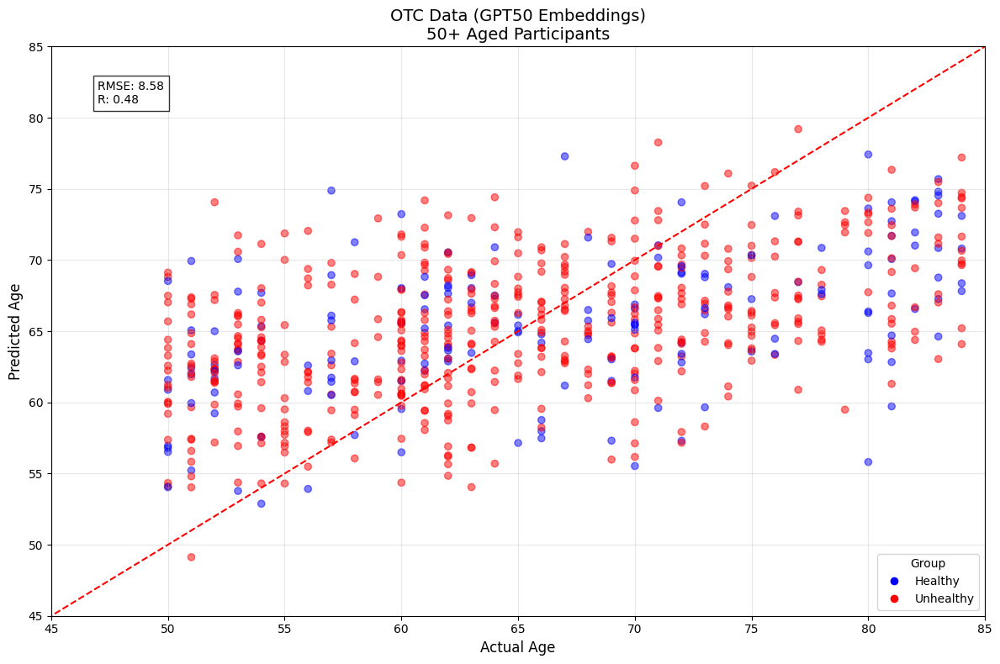

In [110]:
colors = [
    'blue' if seqn in healthy_participants else 'red'
    for seqn in gpt50_otc_50plus.loc[y_test.index, 'SEQN']
]

plt.figure(figsize=(12, 8))
plt.scatter(y_test, y_pred_gpt50_otc_50, c=colors, alpha=0.5)

plt.plot([0, 90], [0, 90], 'r--', label='Perfect Prediction')

plt.xlim(45, 85)
plt.ylim(45, 85)

plt.xlabel('Actual Age', fontsize=12)
plt.ylabel('Predicted Age', fontsize=12)
plt.title('OTC Data (GPT50 Embeddings)\n50+ Aged Participants', fontsize=14)

plt.grid(True, alpha=0.3)
plt.legend()

custom_lines = [Line2D([0], [0], marker='o', color='w', label='Healthy',
                      markerfacecolor='blue', markersize=8),
                Line2D([0], [0], marker='o', color='w', label='Unhealthy',
                      markerfacecolor='red', markersize=8)]
plt.legend(handles=custom_lines, title='Group')

metrics_text = f'RMSE: {rmse_gpt50_otc_50:.2f}\nR: {r_gpt50_otc_50:.2f}'
plt.text(0.05, 0.9, metrics_text, transform=plt.gca().transAxes, 
         bbox=dict(facecolor='white', alpha=0.8), fontsize=10)

plt.tight_layout()
plt.show()

<Figure size 800x600 with 0 Axes>

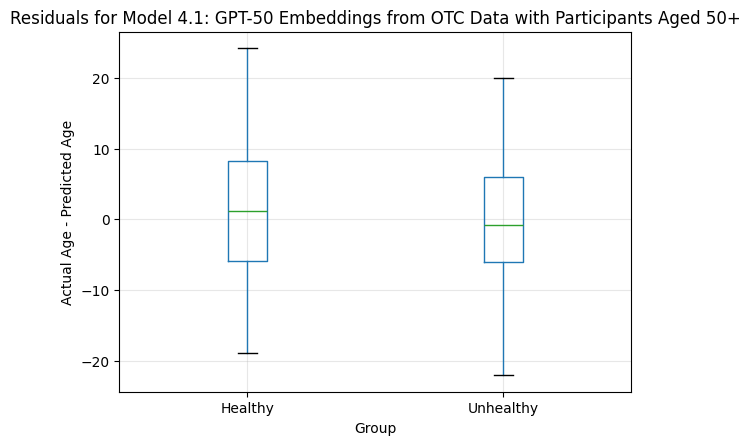

Residuals for Model 4.1: GPT-50 Embeddings from OTC Data with Participants Aged 50+
Average residual (Healthy): 1.28
Average residual (Unhealthy): -0.24


In [111]:
residuals = y_test - y_pred_gpt50_otc_50

seqn_test = gpt50_otc_50plus.loc[y_test.index, 'SEQN']

mask_healthy = seqn_test.isin(healthy_participants)
mask_unhealthy = seqn_test.isin(unhealthy_participants)

avg_resid_healthy = residuals[mask_healthy].mean()
avg_resid_unhealthy = residuals[mask_unhealthy].mean()

residuals_df = pd.DataFrame({
    'Residual': residuals,
    'Group': np.where(mask_healthy, 'Healthy', 'Unhealthy')
})

plt.figure(figsize=(8,6))
residuals_df.boxplot(column='Residual', by='Group')
plt.title('Residuals for Model 4.1: GPT-50 Embeddings from OTC Data with Participants Aged 50+')
plt.suptitle('')
plt.ylabel('Actual Age - Predicted Age')
plt.grid(alpha=0.3)
plt.show()

print('Residuals for Model 4.1: GPT-50 Embeddings from OTC Data with Participants Aged 50+')
print(f"Average residual (Healthy): {avg_resid_healthy:.2f}")
print(f"Average residual (Unhealthy): {avg_resid_unhealthy:.2f}")

### OTC Data GPT1536

In [197]:
X = gpt1536_otc.drop(columns=["Age", 'SEQN', 'Activity_Risk', 'BMI_Risk'], errors="ignore")
y = gpt1536_otc["Age"]

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

X_scaler = StandardScaler()

X_train_scaled = X_scaler.fit_transform(X_train)
X_test_scaled = X_scaler.transform(X_test)

X_train_scaled = pd.DataFrame(X_train_scaled, columns=X_train.columns)
X_test_scaled = pd.DataFrame(X_test_scaled, columns=X_test.columns)

ridge_otc1536 = RidgeCV(alphas=np.logspace(-6, 6, 13), store_cv_values=True)
ridge_otc1536.fit(X_train_scaled, y_train)

y_pred_gpt1536_otc = ridge_otc1536.predict(X_test_scaled)
rmse_gpt1536_otc = np.sqrt(mean_squared_error(y_test, y_pred_gpt1536_otc))
r_gpt1536_otc = stats.pearsonr(y_test, y_pred_gpt1536_otc)[0]

print("Model 5: GPT-1536 Embeddings from OTC Data with All Participants")
print(f"RMSE for test set: {rmse_gpt1536_otc}")
print(f"R Squared for test set: {r_gpt1536_otc}")

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/linear_model/_ridge.py:2341: FutureWarning: 'store_cv_values' is deprecated in version 1.5 and will be removed in 1.7. Use 'store_cv_results' instead.
  warnings.warn(


Model 5: GPT-1536 Embeddings from OTC Data with All Participants
RMSE for test set: 13.553903283860766
R Squared for test set: 0.6452452990944266


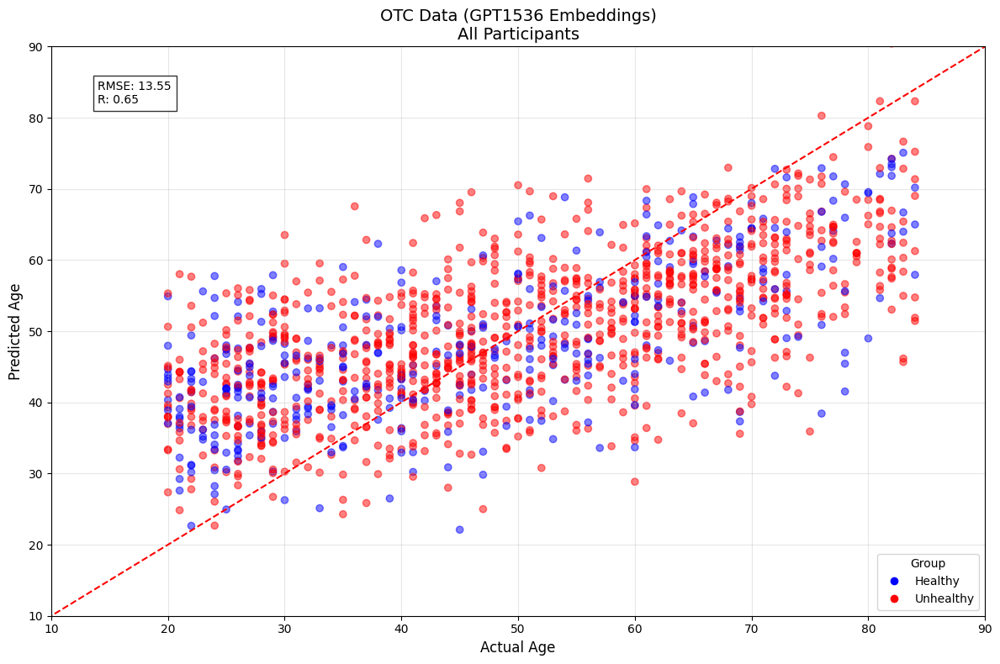

In [198]:
colors = [
    'blue' if seqn in healthy_participants else 'red'
    for seqn in gpt1536_otc.loc[y_test.index, 'SEQN']
]

plt.figure(figsize=(12, 8))
plt.scatter(y_test, y_pred_gpt1536_otc, c=colors, alpha=0.5)

plt.plot([0, 90], [0, 90], 'r--', label='Perfect Prediction')

plt.xlim(10, 90)
plt.ylim(10, 90)

plt.xlabel('Actual Age', fontsize=12)
plt.ylabel('Predicted Age', fontsize=12)
plt.title('OTC Data (GPT1536 Embeddings)\nAll Participants', fontsize=14)

plt.grid(True, alpha=0.3)
plt.legend()

custom_lines = [Line2D([0], [0], marker='o', color='w', label='Healthy',
                      markerfacecolor='blue', markersize=8),
                Line2D([0], [0], marker='o', color='w', label='Unhealthy',
                      markerfacecolor='red', markersize=8)]
plt.legend(handles=custom_lines, title='Group')

metrics_text = f'RMSE: {rmse_gpt1536_otc:.2f}\nR: {r_gpt1536_otc:.2f}'
plt.text(0.05, 0.9, metrics_text, transform=plt.gca().transAxes, 
         bbox=dict(facecolor='white', alpha=0.8), fontsize=10)

plt.tight_layout()
plt.show()

<Figure size 800x600 with 0 Axes>

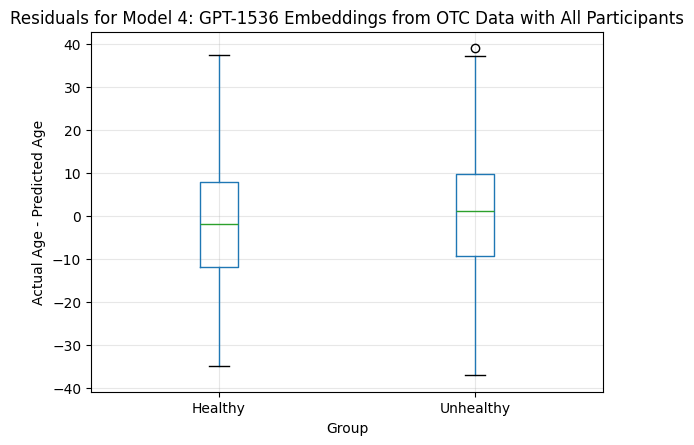

Residuals for Model 4: GPT-1536 Embeddings from OTC Data with All Participants
Average residual (Healthy): -1.56
Average residual (Unhealthy): 0.45


In [199]:
residuals = y_test - y_pred_gpt1536_otc

seqn_test = gpt1536_otc.loc[y_test.index, 'SEQN']

mask_healthy = seqn_test.isin(healthy_participants)
mask_unhealthy = seqn_test.isin(unhealthy_participants)

avg_resid_healthy = residuals[mask_healthy].mean()
avg_resid_unhealthy = residuals[mask_unhealthy].mean()

residuals_df = pd.DataFrame({
    'Residual': residuals,
    'Group': np.where(mask_healthy, 'Healthy', 'Unhealthy')
})

plt.figure(figsize=(8,6))
residuals_df.boxplot(column='Residual', by='Group')
plt.title('Residuals for Model 4: GPT-1536 Embeddings from OTC Data with All Participants')
plt.suptitle('')
plt.ylabel('Actual Age - Predicted Age')
plt.grid(alpha=0.3)
plt.show()

print('Residuals for Model 4: GPT-1536 Embeddings from OTC Data with All Participants')
print(f"Average residual (Healthy): {avg_resid_healthy:.2f}")
print(f"Average residual (Unhealthy): {avg_resid_unhealthy:.2f}")

#### Risk Factor Analysis

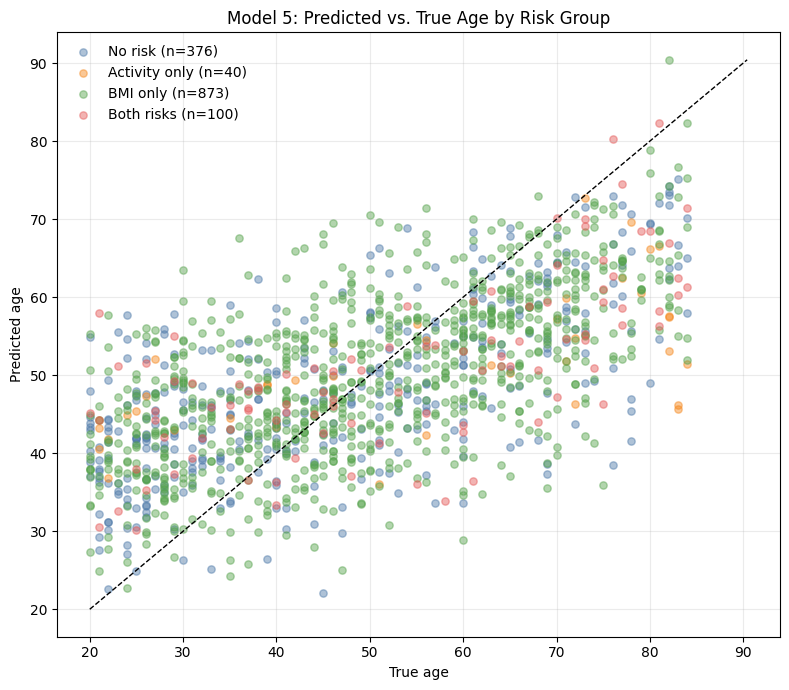

/var/folders/dz/ggx10pdx1p91s2hsnvsw_sy40000gn/T/ipykernel_37523/1519148050.py:64: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = plt.boxplot(


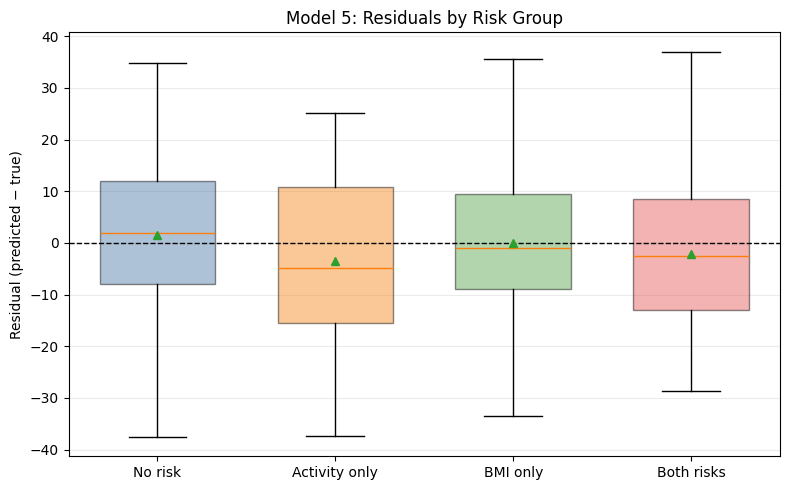

                 n    mae  mean_residual   rmse
group                                          
No risk        376  11.48           1.56  14.00
Activity only   40  16.30          -3.56  18.61
BMI only       873  10.56          -0.11  12.99
Both risks     100  11.78          -2.23  14.24


In [ ]:
eval_df_otc_gpt1536 = gpt1536_otc.loc[y_test.index, ['Activity_Risk', 'BMI_Risk']].copy()
eval_df_otc_gpt1536['y_true'] = y_test.values
eval_df_otc_gpt1536['y_pred'] = y_pred_gpt1536_otc


eval_df_otc_gpt1536['activity_risk'] = eval_df_otc_gpt1536['Activity_Risk'].astype(bool)
eval_df_otc_gpt1536['bmi_risk'] = eval_df_otc_gpt1536['BMI_Risk'].astype(bool)

def label_group(row):
    a, b = row['activity_risk'], row['bmi_risk']
    if a and b:
        return 'Both risks'
    elif a and not b:
        return 'Activity only'
    elif not a and b:
        return 'BMI only'
    else:
        return 'No risk'

eval_df_otc_gpt1536['group'] = eval_df_otc_gpt1536.apply(label_group, axis=1)

group_order = ['No risk', 'Activity only', 'BMI only', 'Both risks']
group_colors = {
    'No risk': '#4C78A8',        # blue-ish
    'Activity only': '#F58518',  # orange
    'BMI only': '#54A24B',       # green
    'Both risks': '#E45756'      # red
}

plt.figure(figsize=(8, 7))
for g in group_order:
    m = eval_df_otc_gpt1536['group'] == g
    plt.scatter(
        eval_df_otc_gpt1536.loc[m, 'y_true'],
        eval_df_otc_gpt1536.loc[m, 'y_pred'],
        alpha=0.45,
        s=28,
        label=f"{g} (n={m.sum()})",
        c=group_colors[g]
    )

lo = np.min([eval_df_otc_gpt1536['y_true'].min(), eval_df_otc_gpt1536['y_pred'].min()])
hi = np.max([eval_df_otc_gpt1536['y_true'].max(), eval_df_otc_gpt1536['y_pred'].max()])
plt.plot([lo, hi], [lo, hi], linestyle='--', linewidth=1, color='black')

plt.xlabel('True age')
plt.ylabel('Predicted age')
plt.title('Model 5: Predicted vs. True Age by Risk Group')
plt.legend(frameon=False)
plt.grid(alpha=0.25)
plt.tight_layout()
plt.show()

eval_df_otc_gpt1536['residual'] = eval_df_otc_gpt1536['y_pred'] - eval_df_otc_gpt1536['y_true']

data_for_box = [eval_df_otc_gpt1536.loc[eval_df_otc_gpt1536['group'] == g, 'residual'].values for g in group_order]
box_colors = [group_colors[g] for g in group_order]

plt.figure(figsize=(8, 5))
bp = plt.boxplot(
    data_for_box,
    labels=group_order,
    showfliers=False,
    widths=0.65,
    patch_artist=True,
    showmeans=True
)

for patch, color in zip(bp['boxes'], box_colors):
    patch.set_facecolor(color)
    patch.set_alpha(0.45)

plt.axhline(0, linestyle='--', linewidth=1, color='black')

plt.ylabel('Residual (predicted − true)')
plt.title('Model 5: Residuals by Risk Group')
plt.grid(axis='y', alpha=0.25)
plt.tight_layout()
plt.show()

summary = (
    eval_df_otc_gpt1536.groupby('group')
           .agg(n=('residual', 'size'),
                mae=('residual', lambda x: np.mean(np.abs(x))),
                mean_residual=('residual', 'mean'),
                rmse=('residual', lambda x: np.sqrt(np.mean(x**2))))
           .reindex(group_order)
           .round(2)
)
print(summary)


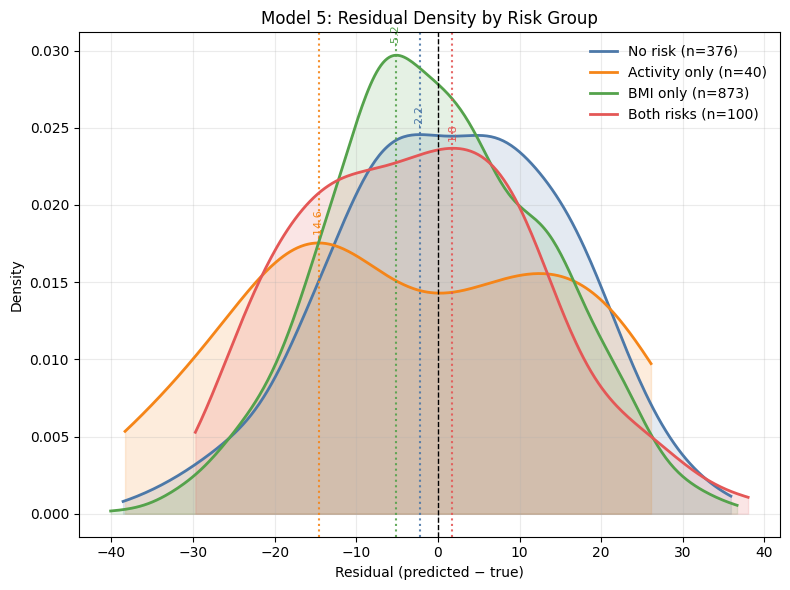

In [201]:
eval_df_otc_gpt1536['residual'] = eval_df_otc_gpt1536['y_pred'] - eval_df_otc_gpt1536['y_true']

group_order = ['No risk', 'Activity only', 'BMI only', 'Both risks']
group_colors = {
    'No risk': '#4C78A8',
    'Activity only': '#F58518',
    'BMI only': '#54A24B',
    'Both risks': '#E45756'
}

plt.figure(figsize=(8, 6))

for g in group_order:
    resid = eval_df_otc_gpt1536.loc[eval_df_otc_gpt1536['group'] == g, 'residual'].values
    if len(resid) < 2: 
        continue
    kde = gaussian_kde(resid)
    xs = np.linspace(resid.min() - 1, resid.max() + 1, 300)
    ys = kde(xs)
    plt.plot(xs, ys, label=f"{g} (n={len(resid)})",
             color=group_colors[g], linewidth=2)
   
    plt.fill_between(xs, ys, color=group_colors[g], alpha=0.15)

    mode_x = xs[np.argmax(ys)]
    plt.axvline(mode_x, color=group_colors[g], linestyle=':', linewidth=1.5,
                alpha=0.9)
    plt.text(mode_x, max(ys)*1.02, f"{mode_x:.1f}", color=group_colors[g],
             ha='center', va='bottom', fontsize=8, rotation=90)

plt.axvline(0, linestyle='--', color='black', linewidth=1)
plt.xlabel('Residual (predicted − true)')
plt.ylabel('Density')
plt.title('Model 5: Residual Density by Risk Group')
plt.legend(frameon=False)
plt.grid(alpha=0.25)
plt.tight_layout()
plt.show()

#### 50+

In [118]:
gpt1536_otc_50plus = gpt1536_otc[gpt1536_otc['Age'] >= 50]

X = gpt1536_otc_50plus.drop(columns=["Age", 'SEQN', 'Activity_Risk', 'BMI_Risk'], errors="ignore")
y = gpt1536_otc_50plus["Age"]

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

X_scaler = StandardScaler()

X_train_scaled = X_scaler.fit_transform(X_train)
X_test_scaled = X_scaler.transform(X_test)

X_train_scaled = pd.DataFrame(X_train_scaled, columns=X_train.columns)
X_test_scaled = pd.DataFrame(X_test_scaled, columns=X_test.columns)

ridge_otc1536_50 = RidgeCV(alphas=np.logspace(-6, 6, 13), store_cv_values=True)
ridge_otc1536_50.fit(X_train_scaled, y_train)

y_pred_gpt1536_otc_50 = ridge_otc1536_50.predict(X_test_scaled)
rmse_gpt1536_otc_50 = np.sqrt(mean_squared_error(y_test, y_pred_gpt1536_otc_50))
r_gpt1536_otc_50 = stats.pearsonr(y_test, y_pred_gpt1536_otc_50)[0]

print("Model 5.1: GPT-1536 Embeddings from OTC Data with Participants Aged 50+\n")
print(f"RMSE for test set: {rmse_gpt1536_otc_50}")
print(f"R Squared for test set: {r_gpt1536_otc_50}")

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/linear_model/_ridge.py:2341: FutureWarning: 'store_cv_values' is deprecated in version 1.5 and will be removed in 1.7. Use 'store_cv_results' instead.
  warnings.warn(


Model 5.1: GPT-1536 Embeddings from OTC Data with Participants Aged 50+

RMSE for test set: 8.389841683874593
R Squared for test set: 0.5109831581982163


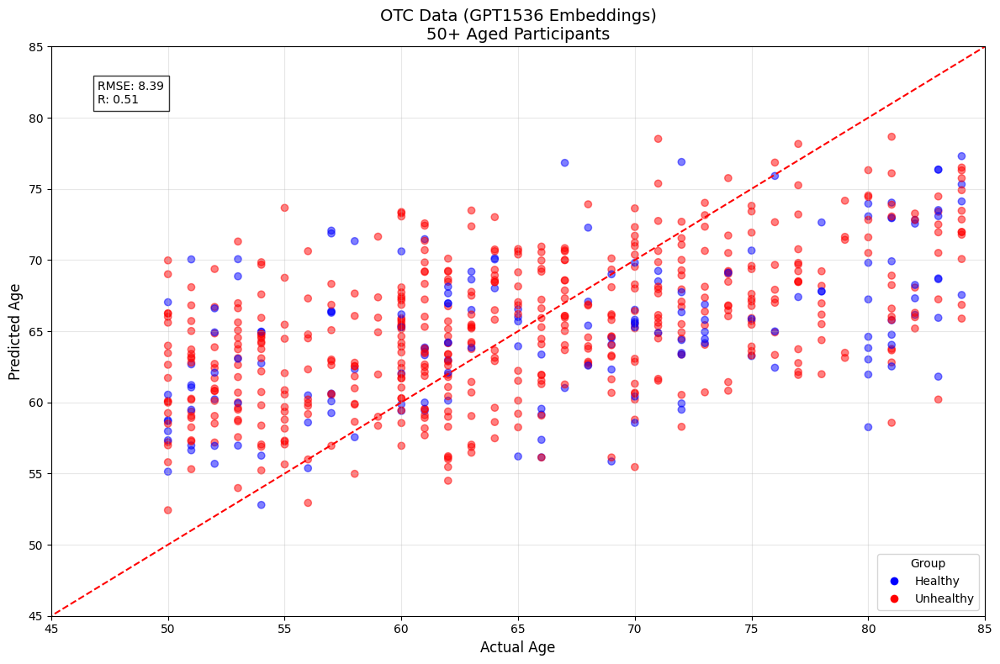

In [119]:
colors = [
    'blue' if seqn in healthy_participants else 'red'
    for seqn in gpt1536_otc_50plus.loc[y_test.index, 'SEQN']
]

plt.figure(figsize=(12, 8))
plt.scatter(y_test, y_pred_gpt1536_otc_50, c=colors, alpha=0.5)

plt.plot([0, 90], [0, 90], 'r--', label='Perfect Prediction')

plt.xlim(45, 85)
plt.ylim(45, 85)

plt.xlabel('Actual Age', fontsize=12)
plt.ylabel('Predicted Age', fontsize=12)
plt.title('OTC Data (GPT1536 Embeddings)\n50+ Aged Participants', fontsize=14)

plt.grid(True, alpha=0.3)
plt.legend()

custom_lines = [Line2D([0], [0], marker='o', color='w', label='Healthy',
                      markerfacecolor='blue', markersize=8),
                Line2D([0], [0], marker='o', color='w', label='Unhealthy',
                      markerfacecolor='red', markersize=8)]
plt.legend(handles=custom_lines, title='Group')

metrics_text = f'RMSE: {rmse_gpt1536_otc_50:.2f}\nR: {r_gpt1536_otc_50:.2f}'
plt.text(0.05, 0.9, metrics_text, transform=plt.gca().transAxes, 
         bbox=dict(facecolor='white', alpha=0.8), fontsize=10)

plt.tight_layout()
plt.show()

<Figure size 800x600 with 0 Axes>

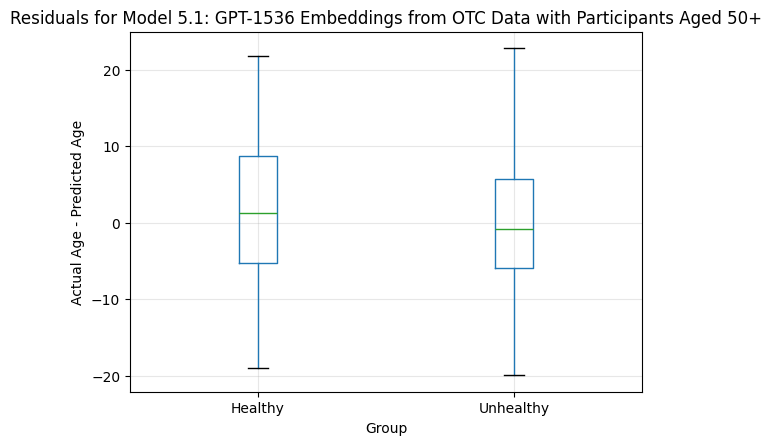

Residuals for Model 5.1: GPT-1536 Embeddings from OTC Data with Participants Aged 50+
Average residual (Healthy): 1.64
Average residual (Unhealthy): -0.23


In [120]:
residuals = y_test - y_pred_gpt1536_otc_50

seqn_test = gpt1536_otc_50plus.loc[y_test.index, 'SEQN']

mask_healthy = seqn_test.isin(healthy_participants)
mask_unhealthy = seqn_test.isin(unhealthy_participants)

avg_resid_healthy = residuals[mask_healthy].mean()
avg_resid_unhealthy = residuals[mask_unhealthy].mean()

residuals_df = pd.DataFrame({
    'Residual': residuals,
    'Group': np.where(mask_healthy, 'Healthy', 'Unhealthy')
})

plt.figure(figsize=(8,6))
residuals_df.boxplot(column='Residual', by='Group')
plt.title('Residuals for Model 5.1: GPT-1536 Embeddings from OTC Data with Participants Aged 50+')
plt.suptitle('')
plt.ylabel('Actual Age - Predicted Age')
plt.grid(alpha=0.3)
plt.show()

print('Residuals for Model 5.1: GPT-1536 Embeddings from OTC Data with Participants Aged 50+')
print(f"Average residual (Healthy): {avg_resid_healthy:.2f}")
print(f"Average residual (Unhealthy): {avg_resid_unhealthy:.2f}")

## Separate Unhealthy and Healthy

### OTC Data

In [22]:
healthy_otc_raw = otc_30[otc_30['SEQN'].isin(healthy_participants)]
unhealthy_otc_raw = otc_30[otc_30['SEQN'].isin(unhealthy_participants)]

In [16]:
X = healthy_otc_raw.drop(columns=["Age", 'SEQN', 'Activity_Risk', 'BMI_Risk'], errors="ignore")
y = healthy_otc_raw["Age"]

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

X_scaler = StandardScaler()

X_train_scaled = X_scaler.fit_transform(X_train)
X_test_scaled = X_scaler.transform(X_test)

X_train_scaled = pd.DataFrame(X_train_scaled, columns=X_train.columns)
X_test_scaled = pd.DataFrame(X_test_scaled, columns=X_test.columns)

lr_otc_raw = LinearRegression()
lr_otc_raw.fit(X_train_scaled, y_train)
y_pred_otc_raw = lr_otc_raw.predict(X_test_scaled)
rmse_otc_raw = np.sqrt(mean_squared_error(y_test, y_pred_otc_raw))
r_otc_raw = stats.pearsonr(y_test, y_pred_otc_raw)[0]

print(f"RMSE for test set (healthy participants): {rmse_otc_raw}")
print(f"R for test set (healthy participants): {r_otc_raw}")

NameError: name 'healthy_otc_raw' is not defined

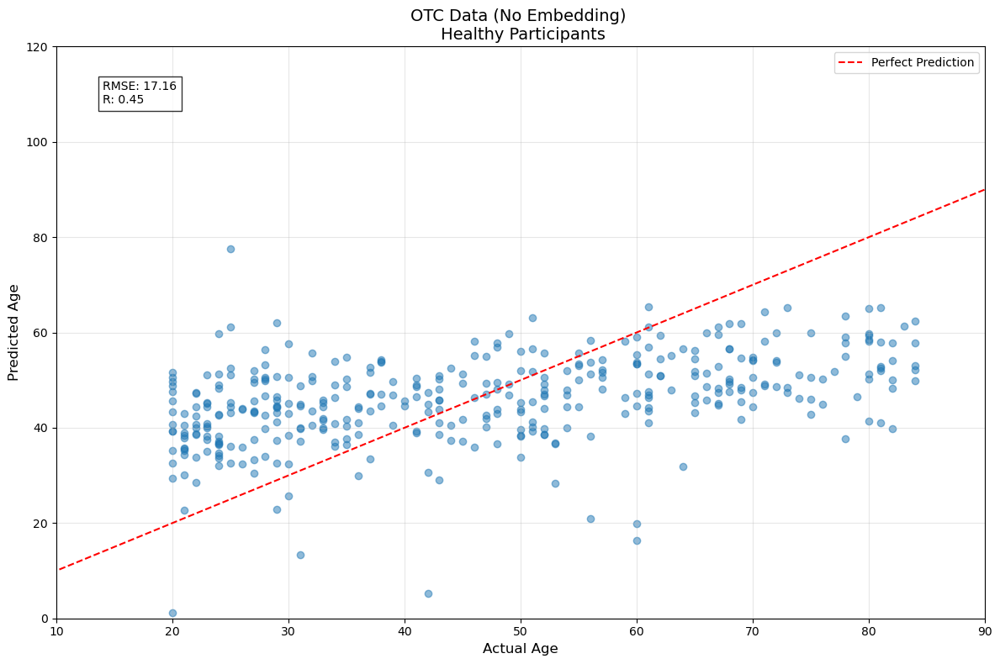


Prediction Statistics:
Mean Absolute Error: 14.44
Mean prediction: 46.05
Mean actual age: 46.51
Age range in test set: 20 to 84


In [23]:
plt.figure(figsize=(12, 8))

plt.scatter(y_test, y_pred_otc_raw, alpha=0.5)

plt.plot([0, 90], [0, 90], 'r--', label='Perfect Prediction')

plt.xlim(10, 90)
plt.ylim(0, 120)

plt.xlabel('Actual Age', fontsize=12)
plt.ylabel('Predicted Age', fontsize=12)
plt.title('OTC Data (No Embedding) \n Healthy Participants', fontsize=14)

plt.grid(True, alpha=0.3)
plt.legend()

metrics_text = f'RMSE: {rmse_otc_raw:.2f}\nR: {r_otc_raw:.2f}'
plt.text(0.05, 0.9, metrics_text, transform=plt.gca().transAxes, 
         bbox=dict(facecolor='white', alpha=0.8), fontsize=10)

plt.tight_layout()
plt.show()

print("\nPrediction Statistics:")
print(f"Mean Absolute Error: {mean_absolute_error(y_test, y_pred_otc_raw):.2f}")
print(f"Mean prediction: {y_pred_otc_raw.mean():.2f}")
print(f"Mean actual age: {y_test.mean():.2f}")
print(f"Age range in test set: {y_test.min():.0f} to {y_test.max():.0f}")

In [24]:
X_unhealthy = unhealthy_otc_raw.drop(columns=['Age', 'SEQN', 'Activity_Risk', 'BMI_Risk'], errors='ignore')
y_unhealthy = unhealthy_otc_raw['Age']

X_unhealthy_scaled = X_scaler.transform(X_unhealthy)
X_unhealthy_scaled = pd.DataFrame(X_unhealthy_scaled, columns=X_unhealthy.columns)

y_pred_otc_raw_unhealthy = lr_otc_raw.predict(X_unhealthy_scaled)

In [25]:
unhealthy_otc_raw['n_risks'] = (
    unhealthy_otc_raw['Activity_Risk'].astype(int) + 
    unhealthy_otc_raw['BMI_Risk'].astype(int)
)

plot_data = pd.DataFrame({
    'actual': y_unhealthy,
    'predicted': y_pred_otc_raw_unhealthy,
    'SEQN': unhealthy_otc_raw['SEQN']
})
plot_data = plot_data.merge(
    unhealthy_otc_raw[['SEQN', 'n_risks']], 
    on='SEQN', 
    how='left'
)

rmse_uunhealthy_otc_raw = np.sqrt(mean_squared_error(y_unhealthy, y_pred_otc_raw_unhealthy))
r_unhealthy_otc_raw = stats.pearsonr(y_unhealthy, y_pred_otc_raw_unhealthy)[0]

/var/folders/_r/p_dmz6p16p793l_ys27hs8rh0000gq/T/ipykernel_1757/5963405.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unhealthy_otc_raw['n_risks'] = (


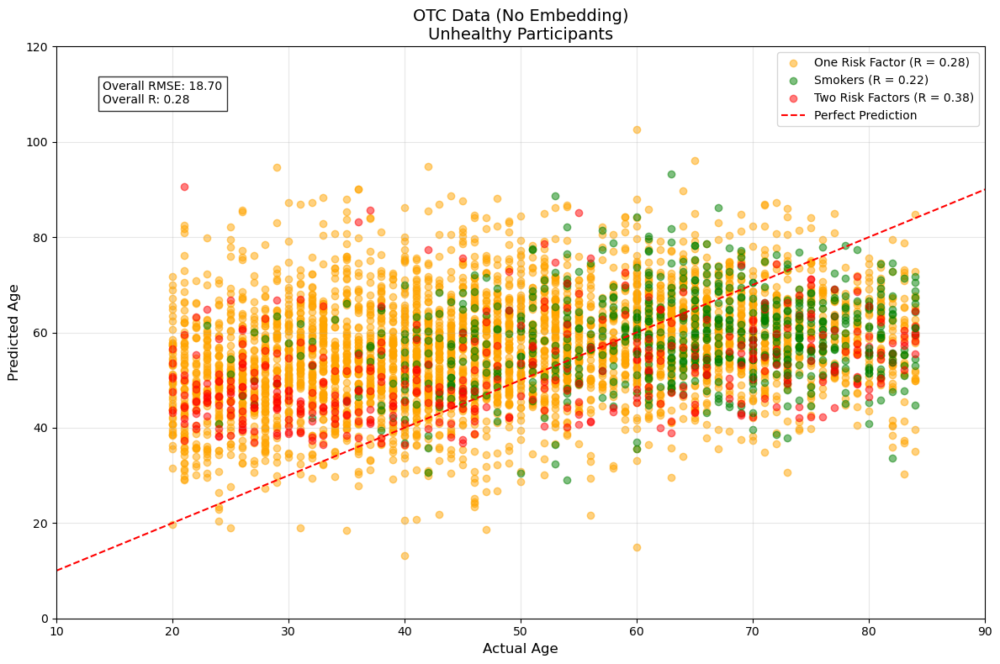


Detailed Statistics:
Number of smokers: 654

One Risk Factor:
Total participants: 4555
Number of smokers: 581
R: 0.278
Mean actual age: 50.06
Mean predicted age: 56.66

Two Risk Factors:
Total participants: 499
Number of smokers: 73
R: 0.383
Mean actual age: 51.39
Mean predicted age: 52.45


In [26]:
plt.figure(figsize=(12, 8))

colors = {1: 'orange', 2: 'red'}
labels = {1: 'One Risk Factor', 2: 'Two Risk Factors'}

# Calculate R for each risk group
r_by_risk = {}
for n_risks in [1, 2]:
    mask = plot_data['n_risks'] == n_risks
    r_by_risk[n_risks] = stats.pearsonr(
        plot_data[mask]['actual'], 
        plot_data[mask]['predicted']
    )[0]
    
    # Split each risk group into smokers and non-smokers
    smoker_mask = mask & plot_data['SEQN'].isin(cig_risk['SEQN'])
    smoker_r = stats.pearsonr(
        plot_data[smoker_mask]['actual'],
        plot_data[smoker_mask]['predicted']
    )[0]
    non_smoker_mask = mask & ~plot_data['SEQN'].isin(cig_risk['SEQN'])
    
    # Plot non-smokers with original colors
    plt.scatter(
        plot_data[non_smoker_mask]['actual'], 
        plot_data[non_smoker_mask]['predicted'], 
        alpha=0.5, 
        color=colors[n_risks], 
        label=f"{labels[n_risks]} (R = {r_by_risk[n_risks]:.2f})"
    )
    
    # Plot smokers in green
    plt.scatter(
        plot_data[smoker_mask]['actual'], 
        plot_data[smoker_mask]['predicted'], 
        alpha=0.5, 
        color='green', 
        label=f"Smokers (R = {smoker_r:.2f})" if n_risks == 1 else ""
    )
    
plt.plot([10, 120], [10, 120], 'r--', label='Perfect Prediction')

plt.xlim(10, 90)
plt.ylim(0, 120)

plt.xlabel('Actual Age', fontsize=12)
plt.ylabel('Predicted Age', fontsize=12)
plt.title('OTC Data (No Embedding)\nUnhealthy Participants', fontsize=14)

plt.grid(True, alpha=0.3)
plt.legend(fontsize=10)
plt.tight_layout()

metrics_text = f'Overall RMSE: {rmse_uunhealthy_otc_raw:.2f}\nOverall R: {r_unhealthy_otc_raw:.2f}'
plt.text(0.05, 0.9, metrics_text, transform=plt.gca().transAxes, 
         bbox=dict(facecolor='white', alpha=0.8), fontsize=10)

plt.show()

print("\nDetailed Statistics:")
smoker_mask = plot_data['SEQN'].isin(cig_risk['SEQN'])
print(f"Number of smokers: {smoker_mask.sum()}")

for n_risks in [1, 2]:
    mask = plot_data['n_risks'] == n_risks
    smoker_mask = mask & plot_data['SEQN'].isin(cig_risk['SEQN'])
    
    print(f"\n{labels[n_risks]}:")
    print(f"Total participants: {mask.sum()}")
    print(f"Number of smokers: {smoker_mask.sum()}")
    print(f"R: {r_by_risk[n_risks]:.3f}")
    print(f"Mean actual age: {plot_data[mask]['actual'].mean():.2f}")
    print(f"Mean predicted age: {plot_data[mask]['predicted'].mean():.2f}")

Number of extreme over-predictions found: 682

Average actual age: 38.11
Average predicted age: 67.75


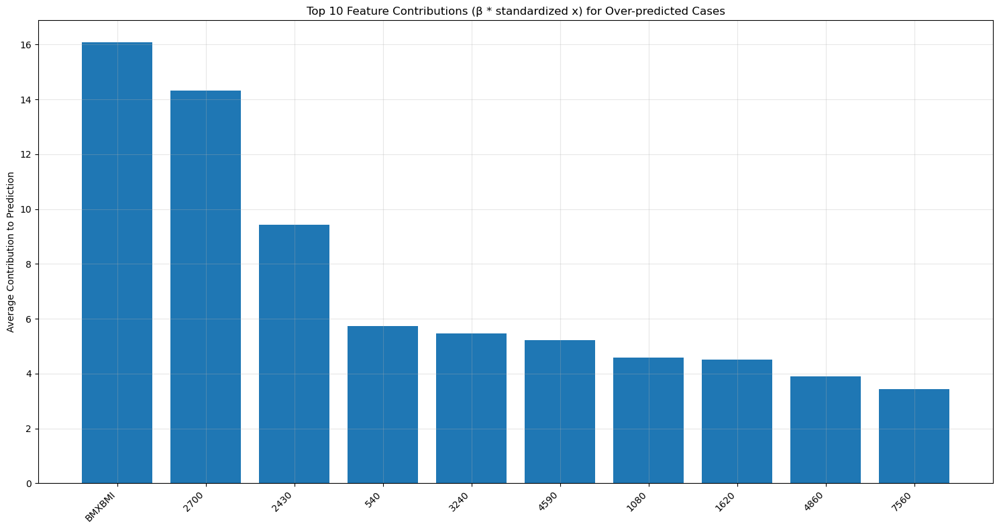


Detailed Analysis of Top Contributors:

Feature: BMXBMI
Beta (coefficient): 2.1092
Average standardized X value: 7.6236
Average contribution (β * standardized x): 16.0799
Range of standardized X values: 1.3527 to 55.0036

Feature: 2700
Beta (coefficient): -29.9702
Average standardized X value: -0.4777
Average contribution (β * standardized x): 14.3168
Range of standardized X values: -0.8575 to 2.0154

Feature: 2430
Beta (coefficient): 19.9511
Average standardized X value: -0.4726
Average contribution (β * standardized x): 9.4295
Range of standardized X values: -0.9307 to 1.9027

Feature: 540
Beta (coefficient): -25.4903
Average standardized X value: -0.2253
Average contribution (β * standardized x): 5.7421
Range of standardized X values: -1.8703 to 2.8327

Feature: 3240
Beta (coefficient): 12.0040
Average standardized X value: -0.4548
Average contribution (β * standardized x): 5.4592
Range of standardized X values: -0.7168 to 2.3003

Feature: 4590
Beta (coefficient): -14.2515
Average 

ModuleNotFoundError: No module named 'seaborn'

In [27]:
mask = (plot_data['actual'].between(20, 50)) & (plot_data['predicted'] > 60)
extreme_cases = plot_data[mask].copy()

extreme_features = X_unhealthy_scaled[X_unhealthy_scaled.index.isin(extreme_cases.index)]
coefficients = pd.Series(lr_otc_raw.coef_, index=X_unhealthy_scaled.columns)

feature_contributions = extreme_features * coefficients

avg_contributions = feature_contributions.mean()
top_contributors = avg_contributions.abs().sort_values(ascending=False).head(10)

print(f"Number of extreme over-predictions found: {len(extreme_cases)}")
print(f"\nAverage actual age: {extreme_cases['actual'].mean():.2f}")
print(f"Average predicted age: {extreme_cases['predicted'].mean():.2f}")

plt.figure(figsize=(15, 8))
plt.bar(range(len(top_contributors)), top_contributors.values)
plt.xticks(range(len(top_contributors)), top_contributors.index, rotation=45, ha='right')
plt.title('Top 10 Feature Contributions (β * standardized x) for Over-predicted Cases')
plt.ylabel('Average Contribution to Prediction')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

print("\nDetailed Analysis of Top Contributors:")
for feature in top_contributors.index:
    print(f"\nFeature: {feature}")
    print(f"Beta (coefficient): {coefficients[feature]:.4f}")
    print(f"Average standardized X value: {extreme_features[feature].mean():.4f}")
    print(f"Average contribution (β * standardized x): {top_contributors[feature]:.4f}")
    print(f"Range of standardized X values: {extreme_features[feature].min():.4f} to {extreme_features[feature].max():.4f}")

# Merge extreme cases with the original feature set using SEQN
extreme_raw_features = (
    unhealthy_otc_raw
    .merge(extreme_cases[['SEQN']], on='SEQN', how='inner')
    .drop(columns=['Age', 'Activity_Risk', 'BMI_Risk'])
)

# If you want them in the same order as extreme_cases:
extreme_raw_features = extreme_raw_features.set_index('SEQN').loc[extreme_cases['SEQN']]

extreme_std_features = (
    X_unhealthy_scaled
    .assign(SEQN=unhealthy_otc_raw['SEQN'].values)
    .set_index('SEQN')
    .loc[extreme_cases['SEQN']]
)

def top_features_for_case(row, coefs, top_n=5):
    contrib = row * coefs
    return contrib.sort_values(key=abs, ascending=False).head(top_n)

top_features_per_person = {}
for idx in extreme_std_features.index:
    top_features_per_person[idx] = top_features_for_case(
        extreme_std_features.loc[idx],
        coefficients,
        top_n=5
    )

summary = extreme_raw_features.describe().T
summary['avg_contribution'] = avg_contributions
summary = summary.loc[top_contributors.index]
print(summary)

import seaborn as sns

sns.heatmap(
    extreme_std_features[top_contributors.index],
    cmap='RdBu_r', center=0,
    xticklabels=top_contributors.index
)
plt.title("Standardized Feature Values for Extreme Over-Predictions")
plt.show()


Number of extreme under-predictions: 221
Avg actual age: 70.33
Avg predicted age: 44.90


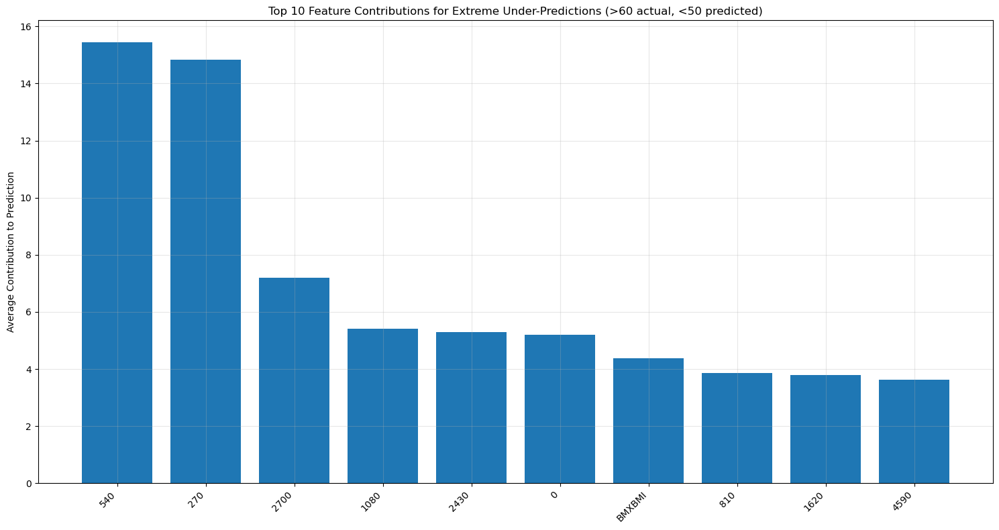


Detailed Analysis of Top Contributors (Older Under-Predicted Cases):

Feature: 540
Beta (coefficient): -25.4903
Average standardized X value: -0.6057
Average contribution (β * standardized x): 15.4383
Range of standardized X values: -1.8742 to 2.9536

Feature: 270
Beta (coefficient): 17.6677
Average standardized X value: -0.8400
Average contribution (β * standardized x): 14.8400
Range of standardized X values: -2.3506 to 2.8972

Feature: 2700
Beta (coefficient): -29.9702
Average standardized X value: -0.2399
Average contribution (β * standardized x): 7.1901
Range of standardized X values: -0.8575 to 4.7093

Feature: 1080
Beta (coefficient): -13.1611
Average standardized X value: -0.4111
Average contribution (β * standardized x): 5.4108
Range of standardized X values: -1.3864 to 2.7482

Feature: 2430
Beta (coefficient): 19.9511
Average standardized X value: -0.2653
Average contribution (β * standardized x): 5.2921
Range of standardized X values: -0.9307 to 4.4375

Feature: 0
Beta (coef

ModuleNotFoundError: No module named 'seaborn'

In [28]:
mask = (plot_data['actual'] > 60) & (plot_data['predicted'] < 50)
extreme_cases_old = plot_data[mask].copy()

# Step 1: Identify older participants predicted much younger
mask_old = (plot_data['actual'] > 60) & (plot_data['predicted'] < 50)
extreme_cases_old = plot_data[mask_old].copy()

print(f"Number of extreme under-predictions: {len(extreme_cases_old)}")
print(f"Avg actual age: {extreme_cases_old['actual'].mean():.2f}")
print(f"Avg predicted age: {extreme_cases_old['predicted'].mean():.2f}")

# Step 2: Get raw features via SEQN join
extreme_raw_features_old = (
    unhealthy_otc_raw
    .merge(extreme_cases_old[['SEQN']], on='SEQN', how='inner')
    .drop(columns=['Age', 'Activity_Risk', 'BMI_Risk'])
    .set_index('SEQN')
)

# Step 3: Get standardized features
extreme_std_features_old = (
    X_unhealthy_scaled
    .assign(SEQN=unhealthy_otc_raw['SEQN'].values)
    .set_index('SEQN')
    .loc[extreme_cases_old['SEQN']]
)

# Step 4: Calculate feature contributions
coefficients = pd.Series(lr_otc_raw.coef_, index=X_unhealthy_scaled.columns)
feature_contributions_old = extreme_std_features_old * coefficients
avg_contributions_old = feature_contributions_old.mean()
top_contributors_old = avg_contributions_old.abs().sort_values(ascending=False).head(10)

# Step 5: Plot top contributors
import matplotlib.pyplot as plt
plt.figure(figsize=(15, 8))
plt.bar(range(len(top_contributors_old)), top_contributors_old.values)
plt.xticks(range(len(top_contributors_old)), top_contributors_old.index, rotation=45, ha='right')
plt.title('Top 10 Feature Contributions for Extreme Under-Predictions (>60 actual, <50 predicted)')
plt.ylabel('Average Contribution to Prediction')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# Step 6: Detailed breakdown
print("\nDetailed Analysis of Top Contributors (Older Under-Predicted Cases):")
for feature in top_contributors_old.index:
    print(f"\nFeature: {feature}")
    print(f"Beta (coefficient): {coefficients[feature]:.4f}")
    print(f"Average standardized X value: {extreme_std_features_old[feature].mean():.4f}")
    print(f"Average contribution (β * standardized x): {top_contributors_old[feature]:.4f}")
    print(f"Range of standardized X values: {extreme_std_features_old[feature].min():.4f} to {extreme_std_features_old[feature].max():.4f}")

# Merge extreme cases with the original feature set using SEQN
extreme_raw_features = (
    unhealthy_otc_raw
    .merge(extreme_cases_old[['SEQN']], on='SEQN', how='inner')
    .drop(columns=['Age', 'Activity_Risk', 'BMI_Risk'])
)

# If you want them in the same order as extreme_cases:
extreme_raw_features = extreme_raw_features.set_index('SEQN').loc[extreme_cases_old['SEQN']]

extreme_std_features = (
    X_unhealthy_scaled
    .assign(SEQN=unhealthy_otc_raw['SEQN'].values)
    .set_index('SEQN')
    .loc[extreme_cases_old['SEQN']]
)

def top_features_for_case(row, coefs, top_n=5):
    contrib = row * coefs
    return contrib.sort_values(key=abs, ascending=False).head(top_n)

top_features_per_person = {}
for idx in extreme_std_features.index:
    top_features_per_person[idx] = top_features_for_case(
        extreme_std_features.loc[idx],
        coefficients,
        top_n=5
    )

summary = extreme_raw_features.describe().T
summary['avg_contribution'] = avg_contributions
summary = summary.loc[top_contributors.index]
print(summary)

import seaborn as sns

sns.heatmap(
    extreme_std_features[top_contributors.index],
    cmap='RdBu_r', center=0,
    xticklabels=top_contributors.index
)
plt.title("Standardized Feature Values for Extreme Over-Predictions")
plt.show()

### Raw Accelerometer Data GPT 50

In [29]:
healthy_gpt50_raw = gpt50_prediction[gpt50_prediction['SEQN'].isin(healthy_participants)]

In [30]:
X = healthy_gpt50_raw.drop(columns=["RIDAGEYR", 'SEQN', 'Activity_Risk', 'BMI_Risk'], errors="ignore")
y = healthy_gpt50_raw["RIDAGEYR"]

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

X_scaler = StandardScaler()

X_train_scaled = X_scaler.fit_transform(X_train)
X_test_scaled = X_scaler.transform(X_test)

X_train_scaled = pd.DataFrame(X_train_scaled, columns=X_train.columns)
X_test_scaled = pd.DataFrame(X_test_scaled, columns=X_test.columns)

lr_gpt50_raw = LinearRegression()
lr_gpt50_raw.fit(X_train_scaled, y_train)
y_pred_gpt50_raw = lr_gpt50_raw.predict(X_test_scaled)
rmse_gpt50_raw = np.sqrt(mean_squared_error(y_test, y_pred_gpt50_raw))
r_gpt50_raw = stats.pearsonr(y_test, y_pred_gpt50_raw)[0]

print(f"RMSE for test set (healthy participants): {rmse_gpt50_raw}")
print(f"R Squared for test set (healthy participants): {r_gpt50_raw}")

RMSE for test set (healthy participants): 14.85853408069657
R Squared for test set (healthy participants): 0.6072151850321238


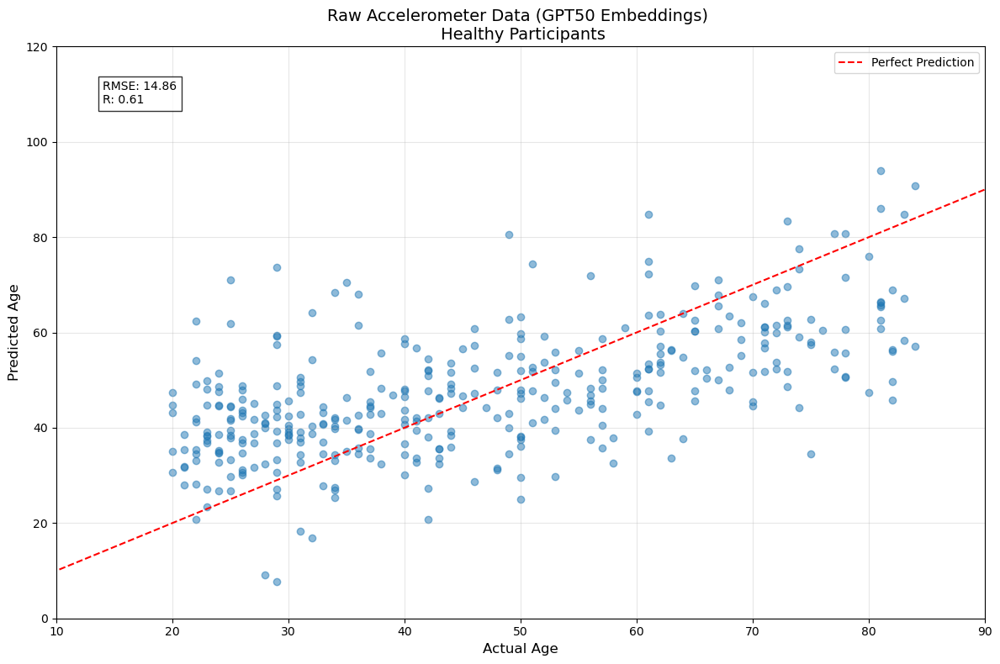


Prediction Statistics:
Mean Absolute Error: 12.08
Mean prediction: 47.32
Mean actual age: 46.51
Age range in test set: 20 to 84


In [31]:
plt.figure(figsize=(12, 8))

plt.scatter(y_test, y_pred_gpt50_raw, alpha=0.5)

plt.plot([0, 90], [0, 90], 'r--', label='Perfect Prediction')

plt.xlim(10, 90)
plt.ylim(0, 120)

plt.xlabel('Actual Age', fontsize=12)
plt.ylabel('Predicted Age', fontsize=12)
plt.title('Raw Accelerometer Data (GPT50 Embeddings) \n Healthy Participants', fontsize=14)

plt.grid(True, alpha=0.3)
plt.legend()

metrics_text = f'RMSE: {rmse_gpt50_raw:.2f}\nR: {r_gpt50_raw:.2f}'
plt.text(0.05, 0.9, metrics_text, transform=plt.gca().transAxes, 
         bbox=dict(facecolor='white', alpha=0.8), fontsize=10)

plt.tight_layout()
plt.show()

print("\nPrediction Statistics:")
print(f"Mean Absolute Error: {mean_absolute_error(y_test, y_pred_gpt50_raw):.2f}")
print(f"Mean prediction: {y_pred_gpt50_raw.mean():.2f}")
print(f"Mean actual age: {y_test.mean():.2f}")
print(f"Age range in test set: {y_test.min():.0f} to {y_test.max():.0f}")

In [32]:
unhealthy_gpt50_raw = gpt50_prediction[gpt50_prediction['SEQN'].isin(unhealthy_participants)]

In [33]:
X_unhealthy = unhealthy_gpt50_raw.drop(columns=['RIDAGEYR', 'SEQN', 'Activity_Risk', 'BMI_Risk'], errors='ignore')
y_unhealthy = unhealthy_gpt50_raw['RIDAGEYR']

X_unhealthy_scaled = X_scaler.transform(X_unhealthy)
X_unhealthy_scaled = pd.DataFrame(X_unhealthy_scaled, columns=X_unhealthy.columns)

y_pred_gpt50_raw_unhealthy = lr_gpt50_raw.predict(X_unhealthy_scaled)

In [34]:
unhealthy_gpt50_raw['n_risks'] = (
    unhealthy_gpt50_raw['Activity_Risk'].astype(int) + 
    unhealthy_gpt50_raw['BMI_Risk'].astype(int)
)

plot_data = pd.DataFrame({
    'actual': y_unhealthy,
    'predicted': y_pred_gpt50_raw_unhealthy,
    'SEQN': unhealthy_gpt50_raw['SEQN']
})
plot_data = plot_data.merge(
    unhealthy_gpt50_raw[['SEQN', 'n_risks']], 
    on='SEQN', 
    how='left'
)

rmse_unhealthy_gpt50_raw = np.sqrt(mean_squared_error(y_unhealthy, y_pred_gpt50_raw_unhealthy))
r_unhealthy_gpt50_raw = stats.pearsonr(y_unhealthy, y_pred_gpt50_raw_unhealthy)[0]

/var/folders/_r/p_dmz6p16p793l_ys27hs8rh0000gq/T/ipykernel_1757/1018567160.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unhealthy_gpt50_raw['n_risks'] = (


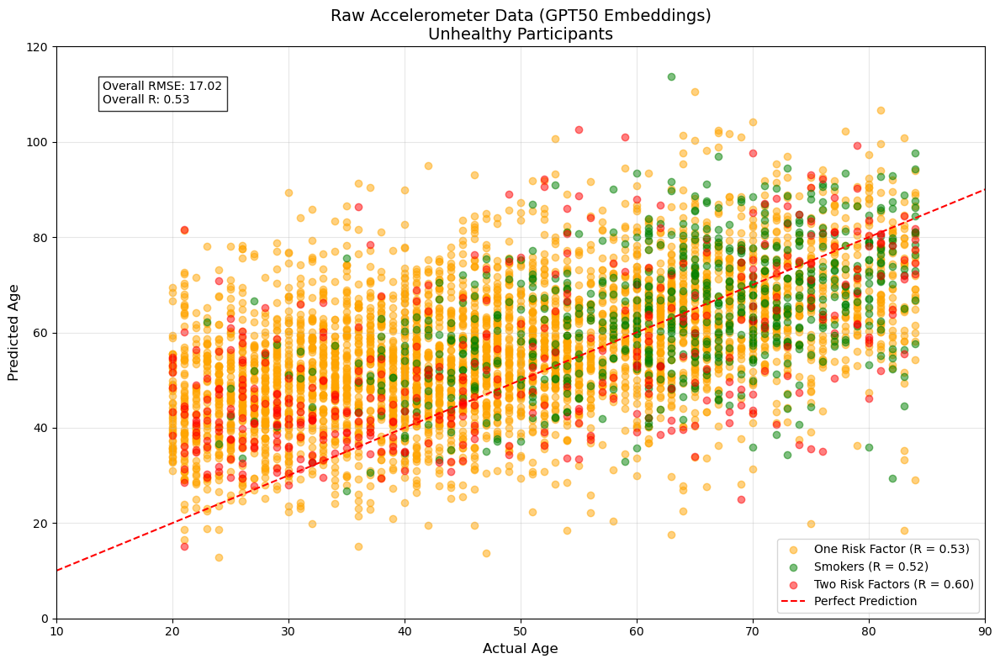


Detailed Statistics:
Number of smokers: 654

One Risk Factor:
Total participants: 4555
Number of smokers: 581
R: 0.525
Mean actual age: 50.06
Mean predicted age: 57.26

Two Risk Factors:
Total participants: 499
Number of smokers: 73
R: 0.601
Mean actual age: 51.39
Mean predicted age: 55.65


In [35]:
plt.figure(figsize=(12, 8))

colors = {1: 'orange', 2: 'red'}
labels = {1: 'One Risk Factor', 2: 'Two Risk Factors'}

# Calculate R for each risk group
r_by_risk = {}
for n_risks in [1, 2]:
    mask = plot_data['n_risks'] == n_risks
    r_by_risk[n_risks] = stats.pearsonr(
        plot_data[mask]['actual'], 
        plot_data[mask]['predicted']
    )[0]
    
    # Split each risk group into smokers and non-smokers
    smoker_mask = mask & plot_data['SEQN'].isin(cig_risk['SEQN'])
    smoker_r = stats.pearsonr(
        plot_data[smoker_mask]['actual'],
        plot_data[smoker_mask]['predicted']
    )[0]
    non_smoker_mask = mask & ~plot_data['SEQN'].isin(cig_risk['SEQN'])
    
    # Plot non-smokers with original colors
    plt.scatter(
        plot_data[non_smoker_mask]['actual'], 
        plot_data[non_smoker_mask]['predicted'], 
        alpha=0.5, 
        color=colors[n_risks], 
        label=f"{labels[n_risks]} (R = {r_by_risk[n_risks]:.2f})"
    )
    
    # Plot smokers in green
    plt.scatter(
        plot_data[smoker_mask]['actual'], 
        plot_data[smoker_mask]['predicted'], 
        alpha=0.5, 
        color='green', 
        label=f"Smokers (R = {smoker_r:.2f})" if n_risks == 1 else "" 
    )
    
plt.plot([10, 120], [10, 120], 'r--', label='Perfect Prediction')

plt.xlim(10, 90)
plt.ylim(0, 120)

plt.xlabel('Actual Age', fontsize=12)
plt.ylabel('Predicted Age', fontsize=12)
plt.title('Raw Accelerometer Data (GPT50 Embeddings)\nUnhealthy Participants', fontsize=14)

plt.grid(True, alpha=0.3)
plt.legend(fontsize=10)
plt.tight_layout()

metrics_text = f'Overall RMSE: {rmse_unhealthy_gpt50_raw:.2f}\nOverall R: {r_unhealthy_gpt50_raw:.2f}'
plt.text(0.05, 0.9, metrics_text, transform=plt.gca().transAxes, 
         bbox=dict(facecolor='white', alpha=0.8), fontsize=10)

plt.show()

print("\nDetailed Statistics:")
smoker_mask = plot_data['SEQN'].isin(cig_risk['SEQN'])
print(f"Number of smokers: {smoker_mask.sum()}")

for n_risks in [1, 2]:
    mask = plot_data['n_risks'] == n_risks
    smoker_mask = mask & plot_data['SEQN'].isin(cig_risk['SEQN'])
    
    print(f"\n{labels[n_risks]}:")
    print(f"Total participants: {mask.sum()}")
    print(f"Number of smokers: {smoker_mask.sum()}")
    print(f"R: {r_by_risk[n_risks]:.3f}")
    print(f"Mean actual age: {plot_data[mask]['actual'].mean():.2f}")
    print(f"Mean predicted age: {plot_data[mask]['predicted'].mean():.2f}")

Number of extreme over-predictions found: 552

Average actual age: 38.98
Average predicted age: 68.13


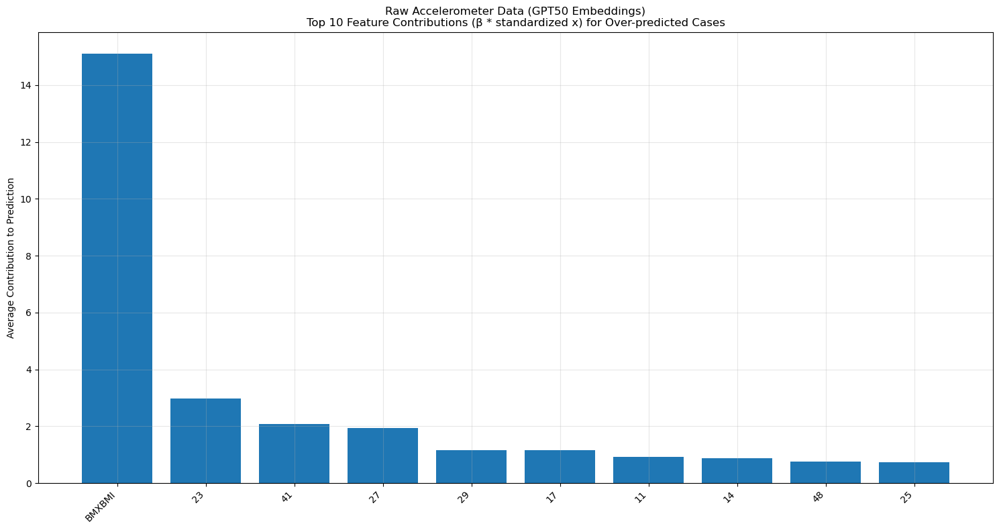


Detailed Analysis of Top Contributors:

Feature: BMXBMI
Beta (coefficient): 2.0751
Average standardized X value: 7.2816
Average contribution (β * standardized x): 15.1103
Range of standardized X values: -0.8552 to 53.5910

Feature: 23
Beta (coefficient): 6.7701
Average standardized X value: 0.4388
Average contribution (β * standardized x): 2.9709
Range of standardized X values: -3.1396 to 2.7944

Feature: 41
Beta (coefficient): -7.7250
Average standardized X value: 0.2695
Average contribution (β * standardized x): 2.0816
Range of standardized X values: -2.4877 to 3.1835

Feature: 27
Beta (coefficient): -4.0155
Average standardized X value: -0.4855
Average contribution (β * standardized x): 1.9496
Range of standardized X values: -3.1819 to 2.3243

Feature: 29
Beta (coefficient): 3.3486
Average standardized X value: 0.3498
Average contribution (β * standardized x): 1.1715
Range of standardized X values: -2.5378 to 2.1195

Feature: 17
Beta (coefficient): 2.5890
Average standardized X val

In [36]:
mask = (plot_data['actual'].between(20, 50)) & (plot_data['predicted'] > 60)
extreme_cases = plot_data[mask].copy()

extreme_features = X_unhealthy_scaled[X_unhealthy_scaled.index.isin(extreme_cases.index)]
coefficients = pd.Series(lr_gpt50_raw.coef_, index=X_unhealthy_scaled.columns)

feature_contributions = extreme_features * coefficients

avg_contributions = feature_contributions.mean()
top_contributors = avg_contributions.abs().sort_values(ascending=False).head(10)

print(f"Number of extreme over-predictions found: {len(extreme_cases)}")
print(f"\nAverage actual age: {extreme_cases['actual'].mean():.2f}")
print(f"Average predicted age: {extreme_cases['predicted'].mean():.2f}")

plt.figure(figsize=(15, 8))
plt.bar(range(len(top_contributors)), top_contributors.values)
plt.xticks(range(len(top_contributors)), top_contributors.index, rotation=45, ha='right')
plt.title('Raw Accelerometer Data (GPT50 Embeddings)\nTop 10 Feature Contributions (β * standardized x) for Over-predicted Cases')
plt.ylabel('Average Contribution to Prediction')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

print("\nDetailed Analysis of Top Contributors:")
for feature in top_contributors.index:
    print(f"\nFeature: {feature}")
    print(f"Beta (coefficient): {coefficients[feature]:.4f}")
    print(f"Average standardized X value: {extreme_features[feature].mean():.4f}")
    print(f"Average contribution (β * standardized x): {top_contributors[feature]:.4f}")
    print(f"Range of standardized X values: {extreme_features[feature].min():.4f} to {extreme_features[feature].max():.4f}")

### Raw Accelerometer Data GPT 1536

In [59]:
healthy_gpt1536_raw = gpt1536[gpt1536['SEQN'].isin(healthy_participants)]
unhealthy_gpt1536_raw = gpt1536[gpt1536['SEQN'].isin(unhealthy_participants)]

#### Dimension Reduction

In [81]:
healthy_gpt1536_raw['Group'] = 'Healthy'
unhealthy_gpt1536_raw['Group'] = 'Unhealthy'
combined_data = pd.concat([healthy_gpt1536_raw, unhealthy_gpt1536_raw])

# Separate features and labels
features = combined_data.drop(columns=['SEQN', 'Group', 'Activity_Risk', 'BMI_Risk'])  # Drop non-feature columns
labels = combined_data['Group']

# Apply PCA
pca = PCA(n_components=2)  # Reduce to 2 dimensions for visualization
pca_result = pca.fit_transform(features)

# Create a DataFrame for the PCA results
pca_df = pd.DataFrame(pca_result, columns=['PC1', 'PC2'])
pca_df['Group'] = labels.values

# Plot the PCA results
plt.figure(figsize=(10, 6))
for group, color in zip(['Healthy', 'Unhealthy'], ['blue', 'red']):
    subset = pca_df[pca_df['Group'] == group]
    plt.scatter(subset['PC1'], subset['PC2'], label=group, color=color, alpha=0.6)

plt.title('PCA of GPT1536 Data')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend()
plt.show()

/var/folders/dz/ggx10pdx1p91s2hsnvsw_sy40000gn/T/ipykernel_56031/3329425205.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  healthy_gpt1536_raw['Group'] = 'Healthy'
/var/folders/dz/ggx10pdx1p91s2hsnvsw_sy40000gn/T/ipykernel_56031/3329425205.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unhealthy_gpt1536_raw['Group'] = 'Unhealthy'


ValueError: Input X contains NaN.
PCA does not accept missing values encoded as NaN natively. For supervised learning, you might want to consider sklearn.ensemble.HistGradientBoostingClassifier and Regressor which accept missing values encoded as NaNs natively. Alternatively, it is possible to preprocess the data, for instance by using an imputer transformer in a pipeline or drop samples with missing values. See https://scikit-learn.org/stable/modules/impute.html You can find a list of all estimators that handle NaN values at the following page: https://scikit-learn.org/stable/modules/impute.html#estimators-that-handle-nan-values

/var/folders/dz/ggx10pdx1p91s2hsnvsw_sy40000gn/T/ipykernel_56031/1697291281.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  healthy_gpt1536_raw['Group'] = 'Healthy'
/var/folders/dz/ggx10pdx1p91s2hsnvsw_sy40000gn/T/ipykernel_56031/1697291281.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unhealthy_gpt1536_raw['Group'] = 'Unhealthy'


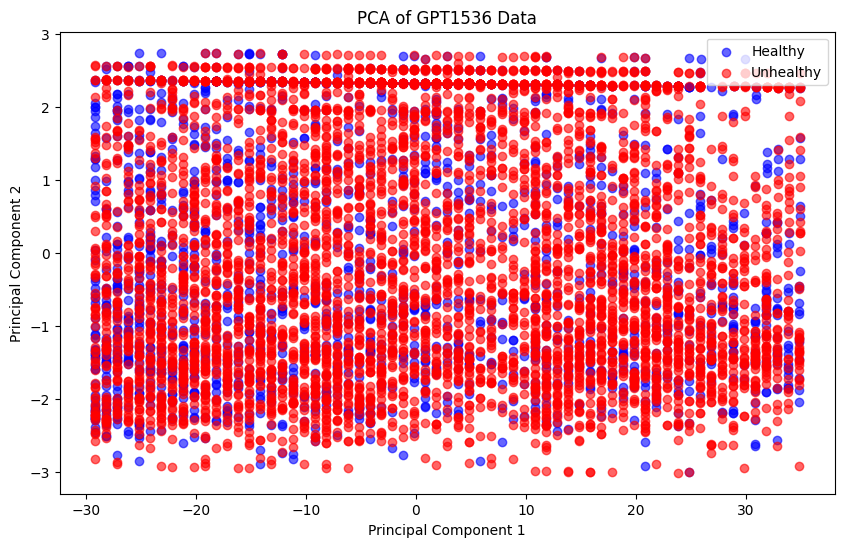

In [23]:
healthy_gpt1536_raw['Group'] = 'Healthy'
unhealthy_gpt1536_raw['Group'] = 'Unhealthy'
combined_data = pd.concat([healthy_gpt1536_raw, unhealthy_gpt1536_raw])

# Separate features and labels
features = combined_data.drop(columns=['SEQN', 'Group', 'Activity_Risk', 'BMI_Risk', 'BMXBMI'])  # Drop non-feature columns
labels = combined_data['Group']

# Apply PCA
pca = PCA(n_components=2)  # Reduce to 2 dimensions for visualization
pca_result = pca.fit_transform(features)

# Create a DataFrame for the PCA results
pca_df = pd.DataFrame(pca_result, columns=['PC1', 'PC2'])
pca_df['Group'] = labels.values

# Plot the PCA results
plt.figure(figsize=(10, 6))
for group, color in zip(['Healthy', 'Unhealthy'], ['blue', 'red']):
    subset = pca_df[pca_df['Group'] == group]
    plt.scatter(subset['PC1'], subset['PC2'], label=group, color=color, alpha=0.6)

plt.title('PCA of GPT1536 Data')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend()
plt.show()

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


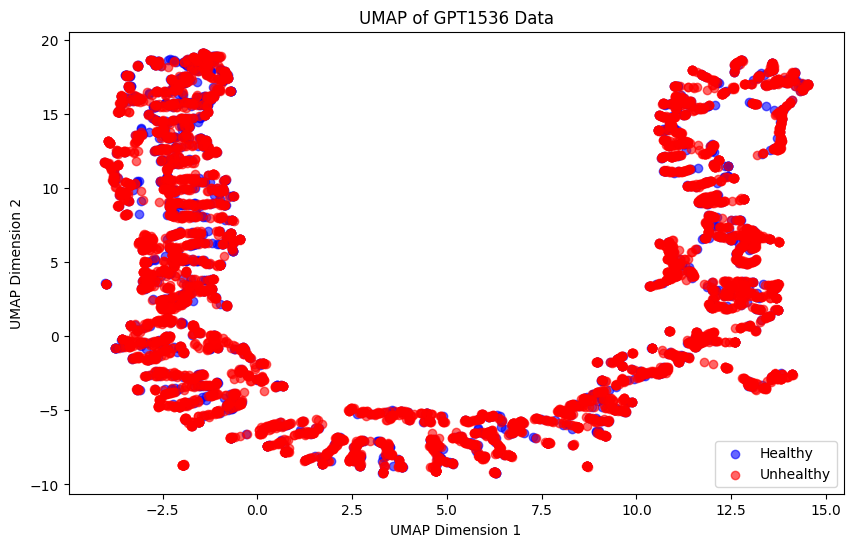

In [25]:
# Apply UMAP
umap_reducer = umap.UMAP(n_components=2, random_state=42)  # Reduce to 2 dimensions for visualization
umap_result = umap_reducer.fit_transform(features)

# Create a DataFrame for the UMAP results
umap_df = pd.DataFrame(umap_result, columns=['UMAP1', 'UMAP2'])
umap_df['Group'] = labels.values

# Plot the UMAP results
plt.figure(figsize=(10, 6))
for group, color in zip(['Healthy', 'Unhealthy'], ['blue', 'red']):
    subset = umap_df[umap_df['Group'] == group]
    plt.scatter(subset['UMAP1'], subset['UMAP2'], label=group, color=color, alpha=0.6)

plt.title('UMAP of GPT1536 Data')
plt.xlabel('UMAP Dimension 1')
plt.ylabel('UMAP Dimension 2')
plt.legend()
plt.show()

#### 50+ Model

In [28]:
healthy_gpt1536_raw_50 = healthy_gpt1536_raw[healthy_gpt1536_raw['Age'] >= 50]
unhealthy_gpt1536_raw_50 = unhealthy_gpt1536_raw[unhealthy_gpt1536_raw['Age'] >= 50]

In [31]:
X = healthy_gpt1536_raw_50.drop(columns=["Age", 'SEQN', 'Activity_Risk', 'BMI_Risk', 'BMXBMI', 'Group'], errors="ignore")
y = healthy_gpt1536_raw_50["Age"]

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

X_scaler = StandardScaler()

X_train_scaled = X_scaler.fit_transform(X_train)
X_test_scaled = X_scaler.transform(X_test)

X_train_scaled = pd.DataFrame(X_train_scaled, columns=X_train.columns)
X_test_scaled = pd.DataFrame(X_test_scaled, columns=X_test.columns)

ridge_raw1536 = RidgeCV(alphas=np.logspace(-6, 6, 13), store_cv_values=True)
ridge_raw1536.fit(X_train_scaled, y_train)

y_pred_gpt1536_raw = ridge_raw1536.predict(X_test_scaled)
rmse_gpt1536_raw = np.sqrt(mean_squared_error(y_test, y_pred_gpt1536_raw))
r_gpt1536_raw = stats.pearsonr(y_test, y_pred_gpt1536_raw)[0]

print(f"RMSE for test set (healthy participants): {rmse_gpt1536_raw}")
print(f"R for test set (healthy participants): {r_gpt1536_raw}")

RMSE for test set (healthy participants): 7.9493515472529666
R for test set (healthy participants): 0.6281724006188409


/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/linear_model/_ridge.py:2341: FutureWarning: 'store_cv_values' is deprecated in version 1.5 and will be removed in 1.7. Use 'store_cv_results' instead.
  warnings.warn(


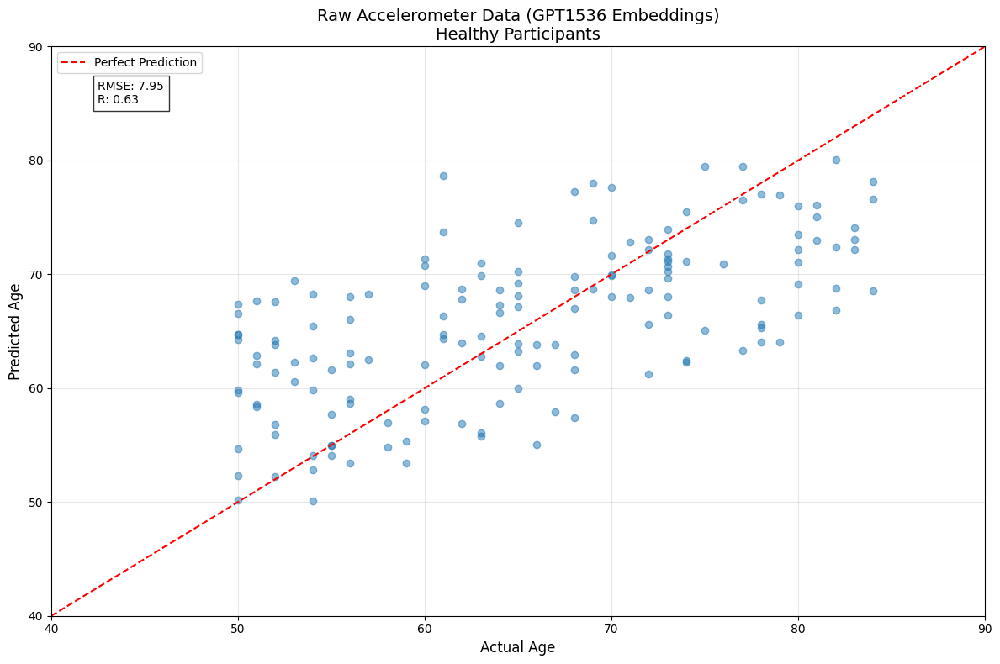


Prediction Statistics:
Mean Absolute Error: 6.43
Mean prediction: 65.83
Mean actual age: 65.25
Age range in test set: 50 to 84


In [42]:
plt.figure(figsize=(12, 8))

plt.scatter(y_test, y_pred_gpt1536_raw, alpha=0.5)

plt.plot([40, 90], [40, 90], 'r--', label='Perfect Prediction')

plt.xlim(40, 90)
plt.ylim(40, 90)

plt.xlabel('Actual Age', fontsize=12)
plt.ylabel('Predicted Age', fontsize=12)
plt.title('Raw Accelerometer Data (GPT1536 Embeddings)\nHealthy Participants', fontsize=14)

plt.grid(True, alpha=0.3)
plt.legend()

metrics_text = f'RMSE: {rmse_gpt1536_raw:.2f}\nR: {r_gpt1536_raw:.2f}'
plt.text(0.05, 0.9, metrics_text, transform=plt.gca().transAxes, 
         bbox=dict(facecolor='white', alpha=0.8), fontsize=10)

plt.tight_layout()
plt.show()

print("\nPrediction Statistics:")
print(f"Mean Absolute Error: {mean_absolute_error(y_test, y_pred_gpt1536_raw):.2f}")
print(f"Mean prediction: {y_pred_gpt1536_raw.mean():.2f}")
print(f"Mean actual age: {y_test.mean():.2f}")
print(f"Age range in test set: {y_test.min():.0f} to {y_test.max():.0f}")

healthy_gpt1536_raw = pd.DataFrame({
    'Actual Age': y_test,
    'Predicted Age': y_pred_gpt1536_raw
})

healthy_gpt1536_raw.to_csv('healthy_gpt1536_raw_50.csv', index=False)

In [38]:
X_unhealthy = unhealthy_gpt1536_raw_50.drop(columns=['Age', 'SEQN', 'Activity_Risk', 'BMI_Risk', 'BMXBMI', 'Group'], errors='ignore')
y_unhealthy = unhealthy_gpt1536_raw_50['Age']

X_unhealthy_scaled = X_scaler.transform(X_unhealthy)
X_unhealthy_scaled = pd.DataFrame(X_unhealthy_scaled, columns=X_unhealthy.columns)

y_pred_gpt1536_raw_unhealthy = ridge_raw1536.predict(X_unhealthy_scaled)

In [39]:
unhealthy_gpt1536_raw_50['n_risks'] = (
    unhealthy_gpt1536_raw_50['Activity_Risk'].astype(int) + 
    unhealthy_gpt1536_raw_50['BMI_Risk'].astype(int)
)

plot_data = pd.DataFrame({
    'actual': y_unhealthy,
    'predicted': y_pred_gpt1536_raw_unhealthy,
    'SEQN': unhealthy_gpt1536_raw_50['SEQN']
})
plot_data = plot_data.merge(
    unhealthy_gpt1536_raw_50[['SEQN', 'n_risks']], 
    on='SEQN', 
    how='left'
)
plot_data['smoker'] = plot_data['SEQN'].isin(cig_risk['SEQN'])

rmse_unhealthy_gpt1536_raw = np.sqrt(mean_squared_error(y_unhealthy, y_pred_gpt1536_raw_unhealthy))
r_unhealthy_gpt1536_raw = stats.pearsonr(y_unhealthy, y_pred_gpt1536_raw_unhealthy)[0]

/var/folders/dz/ggx10pdx1p91s2hsnvsw_sy40000gn/T/ipykernel_13964/3918177178.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unhealthy_gpt1536_raw_50['n_risks'] = (


In [43]:
plot_data.to_csv('unhealthy_gpt1536_raw_50.csv', index=False)

In [52]:
c_index = concordance_index(event_times=plot_data.actual,  # true ages
                            predicted_scores=plot_data.predicted)  # predicted ages

print(f"Concordance Index: {c_index:.3f}")

Concordance Index: 0.695


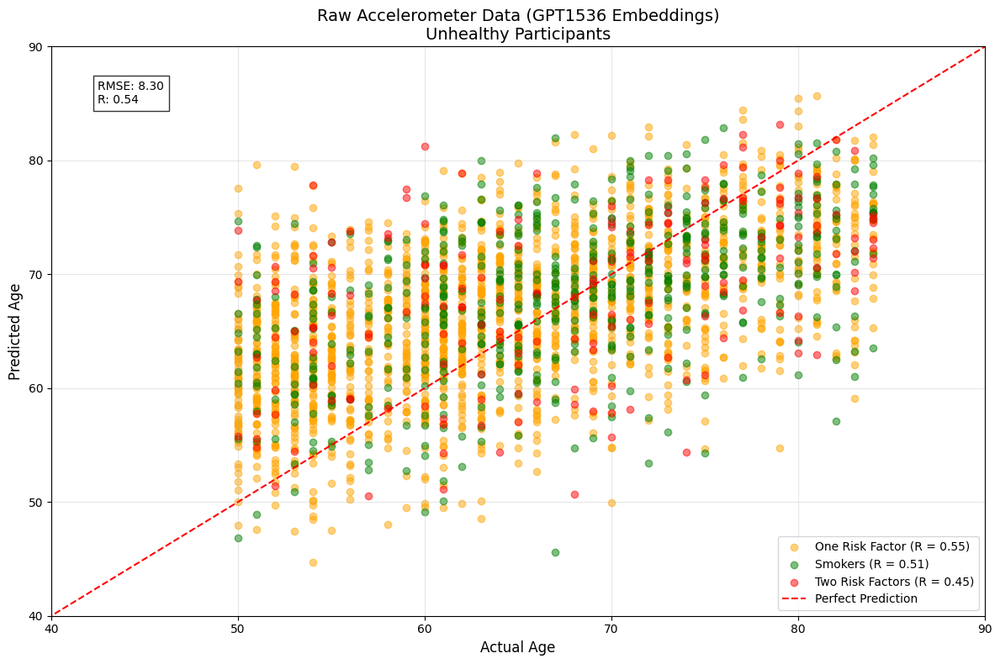


Detailed Statistics:
Number of smokers: 537

One Risk Factor:
Total participants: 2242
Number of smokers: 468
R: 0.545
Mean actual age: 64.81
Mean predicted age: 66.66

Two Risk Factors:
Total participants: 262
Number of smokers: 69
R: 0.449
Mean actual age: 68.13
Mean predicted age: 68.79


In [41]:
plt.figure(figsize=(12, 8))

colors = {1: 'orange', 2: 'red'}
labels = {1: 'One Risk Factor', 2: 'Two Risk Factors'}

r_by_risk = {}
for n_risks in [1, 2]:
    mask = plot_data['n_risks'] == n_risks
    r_by_risk[n_risks] = stats.pearsonr(
        plot_data[mask]['actual'], 
        plot_data[mask]['predicted']
    )[0]
    
    # Split each risk group into smokers and non-smokers
    smoker_mask = mask & plot_data['SEQN'].isin(cig_risk['SEQN'])
    smoker_r = stats.pearsonr(
        plot_data[smoker_mask]['actual'],
        plot_data[smoker_mask]['predicted']
    )[0]
    non_smoker_mask = mask & ~plot_data['SEQN'].isin(cig_risk['SEQN'])
    
    # Plot non-smokers with original colors
    plt.scatter(
        plot_data[non_smoker_mask]['actual'], 
        plot_data[non_smoker_mask]['predicted'], 
        alpha=0.5, 
        color=colors[n_risks], 
        label=f"{labels[n_risks]} (R = {r_by_risk[n_risks]:.2f})"
    )
    
    # Plot smokers in green
    plt.scatter(
        plot_data[smoker_mask]['actual'], 
        plot_data[smoker_mask]['predicted'], 
        alpha=0.5, 
        color='green', 
        label=f"Smokers (R = {smoker_r:.2f})" if n_risks == 1 else ""  # Only add label once
    )


plt.plot([10, 130], [10, 130], 'r--', label='Perfect Prediction')

plt.xlim(40, 90)
plt.ylim(40, 90)

plt.xlabel('Actual Age', fontsize=12)
plt.ylabel('Predicted Age', fontsize=12)
plt.title('Raw Accelerometer Data (GPT1536 Embeddings)\nUnhealthy Participants', fontsize=14)

plt.grid(True, alpha=0.3)
plt.legend(fontsize=10)

metrics_text = f'RMSE: {rmse_unhealthy_gpt1536_raw:.2f}\nR: {r_unhealthy_gpt1536_raw:.2f}'
plt.text(0.05, 0.9, metrics_text, transform=plt.gca().transAxes, 
         bbox=dict(facecolor='white', alpha=0.8), fontsize=10)

plt.tight_layout()
plt.show()

print("\nDetailed Statistics:")
smoker_mask = plot_data['SEQN'].isin(cig_risk['SEQN'])
print(f"Number of smokers: {smoker_mask.sum()}")

for n_risks in [1, 2]:
    mask = plot_data['n_risks'] == n_risks
    smoker_mask = mask & plot_data['SEQN'].isin(cig_risk['SEQN'])
    
    print(f"\n{labels[n_risks]}:")
    print(f"Total participants: {mask.sum()}")
    print(f"Number of smokers: {smoker_mask.sum()}")
    print(f"R: {r_by_risk[n_risks]:.3f}")
    print(f"Mean actual age: {plot_data[mask]['actual'].mean():.2f}")
    print(f"Mean predicted age: {plot_data[mask]['predicted'].mean():.2f}")

#### Separated Ages

In [57]:
healthy_under50_gpt1536_raw = healthy_gpt1536_raw[healthy_gpt1536_raw['Age'] < 50]
healthy_over50_gpt1536_raw = healthy_gpt1536_raw[healthy_gpt1536_raw['Age'] >= 50]

unhealthy_under50_gpt1536_raw = unhealthy_gpt1536_raw[unhealthy_gpt1536_raw['Age'] < 50]
unhealthy_over50_gpt1536_raw = unhealthy_gpt1536_raw[unhealthy_gpt1536_raw['Age'] >= 50]

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/linear_model/_ridge.py:2341: FutureWarning: 'store_cv_values' is deprecated in version 1.5 and will be removed in 1.7. Use 'store_cv_results' instead.
  warnings.warn(


RMSE for test set (healthy participants under 50): 8.02229347937601
R Squared for test set (healthy participants under 50): 0.3424560013717629


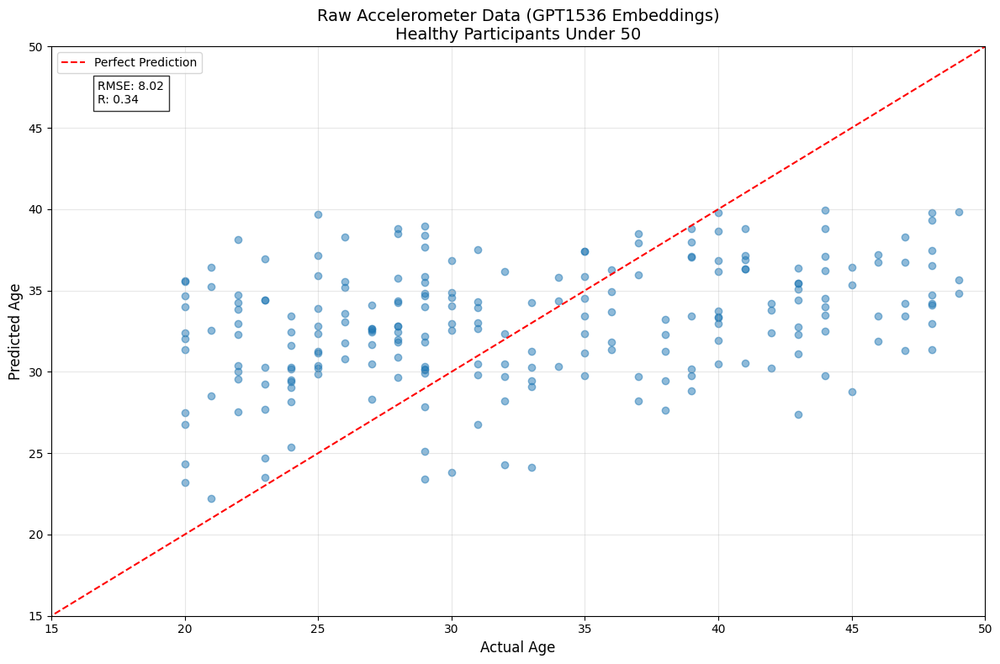


Prediction Statistics:
Mean Absolute Error: 6.86
Mean prediction: 32.93
Mean actual age: 32.87
Age range in test set: 20 to 49


In [47]:
# Under 50

X = healthy_under50_gpt1536_raw.drop(columns=["Age", 'SEQN', 'Activity_Risk', 'BMI_Risk'], errors="ignore")
y = healthy_under50_gpt1536_raw["Age"]

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

X_scaler = StandardScaler()

X_train_scaled = X_scaler.fit_transform(X_train)
X_test_scaled = X_scaler.transform(X_test)

X_train_scaled = pd.DataFrame(X_train_scaled, columns=X_train.columns)
X_test_scaled = pd.DataFrame(X_test_scaled, columns=X_test.columns)

ridge_raw1536_under50 = RidgeCV(alphas=np.logspace(-6, 6, 13), store_cv_values=True)
ridge_raw1536_under50.fit(X_train_scaled, y_train)

y_pred_gpt1536_raw_under50 = ridge_raw1536_under50.predict(X_test_scaled)
rmse_gpt1536_raw_under50 = np.sqrt(mean_squared_error(y_test, y_pred_gpt1536_raw_under50))
r_gpt1536_raw_under50 = stats.pearsonr(y_test, y_pred_gpt1536_raw_under50)[0]

print(f"RMSE for test set (healthy participants under 50): {rmse_gpt1536_raw_under50}")
print(f"R Squared for test set (healthy participants under 50): {r_gpt1536_raw_under50}")

plt.figure(figsize=(12, 8))

plt.scatter(y_test, y_pred_gpt1536_raw_under50, alpha=0.5)

plt.plot([0, 90], [0, 90], 'r--', label='Perfect Prediction')

plt.xlim(15, 50)
plt.ylim(15, 50)

plt.xlabel('Actual Age', fontsize=12)
plt.ylabel('Predicted Age', fontsize=12)
plt.title('Raw Accelerometer Data (GPT1536 Embeddings)\nHealthy Participants Under 50', fontsize=14)

plt.grid(True, alpha=0.3)
plt.legend()

metrics_text = f'RMSE: {rmse_gpt1536_raw_under50:.2f}\nR: {r_gpt1536_raw_under50:.2f}'
plt.text(0.05, 0.9, metrics_text, transform=plt.gca().transAxes, 
         bbox=dict(facecolor='white', alpha=0.8), fontsize=10)

plt.tight_layout()
plt.show()

print("\nPrediction Statistics:")
print(f"Mean Absolute Error: {mean_absolute_error(y_test, y_pred_gpt1536_raw_under50):.2f}")
print(f"Mean prediction: {y_pred_gpt1536_raw_under50.mean():.2f}")
print(f"Mean actual age: {y_test.mean():.2f}")
print(f"Age range in test set: {y_test.min():.0f} to {y_test.max():.0f}")

/var/folders/dz/ggx10pdx1p91s2hsnvsw_sy40000gn/T/ipykernel_42062/3169408227.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unhealthy_under50_gpt1536_raw['n_risks'] = (


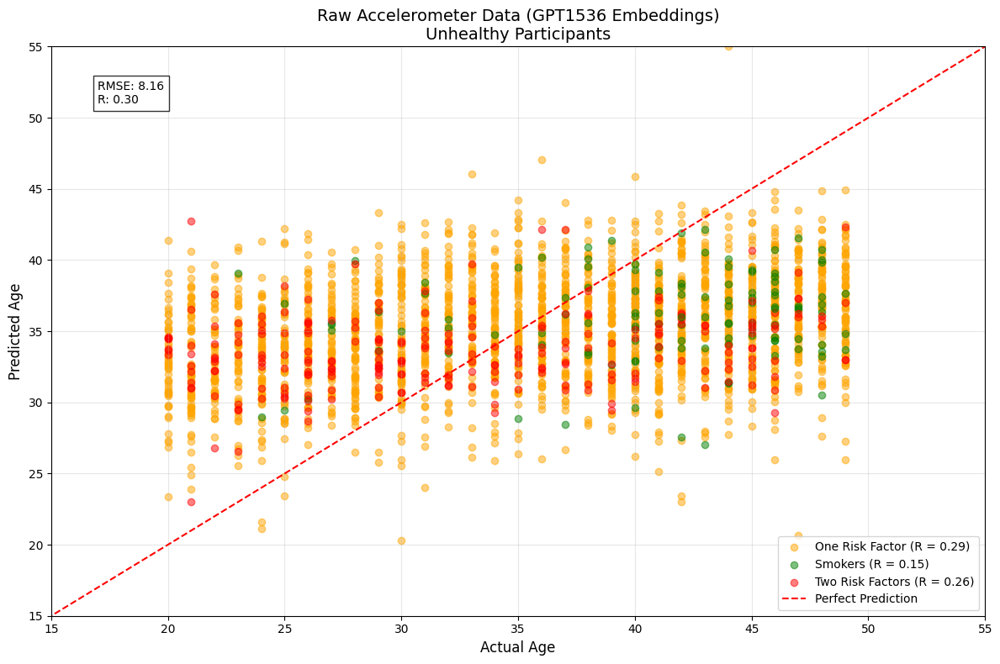


Detailed Statistics:
Number of smokers: 117

One Risk Factor:
Total participants: 2313
Number of smokers: 113
R: 0.295
Mean actual age: 35.76
Mean predicted age: 35.19

Two Risk Factors:
Total participants: 237
Number of smokers: 4
R: 0.257
Mean actual age: 32.89
Mean predicted age: 33.63


In [ ]:
X_unhealthy = unhealthy_under50_gpt1536_raw.drop(columns=['Age', 'SEQN', 'Activity_Risk', 'BMI_Risk'], errors='ignore')
y_unhealthy = unhealthy_under50_gpt1536_raw['Age']

X_unhealthy_scaled = X_scaler.transform(X_unhealthy)
X_unhealthy_scaled = pd.DataFrame(X_unhealthy_scaled, columns=X_unhealthy.columns)

y_pred_gpt1536_raw_unhealthy_under50 = ridge_raw1536_under50.predict(X_unhealthy_scaled)
unhealthy_under50_gpt1536_raw['n_risks'] = (
    unhealthy_under50_gpt1536_raw['Activity_Risk'].astype(int) + 
    unhealthy_under50_gpt1536_raw['BMI_Risk'].astype(int)
)

plot_data = pd.DataFrame({
    'actual': y_unhealthy,
    'predicted': y_pred_gpt1536_raw_unhealthy_under50,
    'SEQN': unhealthy_under50_gpt1536_raw['SEQN']
})
plot_data = plot_data.merge(
    unhealthy_under50_gpt1536_raw[['SEQN', 'n_risks']], 
    on='SEQN', 
    how='left'
)

rmse_unhealthy_gpt1536_raw_under50 = np.sqrt(mean_squared_error(y_unhealthy, y_pred_gpt1536_raw_unhealthy_under50))
r_unhealthy_gpt1536_raw_under50 = stats.pearsonr(y_unhealthy, y_pred_gpt1536_raw_unhealthy_under50)[0]
plt.figure(figsize=(12, 8))

colors = {1: 'orange', 2: 'red'}
labels = {1: 'One Risk Factor', 2: 'Two Risk Factors'}

r_by_risk = {}
for n_risks in [1, 2]:
    mask = plot_data['n_risks'] == n_risks
    r_by_risk[n_risks] = stats.pearsonr(
        plot_data[mask]['actual'], 
        plot_data[mask]['predicted']
    )[0]
    
    # Split each risk group into smokers and non-smokers
    smoker_mask = mask & plot_data['SEQN'].isin(cig_risk['SEQN'])
    smoker_r = stats.pearsonr(
        plot_data[smoker_mask]['actual'],
        plot_data[smoker_mask]['predicted']
    )[0]
    non_smoker_mask = mask & ~plot_data['SEQN'].isin(cig_risk['SEQN'])
    
    # Plot non-smokers with original colors
    plt.scatter(
        plot_data[non_smoker_mask]['actual'], 
        plot_data[non_smoker_mask]['predicted'], 
        alpha=0.5, 
        color=colors[n_risks], 
        label=f"{labels[n_risks]} (R = {r_by_risk[n_risks]:.2f})"
    )
    
    # Plot smokers in green
    plt.scatter(
        plot_data[smoker_mask]['actual'], 
        plot_data[smoker_mask]['predicted'], 
        alpha=0.5, 
        color='green', 
        label=f"Smokers (R = {smoker_r:.2f})" if n_risks == 1 else ""  # Only add label once
    )


plt.plot([10, 130], [10, 130], 'r--', label='Perfect Prediction')

plt.xlim(15, 55)
plt.ylim(15, 55)

plt.xlabel('Actual Age', fontsize=12)
plt.ylabel('Predicted Age', fontsize=12)
plt.title('Raw Accelerometer Data (GPT1536 Embeddings)\nUnhealthy Participants', fontsize=14)

plt.grid(True, alpha=0.3)
plt.legend(fontsize=10)

metrics_text = f'RMSE: {rmse_unhealthy_gpt1536_raw_under50:.2f}\nR: {r_unhealthy_gpt1536_raw_under50:.2f}'
plt.text(0.05, 0.9, metrics_text, transform=plt.gca().transAxes, 
         bbox=dict(facecolor='white', alpha=0.8), fontsize=10)

plt.tight_layout()
plt.show()

print("\nDetailed Statistics:")
smoker_mask = plot_data['SEQN'].isin(cig_risk['SEQN'])
print(f"Number of smokers: {smoker_mask.sum()}")

for n_risks in [1, 2]:
    mask = plot_data['n_risks'] == n_risks
    smoker_mask = mask & plot_data['SEQN'].isin(cig_risk['SEQN'])
    
    print(f"\n{labels[n_risks]}:")
    print(f"Total participants: {mask.sum()}")
    print(f"Number of smokers: {smoker_mask.sum()}")
    print(f"R: {r_by_risk[n_risks]:.3f}")
    print(f"Mean actual age: {plot_data[mask]['actual'].mean():.2f}")
    print(f"Mean predicted age: {plot_data[mask]['predicted'].mean():.2f}")

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/linear_model/_ridge.py:2341: FutureWarning: 'store_cv_values' is deprecated in version 1.5 and will be removed in 1.7. Use 'store_cv_results' instead.
  warnings.warn(


RMSE for test set (healthy participants over 50): 7.944450662530115
R Squared for test set (healthy participants over 50): 0.6288292959796538


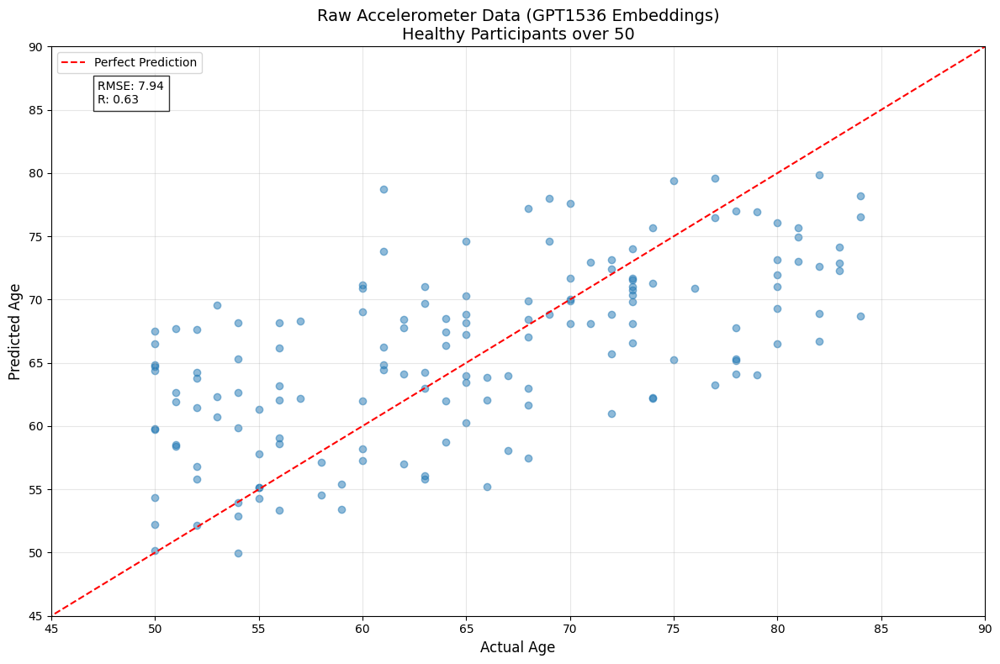


Prediction Statistics:
Mean Absolute Error: 6.41
Mean prediction: 65.84
Mean actual age: 65.25
Age range in test set: 50 to 84


In [54]:
# Over 50

X = healthy_over50_gpt1536_raw.drop(columns=["Age", 'SEQN', 'Activity_Risk', 'BMI_Risk'], errors="ignore")
y = healthy_over50_gpt1536_raw["Age"]

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

X_scaler = StandardScaler()

X_train_scaled = X_scaler.fit_transform(X_train)
X_test_scaled = X_scaler.transform(X_test)

X_train_scaled = pd.DataFrame(X_train_scaled, columns=X_train.columns)
X_test_scaled = pd.DataFrame(X_test_scaled, columns=X_test.columns)

ridge_raw1536_over50 = RidgeCV(alphas=np.logspace(-6, 6, 13), store_cv_values=True)
ridge_raw1536_over50.fit(X_train_scaled, y_train)

y_pred_gpt1536_raw_over50 = ridge_raw1536_over50.predict(X_test_scaled)
rmse_gpt1536_raw_over50 = np.sqrt(mean_squared_error(y_test, y_pred_gpt1536_raw_over50))
r_gpt1536_raw_over50 = stats.pearsonr(y_test, y_pred_gpt1536_raw_over50)[0]

print(f"RMSE for test set (healthy participants over 50): {rmse_gpt1536_raw_over50}")
print(f"R Squared for test set (healthy participants over 50): {r_gpt1536_raw_over50}")

plt.figure(figsize=(12, 8))

plt.scatter(y_test, y_pred_gpt1536_raw_over50, alpha=0.5)

plt.plot([0, 90], [0, 90], 'r--', label='Perfect Prediction')

plt.xlim(45, 90)
plt.ylim(45, 90)

plt.xlabel('Actual Age', fontsize=12)
plt.ylabel('Predicted Age', fontsize=12)
plt.title('Raw Accelerometer Data (GPT1536 Embeddings)\nHealthy Participants over 50', fontsize=14)

plt.grid(True, alpha=0.3)
plt.legend()

metrics_text = f'RMSE: {rmse_gpt1536_raw_over50:.2f}\nR: {r_gpt1536_raw_over50:.2f}'
plt.text(0.05, 0.9, metrics_text, transform=plt.gca().transAxes, 
         bbox=dict(facecolor='white', alpha=0.8), fontsize=10)

plt.tight_layout()
plt.show()

print("\nPrediction Statistics:")
print(f"Mean Absolute Error: {mean_absolute_error(y_test, y_pred_gpt1536_raw_over50):.2f}")
print(f"Mean prediction: {y_pred_gpt1536_raw_over50.mean():.2f}")
print(f"Mean actual age: {y_test.mean():.2f}")
print(f"Age range in test set: {y_test.min():.0f} to {y_test.max():.0f}")

/var/folders/dz/ggx10pdx1p91s2hsnvsw_sy40000gn/T/ipykernel_42062/4108476520.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unhealthy_over50_gpt1536_raw['n_risks'] = (


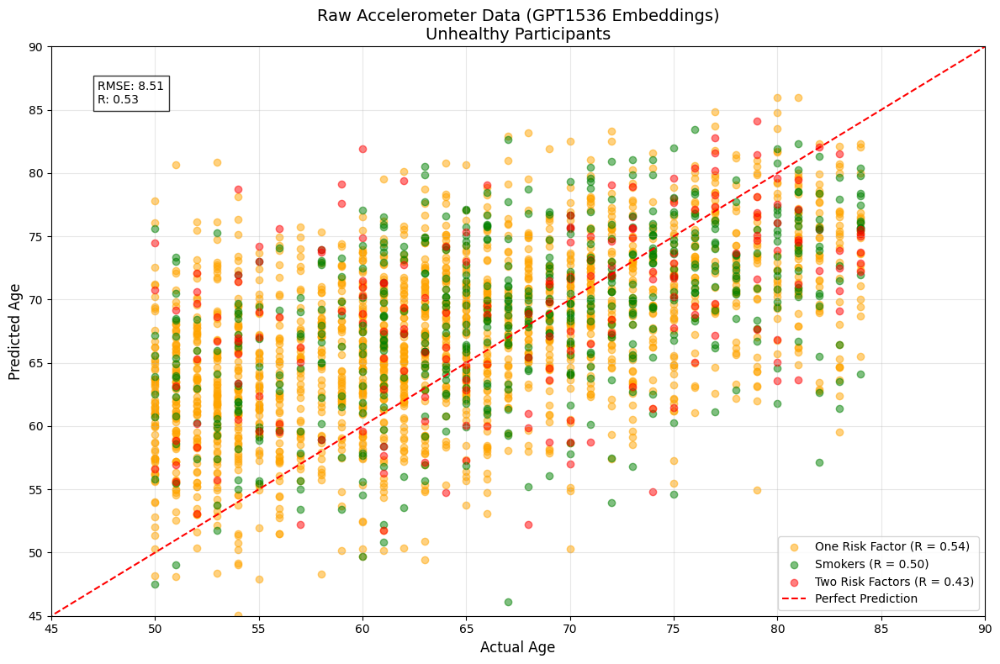


Detailed Statistics:
Number of smokers: 537

One Risk Factor:
Total participants: 2242
Number of smokers: 468
R: 0.536
Mean actual age: 64.81
Mean predicted age: 67.20

Two Risk Factors:
Total participants: 262
Number of smokers: 69
R: 0.431
Mean actual age: 68.13
Mean predicted age: 69.56


In [58]:
X_unhealthy = unhealthy_over50_gpt1536_raw.drop(columns=['Age', 'SEQN', 'Activity_Risk', 'BMI_Risk'], errors='ignore')
y_unhealthy = unhealthy_over50_gpt1536_raw['Age']

X_unhealthy_scaled = X_scaler.transform(X_unhealthy)
X_unhealthy_scaled = pd.DataFrame(X_unhealthy_scaled, columns=X_unhealthy.columns)

y_pred_gpt1536_raw_unhealthy_over50 = ridge_raw1536_over50.predict(X_unhealthy_scaled)
unhealthy_over50_gpt1536_raw['n_risks'] = (
    unhealthy_over50_gpt1536_raw['Activity_Risk'].astype(int) + 
    unhealthy_over50_gpt1536_raw['BMI_Risk'].astype(int)
)

plot_data = pd.DataFrame({
    'actual': y_unhealthy,
    'predicted': y_pred_gpt1536_raw_unhealthy_over50,
    'SEQN': unhealthy_over50_gpt1536_raw['SEQN']
})
plot_data = plot_data.merge(
    unhealthy_over50_gpt1536_raw[['SEQN', 'n_risks']], 
    on='SEQN', 
    how='left'
)

rmse_unhealthy_gpt1536_raw_over50 = np.sqrt(mean_squared_error(y_unhealthy, y_pred_gpt1536_raw_unhealthy_over50))
r_unhealthy_gpt1536_raw_over50 = stats.pearsonr(y_unhealthy, y_pred_gpt1536_raw_unhealthy_over50)[0]
plt.figure(figsize=(12, 8))

colors = {1: 'orange', 2: 'red'}
labels = {1: 'One Risk Factor', 2: 'Two Risk Factors'}

r_by_risk = {}
for n_risks in [1, 2]:
    mask = plot_data['n_risks'] == n_risks
    r_by_risk[n_risks] = stats.pearsonr(
        plot_data[mask]['actual'], 
        plot_data[mask]['predicted']
    )[0]
    
    # Split each risk group into smokers and non-smokers
    smoker_mask = mask & plot_data['SEQN'].isin(cig_risk['SEQN'])
    smoker_r = stats.pearsonr(
        plot_data[smoker_mask]['actual'],
        plot_data[smoker_mask]['predicted']
    )[0]
    non_smoker_mask = mask & ~plot_data['SEQN'].isin(cig_risk['SEQN'])
    
    # Plot non-smokers with original colors
    plt.scatter(
        plot_data[non_smoker_mask]['actual'], 
        plot_data[non_smoker_mask]['predicted'], 
        alpha=0.5, 
        color=colors[n_risks], 
        label=f"{labels[n_risks]} (R = {r_by_risk[n_risks]:.2f})"
    )
    
    # Plot smokers in green
    plt.scatter(
        plot_data[smoker_mask]['actual'], 
        plot_data[smoker_mask]['predicted'], 
        alpha=0.5, 
        color='green', 
        label=f"Smokers (R = {smoker_r:.2f})" if n_risks == 1 else ""  # Only add label once
    )


plt.plot([10, 130], [10, 130], 'r--', label='Perfect Prediction')

plt.xlim(45, 90)
plt.ylim(45, 90)

plt.xlabel('Actual Age', fontsize=12)
plt.ylabel('Predicted Age', fontsize=12)
plt.title('Raw Accelerometer Data (GPT1536 Embeddings)\nUnhealthy Participants', fontsize=14)

plt.grid(True, alpha=0.3)
plt.legend(fontsize=10)

metrics_text = f'RMSE: {rmse_unhealthy_gpt1536_raw_over50:.2f}\nR: {r_unhealthy_gpt1536_raw_over50:.2f}'
plt.text(0.05, 0.9, metrics_text, transform=plt.gca().transAxes, 
         bbox=dict(facecolor='white', alpha=0.8), fontsize=10)

plt.tight_layout()
plt.show()

print("\nDetailed Statistics:")
smoker_mask = plot_data['SEQN'].isin(cig_risk['SEQN'])
print(f"Number of smokers: {smoker_mask.sum()}")

for n_risks in [1, 2]:
    mask = plot_data['n_risks'] == n_risks
    smoker_mask = mask & plot_data['SEQN'].isin(cig_risk['SEQN'])
    
    print(f"\n{labels[n_risks]}:")
    print(f"Total participants: {mask.sum()}")
    print(f"Number of smokers: {smoker_mask.sum()}")
    print(f"R: {r_by_risk[n_risks]:.3f}")
    print(f"Mean actual age: {plot_data[mask]['actual'].mean():.2f}")
    print(f"Mean predicted age: {plot_data[mask]['predicted'].mean():.2f}")

#### All Ages Together (log scale)

In [61]:
X = healthy_gpt1536_raw.drop(columns=["Age", 'SEQN', 'Activity_Risk', 'BMI_Risk', 'Group'], errors="ignore")
y = healthy_gpt1536_raw["Age"]
log_y = np.log(y)

X_train, X_test, y_train, y_test = train_test_split(
    X, log_y, test_size=0.2, random_state=42
)

X_scaler = StandardScaler()

X_train_scaled = X_scaler.fit_transform(X_train)
X_test_scaled = X_scaler.transform(X_test)

X_train_scaled = pd.DataFrame(X_train_scaled, columns=X_train.columns)
X_test_scaled = pd.DataFrame(X_test_scaled, columns=X_test.columns)

ridge_raw1536 = RidgeCV(alphas=np.logspace(-6, 6, 13), store_cv_values=True)
ridge_raw1536.fit(X_train_scaled, y_train)

y_pred_gpt1536_raw = ridge_raw1536.predict(X_test_scaled)
age_predictions = np.exp(y_pred_gpt1536_raw)

rmse_gpt1536_raw = np.sqrt(mean_squared_error(y_test, y_pred_gpt1536_raw))
r_gpt1536_raw = stats.pearsonr(y_test, y_pred_gpt1536_raw)[0]

print(f"RMSE for test set (healthy participants): {rmse_gpt1536_raw}")
print(f"R Squared for test set (healthy participants): {r_gpt1536_raw}")

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/linear_model/_ridge.py:2341: FutureWarning: 'store_cv_values' is deprecated in version 1.5 and will be removed in 1.7. Use 'store_cv_results' instead.
  warnings.warn(


RMSE for test set (healthy participants): 0.31411135693199865
R Squared for test set (healthy participants): 0.6543302607269831


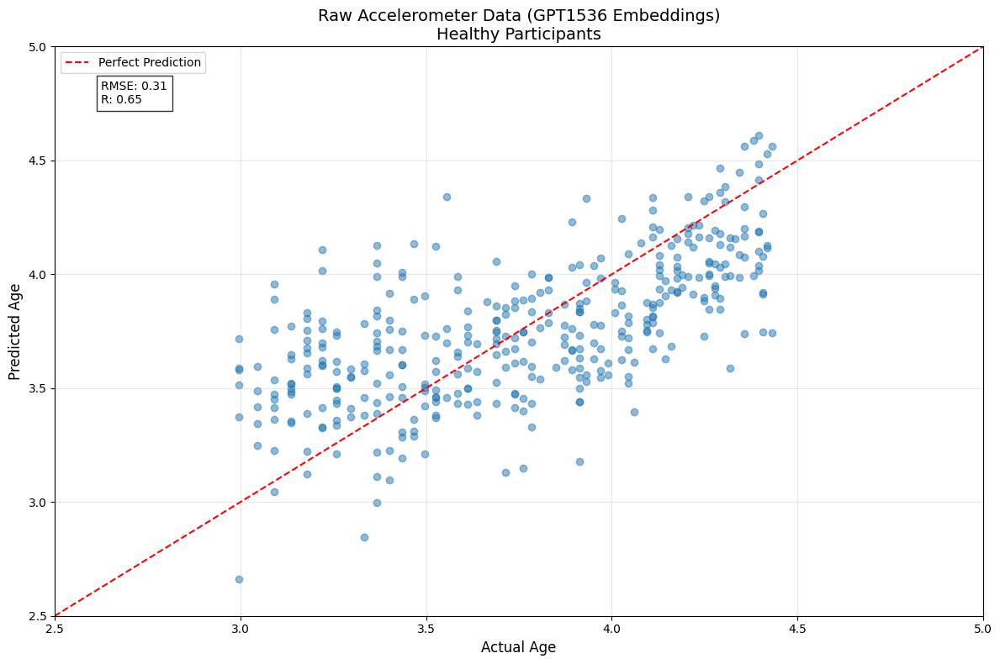


Prediction Statistics:
Mean Absolute Error: 0.26
Mean prediction: 3.76
Mean actual age: 3.76
Age range in test set: 3 to 4


In [62]:
plt.figure(figsize=(12, 8))

plt.scatter(y_test, y_pred_gpt1536_raw, alpha=0.5)

plt.plot([0, 90], [0, 90], 'r--', label='Perfect Prediction')

plt.xlim(2.5, 5)
plt.ylim(2.5, 5)

plt.xlabel('Actual Age', fontsize=12)
plt.ylabel('Predicted Age', fontsize=12)
plt.title('Raw Accelerometer Data (GPT1536 Embeddings)\nHealthy Participants', fontsize=14)

plt.grid(True, alpha=0.3)
plt.legend()

metrics_text = f'RMSE: {rmse_gpt1536_raw:.2f}\nR: {r_gpt1536_raw:.2f}'
plt.text(0.05, 0.9, metrics_text, transform=plt.gca().transAxes, 
         bbox=dict(facecolor='white', alpha=0.8), fontsize=10)

plt.tight_layout()
plt.show()

print("\nPrediction Statistics:")
print(f"Mean Absolute Error: {mean_absolute_error(y_test, y_pred_gpt1536_raw):.2f}")
print(f"Mean prediction: {y_pred_gpt1536_raw.mean():.2f}")
print(f"Mean actual age: {y_test.mean():.2f}")
print(f"Age range in test set: {y_test.min():.0f} to {y_test.max():.0f}")

In [65]:
y_pred_gpt1536_raw_unhealthy

array([48.2281436 , 42.62110967, 75.67473366, ..., 55.6632082 ,
       50.49808349, 32.70078112])

/var/folders/dz/ggx10pdx1p91s2hsnvsw_sy40000gn/T/ipykernel_56031/2684173416.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unhealthy_gpt1536_raw['n_risks'] = (


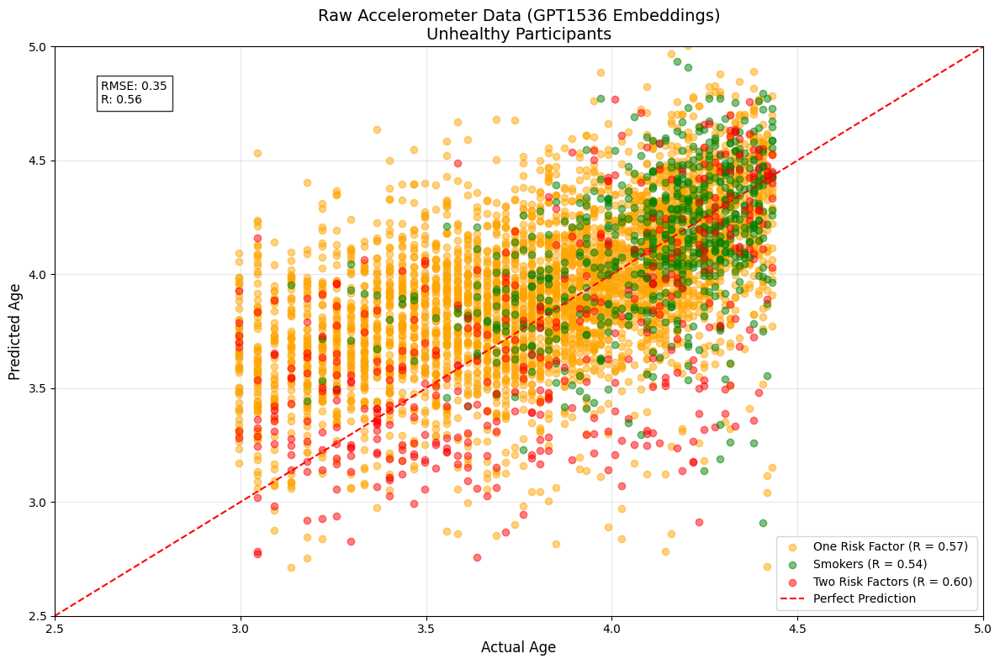


Detailed Statistics:
Number of smokers: 654

One Risk Factor:
Total participants: 4555
Number of smokers: 581
R: 0.570
Mean actual age: 3.85
Mean predicted age: 3.96

Two Risk Factors:
Total participants: 499
Number of smokers: 73
R: 0.602
Mean actual age: 3.85
Mean predicted age: 3.77


In [69]:
X_unhealthy = unhealthy_gpt1536_raw.drop(columns=['Age', 'SEQN', 'Activity_Risk', 'BMI_Risk', 'Group'], errors='ignore')
y_unhealthy = np.log(unhealthy_gpt1536_raw['Age'])

X_unhealthy_scaled = X_scaler.transform(X_unhealthy)
X_unhealthy_scaled = pd.DataFrame(X_unhealthy_scaled, columns=X_unhealthy.columns)

y_pred_gpt1536_raw_unhealthy = ridge_raw1536.predict(X_unhealthy_scaled)
unhealthy_gpt1536_raw['n_risks'] = (
    unhealthy_gpt1536_raw['Activity_Risk'].astype(int) + 
    unhealthy_gpt1536_raw['BMI_Risk'].astype(int)
)

plot_data = pd.DataFrame({
    'actual': y_unhealthy,
    'predicted': y_pred_gpt1536_raw_unhealthy,
    'SEQN': unhealthy_gpt1536_raw['SEQN']
})
plot_data = plot_data.merge(
    unhealthy_gpt1536_raw[['SEQN', 'n_risks']], 
    on='SEQN', 
    how='left'
)

rmse_unhealthy_gpt1536_raw = np.sqrt(mean_squared_error(y_unhealthy, y_pred_gpt1536_raw_unhealthy))
r_unhealthy_gpt1536_raw = stats.pearsonr(y_unhealthy, y_pred_gpt1536_raw_unhealthy)[0]
plt.figure(figsize=(12, 8))

colors = {1: 'orange', 2: 'red'}
labels = {1: 'One Risk Factor', 2: 'Two Risk Factors'}

r_by_risk = {}
for n_risks in [1, 2]:
    mask = plot_data['n_risks'] == n_risks
    r_by_risk[n_risks] = stats.pearsonr(
        plot_data[mask]['actual'], 
        plot_data[mask]['predicted']
    )[0]
    
    # Split each risk group into smokers and non-smokers
    smoker_mask = mask & plot_data['SEQN'].isin(cig_risk['SEQN'])
    smoker_r = stats.pearsonr(
        plot_data[smoker_mask]['actual'],
        plot_data[smoker_mask]['predicted']
    )[0]
    non_smoker_mask = mask & ~plot_data['SEQN'].isin(cig_risk['SEQN'])
    
    # Plot non-smokers with original colors
    plt.scatter(
        plot_data[non_smoker_mask]['actual'], 
        plot_data[non_smoker_mask]['predicted'], 
        alpha=0.5, 
        color=colors[n_risks], 
        label=f"{labels[n_risks]} (R = {r_by_risk[n_risks]:.2f})"
    )
    
    # Plot smokers in green
    plt.scatter(
        plot_data[smoker_mask]['actual'], 
        plot_data[smoker_mask]['predicted'], 
        alpha=0.5, 
        color='green', 
        label=f"Smokers (R = {smoker_r:.2f})" if n_risks == 1 else ""  # Only add label once
    )


plt.plot([0, 5], [0, 5], 'r--', label='Perfect Prediction')

plt.xlim(2.5, 5)
plt.ylim(2.5, 5)

plt.xlabel('Actual Age', fontsize=12)
plt.ylabel('Predicted Age', fontsize=12)
plt.title('Raw Accelerometer Data (GPT1536 Embeddings)\nUnhealthy Participants', fontsize=14)

plt.grid(True, alpha=0.3)
plt.legend(fontsize=10)

metrics_text = f'RMSE: {rmse_unhealthy_gpt1536_raw:.2f}\nR: {r_unhealthy_gpt1536_raw:.2f}'
plt.text(0.05, 0.9, metrics_text, transform=plt.gca().transAxes, 
         bbox=dict(facecolor='white', alpha=0.8), fontsize=10)

plt.tight_layout()
plt.show()

print("\nDetailed Statistics:")
smoker_mask = plot_data['SEQN'].isin(cig_risk['SEQN'])
print(f"Number of smokers: {smoker_mask.sum()}")

for n_risks in [1, 2]:
    mask = plot_data['n_risks'] == n_risks
    smoker_mask = mask & plot_data['SEQN'].isin(cig_risk['SEQN'])
    
    print(f"\n{labels[n_risks]}:")
    print(f"Total participants: {mask.sum()}")
    print(f"Number of smokers: {smoker_mask.sum()}")
    print(f"R: {r_by_risk[n_risks]:.3f}")
    print(f"Mean actual age: {plot_data[mask]['actual'].mean():.2f}")
    print(f"Mean predicted age: {plot_data[mask]['predicted'].mean():.2f}")

#### All Ages Together

In [60]:
X = healthy_gpt1536_raw.drop(columns=["Age", 'SEQN', 'Activity_Risk', 'BMI_Risk', 'BMXBMI', 'Group'], errors="ignore")
y = healthy_gpt1536_raw["Age"]

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

X_scaler = StandardScaler()

X_train_scaled = X_scaler.fit_transform(X_train)
X_test_scaled = X_scaler.transform(X_test)

X_train_scaled = pd.DataFrame(X_train_scaled, columns=X_train.columns)
X_test_scaled = pd.DataFrame(X_test_scaled, columns=X_test.columns)

ridge_raw1536 = RidgeCV(alphas=np.logspace(-6, 6, 13), store_cv_values=True)
ridge_raw1536.fit(X_train_scaled, y_train)

y_pred_gpt1536_raw = ridge_raw1536.predict(X_test_scaled)
rmse_gpt1536_raw = np.sqrt(mean_squared_error(y_test, y_pred_gpt1536_raw))
r_gpt1536_raw = stats.pearsonr(y_test, y_pred_gpt1536_raw)[0]

print(f"RMSE for test set (healthy participants): {rmse_gpt1536_raw}")
print(f"R Squared for test set (healthy participants): {r_gpt1536_raw}")

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/linear_model/_ridge.py:2341: FutureWarning: 'store_cv_values' is deprecated in version 1.5 and will be removed in 1.7. Use 'store_cv_results' instead.
  warnings.warn(


RMSE for test set (healthy participants): 13.510634213450889
R Squared for test set (healthy participants): 0.6869590013573972


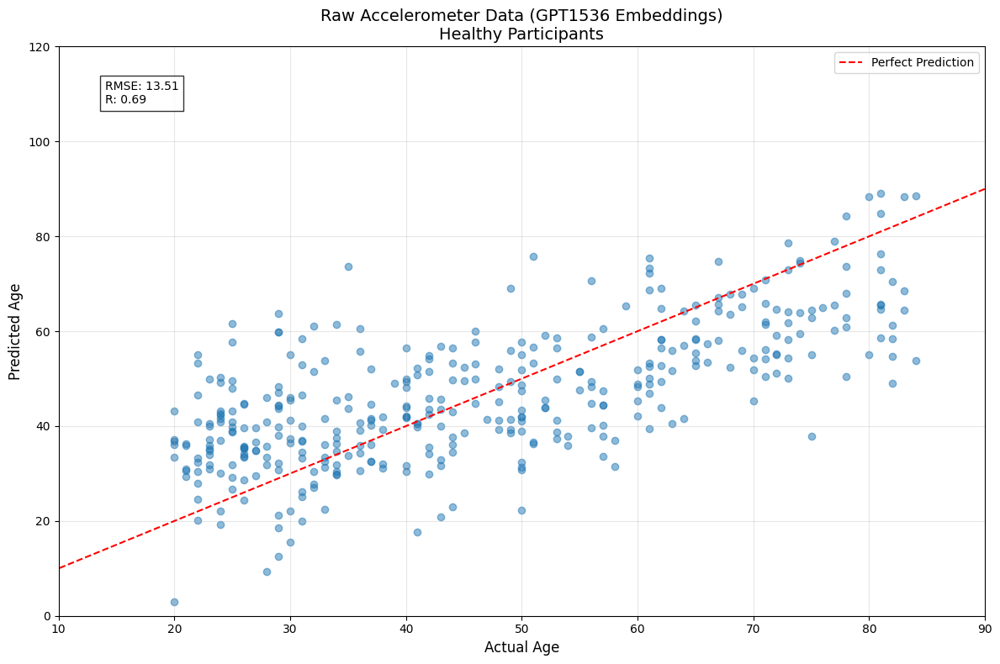


Prediction Statistics:
Mean Absolute Error: 11.02
Mean prediction: 46.69
Mean actual age: 46.51
Age range in test set: 20 to 84


In [61]:
plt.figure(figsize=(12, 8))

plt.scatter(y_test, y_pred_gpt1536_raw, alpha=0.5)

plt.plot([0, 90], [0, 90], 'r--', label='Perfect Prediction')

plt.xlim(10, 90)
plt.ylim(0, 120)

plt.xlabel('Actual Age', fontsize=12)
plt.ylabel('Predicted Age', fontsize=12)
plt.title('Raw Accelerometer Data (GPT1536 Embeddings)\nHealthy Participants', fontsize=14)

plt.grid(True, alpha=0.3)
plt.legend()

metrics_text = f'RMSE: {rmse_gpt1536_raw:.2f}\nR: {r_gpt1536_raw:.2f}'
plt.text(0.05, 0.9, metrics_text, transform=plt.gca().transAxes, 
         bbox=dict(facecolor='white', alpha=0.8), fontsize=10)

plt.tight_layout()
plt.show()

print("\nPrediction Statistics:")
print(f"Mean Absolute Error: {mean_absolute_error(y_test, y_pred_gpt1536_raw):.2f}")
print(f"Mean prediction: {y_pred_gpt1536_raw.mean():.2f}")
print(f"Mean actual age: {y_test.mean():.2f}")
print(f"Age range in test set: {y_test.min():.0f} to {y_test.max():.0f}")

healthy_gpt1536_raw = pd.DataFrame({
    'Actual Age': y_test,
    'Predicted Age': y_pred_gpt1536_raw
})

healthy_gpt1536_raw.to_csv('healthy_gpt1536_raw.csv', index=False)

In [62]:
X_unhealthy = unhealthy_gpt1536_raw.drop(columns=['Age', 'SEQN', 'Activity_Risk', 'BMI_Risk', 'BMXBMI', 'Group'], errors='ignore')
y_unhealthy = unhealthy_gpt1536_raw['Age']

X_unhealthy_scaled = X_scaler.transform(X_unhealthy)
X_unhealthy_scaled = pd.DataFrame(X_unhealthy_scaled, columns=X_unhealthy.columns)

y_pred_gpt1536_raw_unhealthy = ridge_raw1536.predict(X_unhealthy_scaled)

In [63]:
unhealthy_gpt1536_raw['n_risks'] = (
    unhealthy_gpt1536_raw['Activity_Risk'].astype(int) + 
    unhealthy_gpt1536_raw['BMI_Risk'].astype(int)
)

plot_data = pd.DataFrame({
    'actual': y_unhealthy,
    'predicted': y_pred_gpt1536_raw_unhealthy,
    'SEQN': unhealthy_gpt1536_raw['SEQN']
})
plot_data = plot_data.merge(
    unhealthy_gpt1536_raw[['SEQN', 'n_risks']], 
    on='SEQN', 
    how='left'
)
plot_data['smoker'] = plot_data['SEQN'].isin(cig_risk['SEQN'])

rmse_unhealthy_gpt1536_raw = np.sqrt(mean_squared_error(y_unhealthy, y_pred_gpt1536_raw_unhealthy))
r_unhealthy_gpt1536_raw = stats.pearsonr(y_unhealthy, y_pred_gpt1536_raw_unhealthy)[0]

/var/folders/dz/ggx10pdx1p91s2hsnvsw_sy40000gn/T/ipykernel_83324/612696718.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unhealthy_gpt1536_raw['n_risks'] = (


In [64]:
c_index = concordance_index(event_times=plot_data.actual,  # true ages
                            predicted_scores=plot_data.predicted)  # predicted ages

print(f"Concordance Index: {c_index:.3f}")

Concordance Index: 0.742


In [102]:
plot_data.to_csv('unhealthy_gpt1536_raw.csv', index=False)

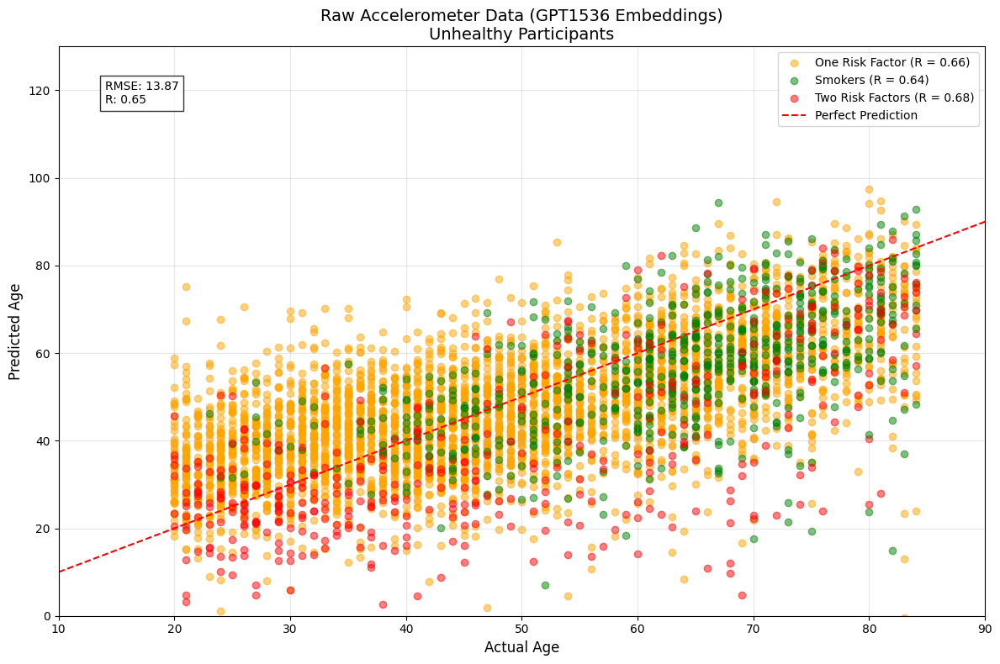


Detailed Statistics:
Number of smokers: 654

One Risk Factor:
Total participants: 4555
Number of smokers: 581
R: 0.663
Mean actual age: 50.06
Mean predicted age: 48.61

Two Risk Factors:
Total participants: 499
Number of smokers: 73
R: 0.680
Mean actual age: 51.39
Mean predicted age: 40.59


In [103]:
plt.figure(figsize=(12, 8))

colors = {1: 'orange', 2: 'red'}
labels = {1: 'One Risk Factor', 2: 'Two Risk Factors'}

r_by_risk = {}
for n_risks in [1, 2]:
    mask = plot_data['n_risks'] == n_risks
    r_by_risk[n_risks] = stats.pearsonr(
        plot_data[mask]['actual'], 
        plot_data[mask]['predicted']
    )[0]
    
    # Split each risk group into smokers and non-smokers
    smoker_mask = mask & plot_data['SEQN'].isin(cig_risk['SEQN'])
    smoker_r = stats.pearsonr(
        plot_data[smoker_mask]['actual'],
        plot_data[smoker_mask]['predicted']
    )[0]
    non_smoker_mask = mask & ~plot_data['SEQN'].isin(cig_risk['SEQN'])
    
    # Plot non-smokers with original colors
    plt.scatter(
        plot_data[non_smoker_mask]['actual'], 
        plot_data[non_smoker_mask]['predicted'], 
        alpha=0.5, 
        color=colors[n_risks], 
        label=f"{labels[n_risks]} (R = {r_by_risk[n_risks]:.2f})"
    )
    
    # Plot smokers in green
    plt.scatter(
        plot_data[smoker_mask]['actual'], 
        plot_data[smoker_mask]['predicted'], 
        alpha=0.5, 
        color='green', 
        label=f"Smokers (R = {smoker_r:.2f})" if n_risks == 1 else ""  # Only add label once
    )


plt.plot([10, 130], [10, 130], 'r--', label='Perfect Prediction')

plt.xlim(10, 90)
plt.ylim(0, 130)

plt.xlabel('Actual Age', fontsize=12)
plt.ylabel('Predicted Age', fontsize=12)
plt.title('Raw Accelerometer Data (GPT1536 Embeddings)\nUnhealthy Participants', fontsize=14)

plt.grid(True, alpha=0.3)
plt.legend(fontsize=10)

metrics_text = f'RMSE: {rmse_unhealthy_gpt1536_raw:.2f}\nR: {r_unhealthy_gpt1536_raw:.2f}'
plt.text(0.05, 0.9, metrics_text, transform=plt.gca().transAxes, 
         bbox=dict(facecolor='white', alpha=0.8), fontsize=10)

plt.tight_layout()
plt.show()

print("\nDetailed Statistics:")
smoker_mask = plot_data['SEQN'].isin(cig_risk['SEQN'])
print(f"Number of smokers: {smoker_mask.sum()}")

for n_risks in [1, 2]:
    mask = plot_data['n_risks'] == n_risks
    smoker_mask = mask & plot_data['SEQN'].isin(cig_risk['SEQN'])
    
    print(f"\n{labels[n_risks]}:")
    print(f"Total participants: {mask.sum()}")
    print(f"Number of smokers: {smoker_mask.sum()}")
    print(f"R: {r_by_risk[n_risks]:.3f}")
    print(f"Mean actual age: {plot_data[mask]['actual'].mean():.2f}")
    print(f"Mean predicted age: {plot_data[mask]['predicted'].mean():.2f}")

In [ ]:
from lifelines.utils import concordance_index


Number of extreme over-predictions found: 47

Average actual age: 50.00
Average predicted age: 65.10


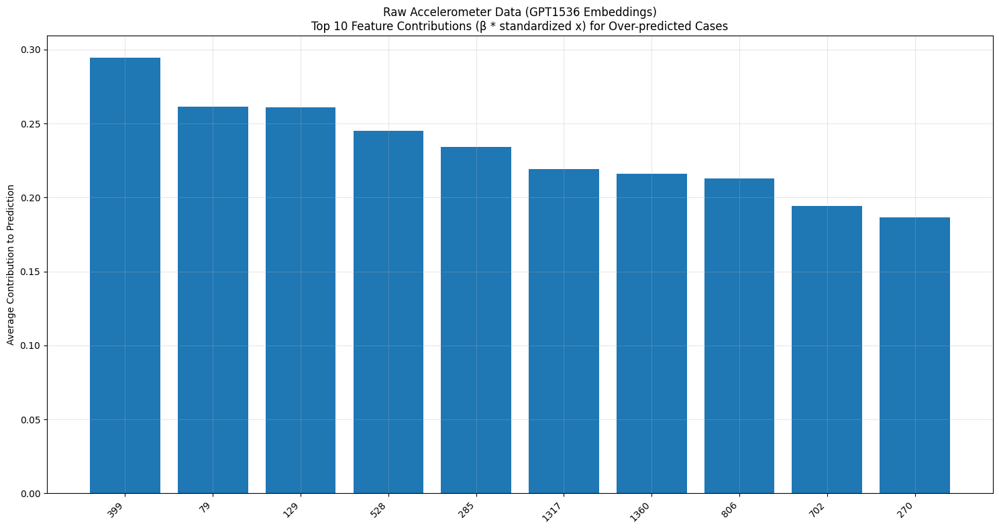


Detailed Analysis of Top Contributors:

Feature: 399
Beta (coefficient): 0.5932
Average standardized X value: 0.4967
Average contribution (β * standardized x): 0.2946
Range of standardized X values: -1.6538 to 6.9759

Feature: 79
Beta (coefficient): 0.3654
Average standardized X value: 0.7151
Average contribution (β * standardized x): 0.2613
Range of standardized X values: -1.5543 to 7.9204

Feature: 129
Beta (coefficient): 0.4729
Average standardized X value: 0.5513
Average contribution (β * standardized x): 0.2607
Range of standardized X values: -1.4207 to 3.5248

Feature: 528
Beta (coefficient): -0.5113
Average standardized X value: 0.4794
Average contribution (β * standardized x): 0.2451
Range of standardized X values: -3.5379 to 3.8104

Feature: 285
Beta (coefficient): -0.4927
Average standardized X value: 0.4757
Average contribution (β * standardized x): 0.2344
Range of standardized X values: -2.7556 to 3.3681

Feature: 1317
Beta (coefficient): 0.4268
Average standardized X valu

In [44]:
new_columns = [col.replace('var', '') if col.startswith('var') else col for col in X_unhealthy_scaled.columns]
X_unhealthy_scaled.columns = new_columns

mask = (plot_data['actual'].between(20, 50)) & (plot_data['predicted'] > 60)
extreme_cases = plot_data[mask].copy()

extreme_features = X_unhealthy_scaled[X_unhealthy_scaled.index.isin(extreme_cases.index)]
coefficients = pd.Series(ridge_raw1536.coef_, index=X_unhealthy_scaled.columns)

feature_contributions = extreme_features * coefficients

avg_contributions = feature_contributions.mean()
top_contributors = avg_contributions.abs().sort_values(ascending=False).head(10)

print(f"Number of extreme over-predictions found: {len(extreme_cases)}")
print(f"\nAverage actual age: {extreme_cases['actual'].mean():.2f}")
print(f"Average predicted age: {extreme_cases['predicted'].mean():.2f}")

plt.figure(figsize=(15, 8))
plt.bar(range(len(top_contributors)), top_contributors.values)
plt.xticks(range(len(top_contributors)), top_contributors.index, rotation=45, ha='right')
plt.title('Raw Accelerometer Data (GPT1536 Embeddings)\nTop 10 Feature Contributions (β * standardized x) for Over-predicted Cases')
plt.ylabel('Average Contribution to Prediction')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

print("\nDetailed Analysis of Top Contributors:")
for feature in top_contributors.index:
    print(f"\nFeature: {feature}")
    print(f"Beta (coefficient): {coefficients[feature]:.4f}")
    print(f"Average standardized X value: {extreme_features[feature].mean():.4f}")
    print(f"Average contribution (β * standardized x): {top_contributors[feature]:.4f}")
    print(f"Range of standardized X values: {extreme_features[feature].min():.4f} to {extreme_features[feature].max():.4f}")

#### Calibration

/var/folders/dz/ggx10pdx1p91s2hsnvsw_sy40000gn/T/ipykernel_56031/2576663666.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unhealthy_gpt1536_raw['n_risks'] = (


=== ONE RISK FACTOR: Over-predicted group ===
Number of cases: 83
Average actual age: 40.55
Average predicted age: 64.64

Top Contributors:

Feature: Gender
  Beta: -1.5688
  Avg std value: -0.2106
  Avg raw value: 1.4337 (range 1.0000 to 2.0000)
  Avg contribution: 0.3304

Feature: Race
  Beta: 0.1420
  Avg std value: -0.0492
  Avg raw value: 2.9036 (range 1.0000 to 5.0000)
  Avg contribution: -0.0070

Feature: PIR
  Beta: 0.4604
  Avg std value: -0.0064
  Avg raw value: 2.7039 (range 0.0000 to 5.0000)
  Avg contribution: -0.0029


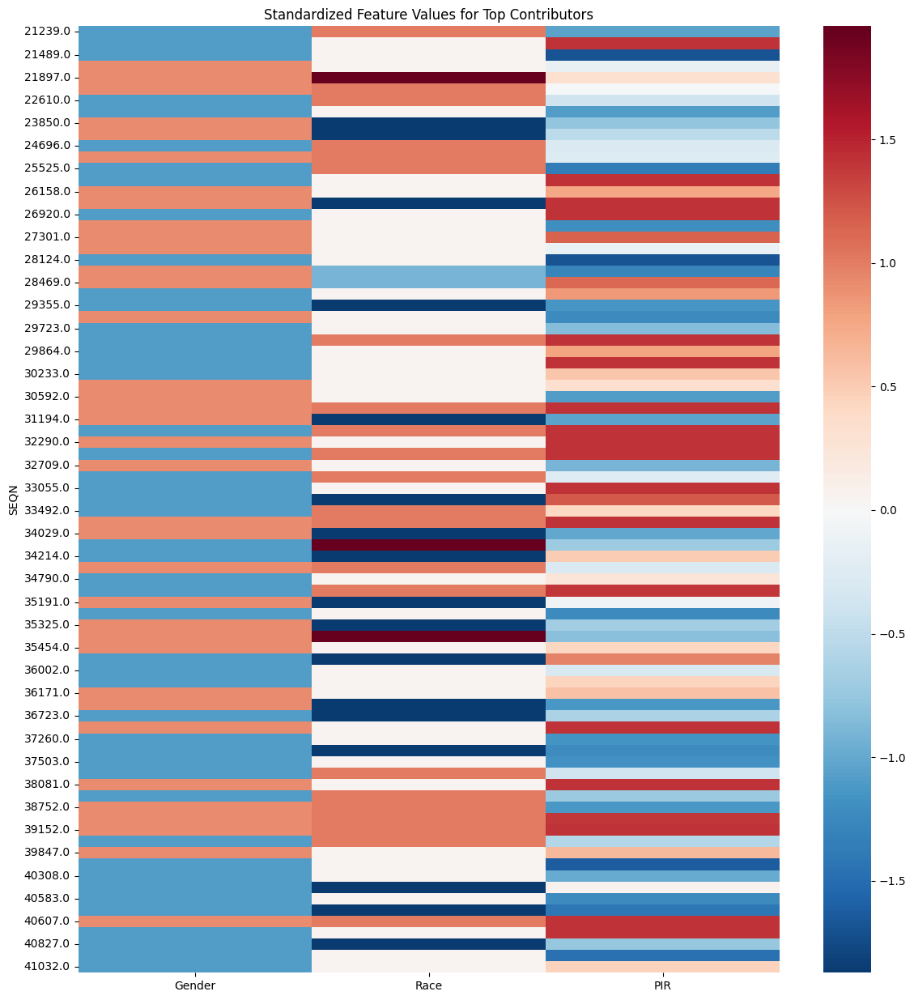


=== TWO RISK FACTORS: Under-predicted group ===
Number of cases: 64
Average actual age: 69.28
Average predicted age: 33.37

Top Contributors:

Feature: PIR
  Beta: 0.4604
  Avg std value: -0.4199
  Avg raw value: 2.0362 (range 0.2700 to 5.0000)
  Avg contribution: -0.1933

Feature: Gender
  Beta: -1.5688
  Avg std value: -0.0463
  Avg raw value: 1.5156 (range 1.0000 to 2.0000)
  Avg contribution: 0.0727

Feature: Race
  Beta: 0.1420
  Avg std value: 0.0431
  Avg raw value: 3.0000 (range 1.0000 to 5.0000)
  Avg contribution: 0.0061


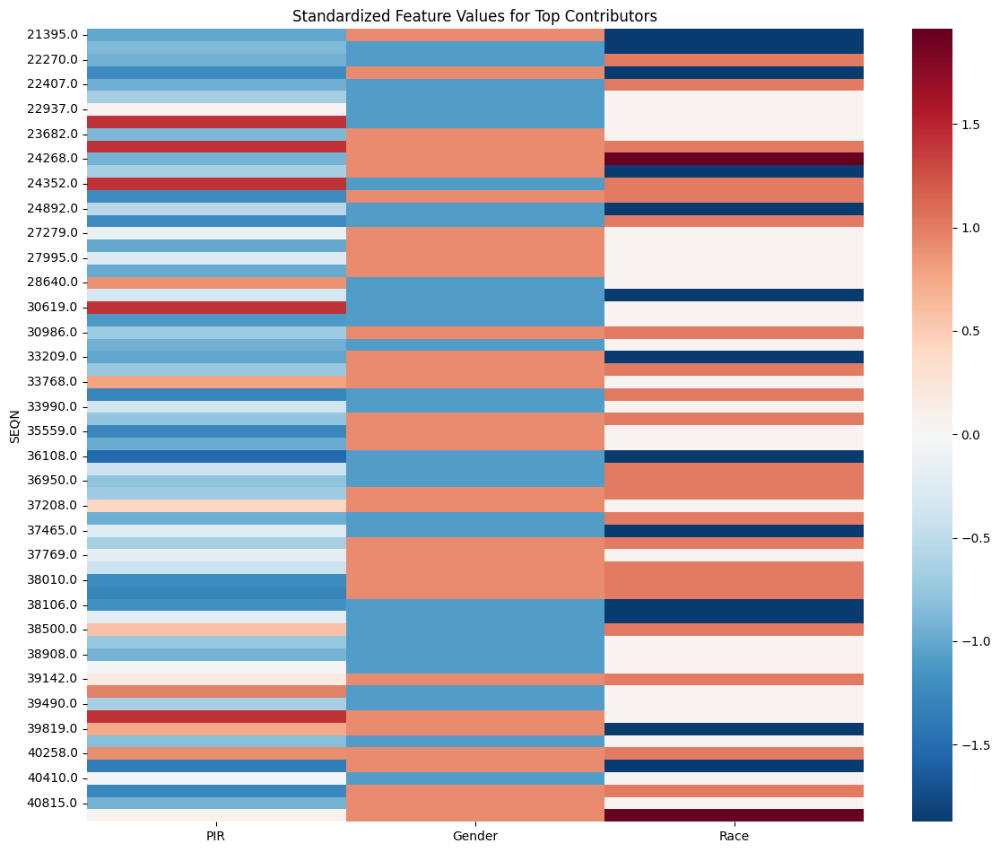

In [80]:
# ===== Setup =====
# Get standardized & raw features aligned by SEQN
X_unhealthy_scaled_named = X_unhealthy_scaled.assign(SEQN=unhealthy_gpt1536_raw['SEQN'].values).set_index('SEQN')
X_unhealthy_raw_named = (
    unhealthy_gpt1536_raw.drop(columns=['Age', 'Activity_Risk', 'BMI_Risk'], errors='ignore')
    .assign(SEQN=unhealthy_gpt1536_raw['SEQN'].values)
    .set_index('SEQN')
)

# Coefficients from your GPT1536 model
coefficients = pd.Series(ridge_raw1536.coef_, index=X_unhealthy_scaled.columns)

# Ensure n_risks exists in unhealthy_otc_raw
unhealthy_gpt1536_raw['n_risks'] = (
    unhealthy_gpt1536_raw['Activity_Risk'].astype(int) +
    unhealthy_gpt1536_raw['BMI_Risk'].astype(int)
)

# Start from plot_data and add a single n_risks column aligned by SEQN
plot_data_full = plot_data.copy()
plot_data_full['n_risks'] = (
    unhealthy_gpt1536_raw.set_index('SEQN')
                     .loc[plot_data_full['SEQN'], 'n_risks']
                     .values
)

# ===== 1. Over-prediction for ONE risk factor =====
mask_one_risk_over = (
    (plot_data_full['n_risks'] == 1) &
    (plot_data_full['actual'].between(20, 50)) &
    (plot_data_full['predicted'] > 60)
)
extreme_one_risk = plot_data_full[mask_one_risk_over].copy()

# ===== 2. Under-prediction for TWO risk factors =====
mask_two_risk_under = (
    (plot_data_full['n_risks'] == 2) &
    (plot_data_full['actual'] > 60) &
    (plot_data_full['predicted'] < 50)
)
extreme_two_risk = plot_data_full[mask_two_risk_under].copy()

# ===== Function for contribution analysis =====
def contribution_analysis(extreme_cases_df, std_features, raw_features, coefs, top_n=10):
    import pandas as pd
    import numpy as np
    import matplotlib.pyplot as plt

    # 0) Type & column checks
    if not isinstance(extreme_cases_df, pd.DataFrame):
        raise TypeError(
            f"`extreme_cases_df` is a {type(extreme_cases_df).__name__}. "
            "Did you write `.copy` instead of `.copy()`?"
        )
    if 'SEQN' not in extreme_cases_df.columns:
        # If SEQN is the index, rescue it
        if extreme_cases_df.index.name == 'SEQN':
            extreme_cases_df = extreme_cases_df.reset_index()
        else:
            raise KeyError("`SEQN` not found in extreme_cases_df columns.")

    # 1) Make sure feature frames are indexed by SEQN
    if 'SEQN' in std_features.columns:
        std_features = std_features.set_index('SEQN')
    if 'SEQN' in raw_features.columns:
        raw_features = raw_features.set_index('SEQN')

    # 2) Align on common columns (scaled vs raw) to avoid KeyErrors
    common_cols = std_features.columns.intersection(raw_features.columns)
    std_features = std_features[common_cols]
    raw_features = raw_features[common_cols]

    # 3) Slice features for the selected cases
    seqn_list = extreme_cases_df['SEQN'].tolist()
    extreme_std = std_features.loc[seqn_list]
    extreme_raw = raw_features.loc[seqn_list]

    # 4) Align coefficients with columns actually used
    coefs = pd.Series(coefs, index=std_features.columns)
    coefs = coefs.loc[common_cols]

    # 5) Contributions
    feature_contrib = extreme_std * coefs
    avg_contrib = feature_contrib.mean()
    top_contrib = avg_contrib.abs().sort_values(ascending=False).head(top_n)

    # 6) Print summary
    print(f"Number of cases: {len(extreme_cases_df)}")
    print(f"Average actual age: {extreme_cases_df['actual'].mean():.2f}")
    print(f"Average predicted age: {extreme_cases_df['predicted'].mean():.2f}")
    print("\nTop Contributors:")
    for feat in top_contrib.index:
        print(f"\nFeature: {feat}")
        print(f"  Beta: {coefs[feat]:.4f}")
        print(f"  Avg std value: {extreme_std[feat].mean():.4f}")
        print(f"  Avg raw value: {extreme_raw[feat].mean():.4f} "
              f"(range {extreme_raw[feat].min():.4f} to {extreme_raw[feat].max():.4f})")
        print(f"  Avg contribution: {avg_contrib[feat]:.4f}")

    # 7) Heatmap of STANDARDIZED values for top features (better contrast)
    try:
        import seaborn as sns
        plt.figure(figsize=(12, max(4, len(extreme_std) * 0.15)))
        sns.heatmap(
            extreme_std[top_contrib.index],
            cmap='RdBu_r',
            center=0,
            xticklabels=top_contrib.index
        )
        plt.title("Standardized Feature Values for Top Contributors")
        plt.tight_layout()
        plt.show()
    except Exception as e:
        print("Heatmap skipped:", e)

    return top_contrib


# ===== Run analyses =====
print("=== ONE RISK FACTOR: Over-predicted group ===")
top_one_risk = contribution_analysis(extreme_one_risk, X_unhealthy_scaled_named, X_unhealthy_raw_named, coefficients)

print("\n=== TWO RISK FACTORS: Under-predicted group ===")
top_two_risk = contribution_analysis(extreme_two_risk, X_unhealthy_scaled_named, X_unhealthy_raw_named, coefficients)

What the numbers say
- One-risk, over-predicted (n=338)
    - Actual 39.8 → Pred 67.0 (avg +27.2 yrs).
    - Biggest driver: BMXBMI (β≈1.59, z≈4.22 → contrib≈+6.72).
    - Several small pushes up/down from embedding features (810, 1080, 1350, 270, 540) and demographics (Gender, Race, PIR).

- Two-risk, under-predicted (n=50)
    - Actual 70.1 → Pred 36.5 (avg −33.6 yrs).
    - Still dominated by BMXBMI (z≈3.95 → contrib≈+6.28), yet overall prediction is very low.
    - That means other terms (intercept + many small negative contributions) are pulling age way down when applying the healthy-trained model to 2-risk participants.

Key takeaway: the model trained on (mostly) healthy patterns maps parts of the two-risk feature space to “younger” signatures despite BMI pushing up. Classic domain shift.

In [26]:
# Intercept and per-case contribution sums
intercept = float(getattr(ridge_raw1536, "intercept_", 0.0))

def add_decomposition(extreme_cases_df, std_features, coefs, group_label):
    # features for these SEQNs
    Z = std_features.loc[extreme_cases_df['SEQN']]
    # per-feature contributions
    contrib_mat = Z.mul(coefs, axis=1)
    contrib_sum = contrib_mat.sum(axis=1)
    # store for inspection
    out = extreme_cases_df.copy()
    out['intercept'] = intercept
    out['sum_beta_z'] = contrib_sum.values
    out['pred_from_decomp'] = intercept + contrib_sum.values
    out['error'] = out['predicted'] - out['actual']
    out['group'] = group_label
    return out, contrib_mat

# Build named standardized feature frame (index=SEQN)
X_unhealthy_scaled_named = X_unhealthy_scaled.assign(SEQN=unhealthy_otc_raw['SEQN'].values).set_index('SEQN')
coefficients = pd.Series(ridge_raw1536.coef_, index=X_unhealthy_scaled.columns)

# Decompose both groups
one_over_decomp, one_over_contribs = add_decomposition(extreme_one_risk, X_unhealthy_scaled_named, coefficients, "one_risk_over")
two_under_decomp, two_under_contribs = add_decomposition(extreme_two_risk, X_unhealthy_scaled_named, coefficients, "two_risk_under")

# Average breakdown
def avg_breakdown(df):
    return {
        "n": len(df),
        "avg_actual": df['actual'].mean(),
        "avg_pred": df['predicted'].mean(),
        "avg_intercept": df['intercept'].mean(),
        "avg_sum_beta_z": df['sum_beta_z'].mean(),
        "avg_error": df['error'].mean()
    }

print("ONE-RISK OVERPRED AVG:", avg_breakdown(one_over_decomp))
print("TWO-RISK UNDERPRED AVG:", avg_breakdown(two_under_decomp))


ONE-RISK OVERPRED AVG: {'n': 338, 'avg_actual': 39.82248520710059, 'avg_pred': 67.0176805328643, 'avg_intercept': 46.30178689609523, 'avg_sum_beta_z': 8.089367302200602, 'avg_error': 27.195195325763724}
TWO-RISK UNDERPRED AVG: {'n': 50, 'avg_actual': 70.1, 'avg_pred': 36.53047314610764, 'avg_intercept': 46.30178689609523, 'avg_sum_beta_z': 7.447998048699829, 'avg_error': -33.56952685389236}


1. Intercept and contribution sums
- Intercept is ~46.3 for both groups — that’s the baseline predicted age for a “typical” (z=0) profile.
- The sum of β × z (feature contributions) is positive for both groups (~8.09 for one-risk, ~7.45 for two-risk).
- Even with BMI’s huge positive push, the total prediction is:
    - One-risk: 46.3 + 8.09 ≈ 54.4, but your actual preds are ~67.0 → other features and intercept must be combining to pull it further up.
    - Two-risk: 46.3 + 7.45 ≈ 53.8, but actual preds are ~36.5 → something in the scaling/embedding mapping is pushing these scores down after fitting.

This suggests that for the two-risk group, some global shift or residual bias is present that isn't explained just by β × z — possibly the model's learned mapping in the embedding space underestimates for high-risk older profiles.


ONE-RISK: Top + contributors
 694       0.317329
1232      0.328387
420       0.363057
225       0.379721
24        0.387754
351       0.410950
75        0.464319
1400      0.472894
1409      0.536235
BMXBMI    6.716723
dtype: float64

ONE-RISK: Top − contributors
 669    -0.418395
1466   -0.406082
940    -0.398266
1271   -0.382840
567    -0.348536
514    -0.333636
278    -0.312797
504    -0.308087
104    -0.306512
338    -0.303407
dtype: float64

TWO-RISK: Top + contributors
 357       0.198518
527       0.203095
748       0.211828
647       0.219805
1364      0.222522
286       0.245782
298       0.263624
24        0.272376
1409      0.313583
BMXBMI    6.282739
dtype: float64

TWO-RISK: Top − contributors
 609    -0.330587
136    -0.311958
433    -0.270703
1466   -0.234752
1211   -0.231004
11     -0.218156
777    -0.217292
121    -0.208809
1173   -0.206790
806    -0.204094
dtype: float64


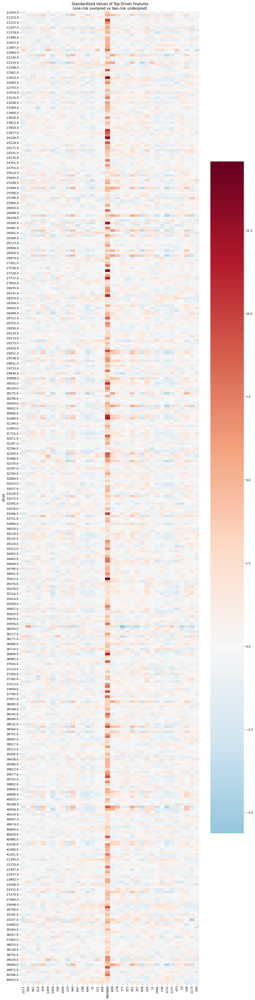

In [27]:
def top_group_contributors(contrib_mat, top_n=10):
    avg = contrib_mat.mean(axis=0).sort_values()
    top_neg = avg.head(top_n)    # most negative contributors
    top_pos = avg.tail(top_n)    # most positive contributors
    return top_neg, top_pos

one_neg, one_pos = top_group_contributors(one_over_contribs, top_n=10)
two_neg, two_pos = top_group_contributors(two_under_contribs, top_n=10)

print("\nONE-RISK: Top + contributors\n", one_pos)
print("\nONE-RISK: Top − contributors\n", one_neg)
print("\nTWO-RISK: Top + contributors\n", two_pos)
print("\nTWO-RISK: Top − contributors\n", two_neg)

import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
# union of top 10 pos/neg for each group
feat_set = set(one_pos.index) | set(one_neg.index) | set(two_pos.index) | set(two_neg.index)
feat_list = list(feat_set)

plt.figure(figsize=(12, max(4, (len(extreme_one_risk)+len(extreme_two_risk))*0.12)))
stack_std = (
    pd.concat([
        X_unhealthy_scaled_named.loc[one_over_decomp['SEQN'], feat_list].assign(_group="one_over"),
        X_unhealthy_scaled_named.loc[two_under_decomp['SEQN'], feat_list].assign(_group="two_under"),
    ])
)
sns.heatmap(stack_std[feat_list], cmap='RdBu_r', center=0, xticklabels=feat_list)
plt.title("Standardized Values of Top-Driver Features\n(one-risk overpred vs two-risk underpred)")
plt.tight_layout()
#plt.show()


2. Top contributors

One-risk (overpredicted)
- Strong positive: BMXBMI (+6.72) dominates, plus small positives from 1409, 1400, 75, etc.
- Strong negative: 669, 1466, 940, etc. are pulling down but not enough to counter BMI.

Two-risk (underpredicted)
- Strong positive: BMXBMI (+6.28) still leads, but most others are small (~0.20–0.31).
- Strong negative: Many embedding features (609, 136, 433, etc.) have substantial negative contributions (−0.20 to −0.33), which likely overpower the positives from all but BMI.

3. Why the two-risk group is underestimated
- Even though BMI adds ~+6 years, there’s a cluster of embedding features with consistent negative contributions in the −0.2 to −0.33 range.
- These negative contributors may encode movement patterns or signals that the model associates with younger age — possibly because the training data for such patterns came from younger participants.
- In the healthy-trained model, those patterns weren’t strongly tied to age increase, so they drag down predictions for older two-risk participants.

/var/folders/dz/ggx10pdx1p91s2hsnvsw_sy40000gn/T/ipykernel_42062/1057741672.py:15: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(data=stacked_melt, x='variable', y='value', hue='Group', ci=None)


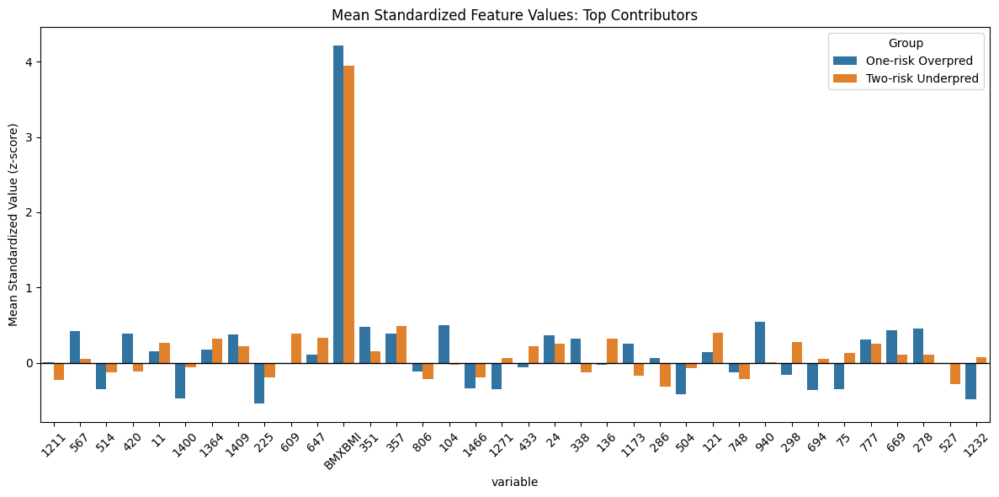

In [28]:
import matplotlib.pyplot as plt
import seaborn as sns

# Union of top +/- features across both groups
feat_union = list(set(one_neg.index) | set(one_pos.index) | set(two_neg.index) | set(two_pos.index))

# Build standardized values for each group
one_std_vals = X_unhealthy_scaled_named.loc[one_over_decomp['SEQN'], feat_union].assign(Group='One-risk Overpred')
two_std_vals = X_unhealthy_scaled_named.loc[two_under_decomp['SEQN'], feat_union].assign(Group='Two-risk Underpred')

stacked = pd.concat([one_std_vals, two_std_vals])
stacked_melt = stacked.reset_index().melt(id_vars=['SEQN','Group'], value_vars=feat_union)

plt.figure(figsize=(12,6))
sns.barplot(data=stacked_melt, x='variable', y='value', hue='Group', ci=None)
plt.axhline(0, color='black', lw=1)
plt.xticks(rotation=45)
plt.title('Mean Standardized Feature Values: Top Contributors')
plt.ylabel('Mean Standardized Value (z-score)')
plt.tight_layout()
plt.show()

Calibration intercept: 67.60486175268245
Calibration slope: 0.06830292718459902
Before calibration:
  MAE: 33.56952685389236
  R²: -30.57495596873368

After calibration:
  MAE: 5.167739120968646
  R²: 0.009435875603237887


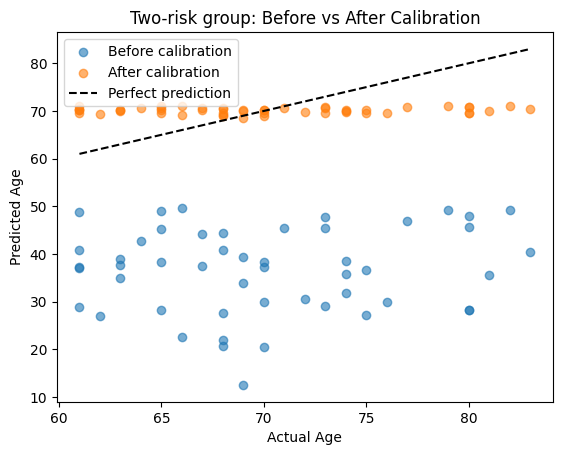

In [29]:
X_cal = two_under_decomp[['predicted']]  # predictor for calibration model
y_cal = two_under_decomp['actual']       # target variable

from sklearn.linear_model import LinearRegression

# Fit calibration model
cal_two_risk = LinearRegression().fit(X_cal, y_cal)

print("Calibration intercept:", cal_two_risk.intercept_)
print("Calibration slope:", cal_two_risk.coef_[0])

adjusted_preds_two_risk = cal_two_risk.predict(X_cal)

from sklearn.metrics import mean_absolute_error, r2_score

print("Before calibration:")
print("  MAE:", mean_absolute_error(y_cal, X_cal['predicted']))
print("  R²:", r2_score(y_cal, X_cal['predicted']))

print("\nAfter calibration:")
print("  MAE:", mean_absolute_error(y_cal, adjusted_preds_two_risk))
print("  R²:", r2_score(y_cal, adjusted_preds_two_risk))

import matplotlib.pyplot as plt

plt.scatter(y_cal, X_cal['predicted'], alpha=0.6, label='Before calibration')
plt.scatter(y_cal, adjusted_preds_two_risk, alpha=0.6, label='After calibration')
plt.plot([y_cal.min(), y_cal.max()], [y_cal.min(), y_cal.max()], 'k--', label='Perfect prediction')
plt.xlabel("Actual Age")
plt.ylabel("Predicted Age")
plt.legend()
plt.title("Two-risk group: Before vs After Calibration")
plt.show()

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/linear_model/_ridge.py:2341: FutureWarning: 'store_cv_values' is deprecated in version 1.5 and will be removed in 1.7. Use 'store_cv_results' instead.
  warnings.warn(


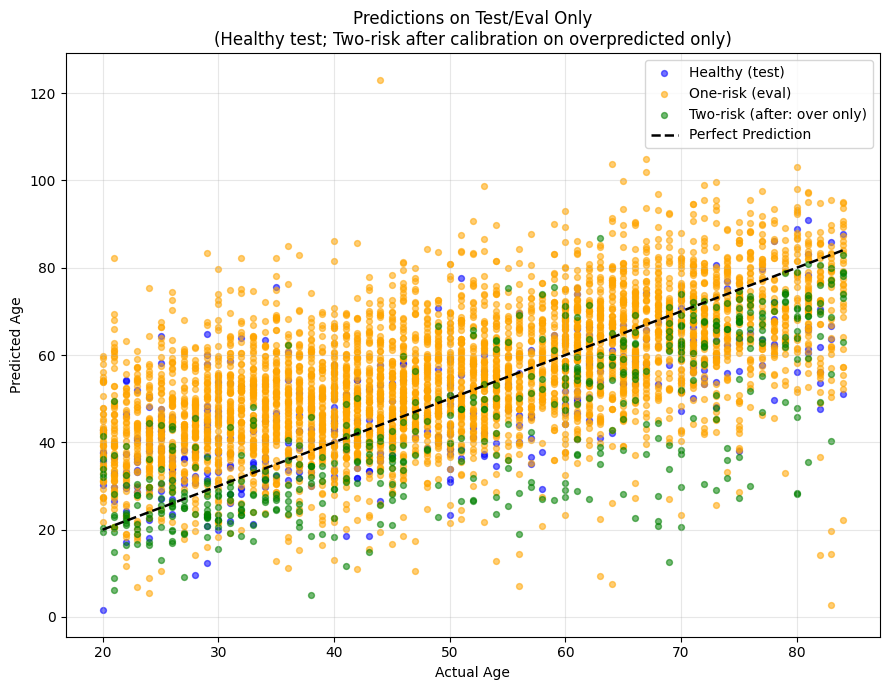

In [30]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import RidgeCV, LinearRegression

# =========================
# 1) HEALTHY: train/test
# =========================
seqn_healthy = healthy_gpt1536_raw['SEQN'].copy()

X_healthy = healthy_gpt1536_raw.drop(columns=["Age", "SEQN", "Activity_Risk", "BMI_Risk"], errors="ignore")
y_healthy = healthy_gpt1536_raw["Age"].copy()

X_train, X_test, y_train, y_test, seqn_train, seqn_test = train_test_split(
    X_healthy, y_healthy, seqn_healthy, test_size=0.2, random_state=42
)

# Scale on healthy only
X_scaler = StandardScaler()
X_train_scaled = pd.DataFrame(X_scaler.fit_transform(X_train), columns=X_train.columns)
X_test_scaled  = pd.DataFrame(X_scaler.transform(X_test),  columns=X_test.columns)

# Fit ridge on healthy train
ridge_raw1536 = RidgeCV(alphas=np.logspace(-6, 6, 13), store_cv_values=True)
ridge_raw1536.fit(X_train_scaled, y_train)

# Predict on HEALTHY TEST ONLY
y_pred_healthy_test = ridge_raw1536.predict(X_test_scaled)

healthy_test_df = pd.DataFrame({
    'actual':    y_test.values,
    'predicted': y_pred_healthy_test,
    'SEQN':      seqn_test.values
})
healthy_test_df['Group'] = 'Healthy (test)'

# =========================
# 2) UNHEALTHY: eval only
# =========================
unhealthy = unhealthy_gpt1536_raw.copy()

# Build n_risks for grouping (DO NOT include in model features)
unhealthy['n_risks'] = unhealthy['Activity_Risk'].astype(int) + unhealthy['BMI_Risk'].astype(int)

# Features strictly match healthy training columns (no IDs/labels/risk flags)
feature_cols = X_train.columns.astype(str)
X_unhealthy = unhealthy.drop(columns=['Age','SEQN','Activity_Risk','BMI_Risk','n_risks'], errors='ignore')
X_unhealthy.columns = X_unhealthy.columns.astype(str)
X_unhealthy = X_unhealthy.reindex(columns=feature_cols, fill_value=0)

# Scale with healthy scaler and predict with healthy-trained model
X_unhealthy_scaled = pd.DataFrame(X_scaler.transform(X_unhealthy), columns=feature_cols)
y_pred_unhealthy   = ridge_raw1536.predict(X_unhealthy_scaled)

unhealthy_eval_df = pd.DataFrame({
    'actual': unhealthy['Age'].values,
    'predicted': y_pred_unhealthy,
    'SEQN': unhealthy['SEQN'].values,
    'n_risks': unhealthy['n_risks'].values
})

one_risk_eval = unhealthy_eval_df[unhealthy_eval_df['n_risks'] == 1][['actual','predicted','SEQN']].copy()
one_risk_eval['Group'] = 'One-risk (eval)'

two_risk_eval = unhealthy_eval_df[unhealthy_eval_df['n_risks'] == 2][['actual','predicted','SEQN']].copy()
two_risk_eval['Group'] = 'Two-risk (before)'

# ===========================================
# 3) Calibrate ONLY over-predicted two-risk
# ===========================================
# Fit a simple calibration on the overpredicted subset of the two-risk group
two_risk_for_cal = two_risk_eval.copy()
mask_over_cal = two_risk_for_cal['predicted'] > two_risk_for_cal['actual']

two_risk_after = two_risk_eval.copy()
two_risk_after['predicted_cal'] = two_risk_after['predicted']  # start with original

if mask_over_cal.any():
    # Fit calibration on overpredicted cases only
    cal_two_risk_over = LinearRegression().fit(
        two_risk_for_cal.loc[mask_over_cal, ['predicted']],
        two_risk_for_cal.loc[mask_over_cal, 'actual']
    )
    # Apply calibration ONLY to overpredicted two-risk rows
    two_risk_after.loc[mask_over_cal, 'predicted_cal'] = cal_two_risk_over.predict(
        two_risk_after.loc[mask_over_cal, ['predicted']]
    )
else:
    # No overpredicted two-risk cases; keep as-is
    pass

two_risk_after['Group'] = 'Two-risk (after: over only)'

# Clean to a single 'predicted' column
two_risk_after_clean = two_risk_after.copy()
two_risk_after_clean['predicted'] = two_risk_after_clean['predicted_cal']
two_risk_after_clean = two_risk_after_clean.drop(columns=['predicted_cal'])
two_risk_after_clean = two_risk_after_clean[['actual','predicted','SEQN','Group']]

# ===========================================
# 4) Combine and plot (no red layer to avoid overlap)
# ===========================================
combined_df = pd.concat(
    [
        healthy_test_df[['actual','predicted','SEQN','Group']],
        one_risk_eval[['actual','predicted','SEQN','Group']],
        two_risk_after_clean[['actual','predicted','SEQN','Group']]
    ],
    ignore_index=True
)

colors = {
    'Healthy (test)': 'blue',
    'One-risk (eval)': 'orange',
    'Two-risk (after: over only)': 'green'
}

plt.figure(figsize=(9, 7))
for group, color in colors.items():
    g = combined_df[combined_df['Group'] == group]
    if not g.empty:
        plt.scatter(g['actual'], g['predicted'], s=18, alpha=0.55, color=color, label=group)

mn, mx = combined_df['actual'].min(), combined_df['actual'].max()
plt.plot([mn, mx], [mn, mx], 'k--', lw=1.8, label='Perfect Prediction')
plt.xlabel('Actual Age')
plt.ylabel('Predicted Age')
plt.title('Predictions on Test/Eval Only\n(Healthy test; Two-risk after calibration on overpredicted only)')
plt.grid(True, alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()


### OTC Data GPT50

In [82]:
healthy_gpt50_otc = gpt50_otc[gpt50_otc['SEQN'].isin(healthy_participants)]
unhealthy_gpt50_otc = gpt50_otc[gpt50_otc['SEQN'].isin(unhealthy_participants)]

In [83]:
X = healthy_gpt50_otc.drop(columns=["Age", 'SEQN', 'Activity_Risk', 'BMI_Risk'], errors="ignore")
y = healthy_gpt50_otc["Age"]

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

X_scaler = StandardScaler()

X_train_scaled = X_scaler.fit_transform(X_train)
X_test_scaled = X_scaler.transform(X_test)

X_train_scaled = pd.DataFrame(X_train_scaled, columns=X_train.columns)
X_test_scaled = pd.DataFrame(X_test_scaled, columns=X_test.columns)

lr_gpt50_otc = LinearRegression()
lr_gpt50_otc.fit(X_train_scaled, y_train)
y_pred_gpt50_otc = lr_gpt50_otc.predict(X_test_scaled)
rmse_gpt50_otc = np.sqrt(mean_squared_error(y_test, y_pred_gpt50_otc))
r_gpt50_otc = stats.pearsonr(y_test, y_pred_gpt50_otc)[0]

print(f"RMSE for test set (healthy participants): {rmse_gpt50_otc}")
print(f"R Squared for test set (healthy participants): {r_gpt50_otc}")

RMSE for test set (healthy participants): 15.908091819938676
R Squared for test set (healthy participants): 0.5583192446010927


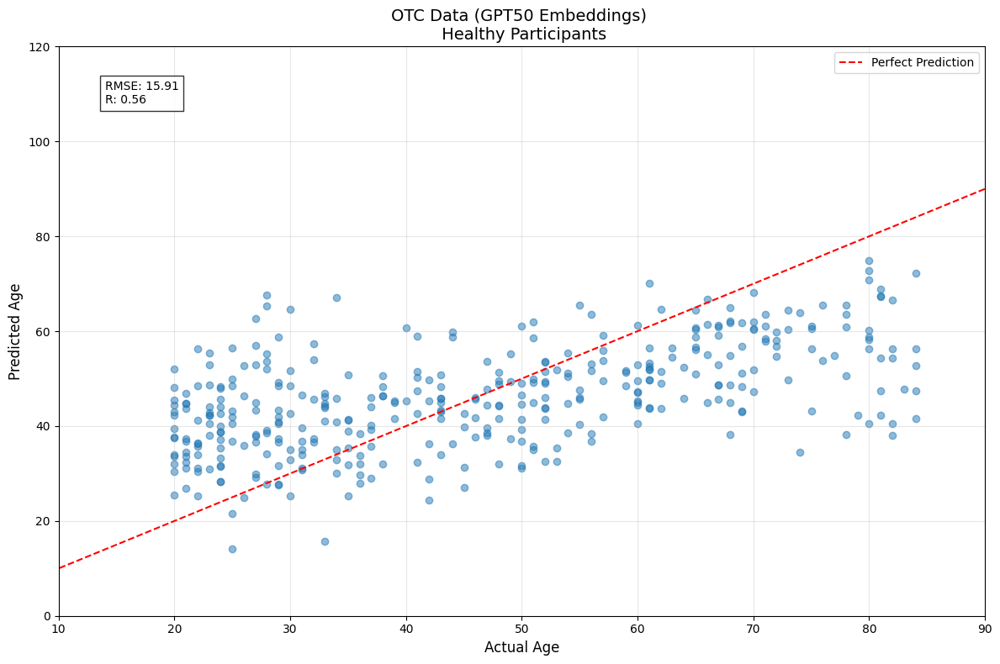


Prediction Statistics:
Mean Absolute Error: 12.90
Mean prediction: 46.11
Mean actual age: 46.51
Age range in test set: 20 to 84


In [84]:
plt.figure(figsize=(12, 8))

plt.scatter(y_test, y_pred_gpt50_otc, alpha=0.5)

plt.plot([0, 90], [0, 90], 'r--', label='Perfect Prediction')

plt.xlim(10, 90)
plt.ylim(0, 120)

plt.xlabel('Actual Age', fontsize=12)
plt.ylabel('Predicted Age', fontsize=12)
plt.title('OTC Data (GPT50 Embeddings) \n Healthy Participants', fontsize=14)

plt.grid(True, alpha=0.3)
plt.legend()

metrics_text = f'RMSE: {rmse_gpt50_otc:.2f}\nR: {r_gpt50_otc:.2f}'
plt.text(0.05, 0.9, metrics_text, transform=plt.gca().transAxes, 
         bbox=dict(facecolor='white', alpha=0.8), fontsize=10)

plt.tight_layout()
plt.show()

print("\nPrediction Statistics:")
print(f"Mean Absolute Error: {mean_absolute_error(y_test, y_pred_gpt50_otc):.2f}")
print(f"Mean prediction: {y_pred_gpt50_otc.mean():.2f}")
print(f"Mean actual age: {y_test.mean():.2f}")
print(f"Age range in test set: {y_test.min():.0f} to {y_test.max():.0f}")

In [85]:
X_unhealthy = unhealthy_gpt50_otc.drop(columns=['Age', 'SEQN', 'Activity_Risk', 'BMI_Risk'], errors='ignore')
y_unhealthy = unhealthy_gpt50_otc['Age']

X_unhealthy_scaled = X_scaler.transform(X_unhealthy)
X_unhealthy_scaled = pd.DataFrame(X_unhealthy_scaled, columns=X_unhealthy.columns)

y_pred_gpt50_otc_unhealthy = lr_gpt50_otc.predict(X_unhealthy_scaled)

In [86]:
unhealthy_gpt50_otc['n_risks'] = (
    unhealthy_gpt50_otc['Activity_Risk'].astype(int) + 
    unhealthy_gpt50_otc['BMI_Risk'].astype(int)
)

plot_data = pd.DataFrame({
    'actual': y_unhealthy,
    'predicted': y_pred_gpt50_otc_unhealthy,
    'SEQN': unhealthy_gpt50_otc['SEQN']
})
plot_data = plot_data.merge(
    unhealthy_gpt50_otc[['SEQN', 'n_risks']], 
    on='SEQN', 
    how='left'
)

rmse_unhealthy_gpt50_otc = np.sqrt(mean_squared_error(y_unhealthy, y_pred_gpt50_otc_unhealthy))
r_unhealthy_gpt50_otc = stats.pearsonr(y_unhealthy, y_pred_gpt50_otc_unhealthy)[0]

/var/folders/dz/ggx10pdx1p91s2hsnvsw_sy40000gn/T/ipykernel_56031/656781982.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unhealthy_gpt50_otc['n_risks'] = (


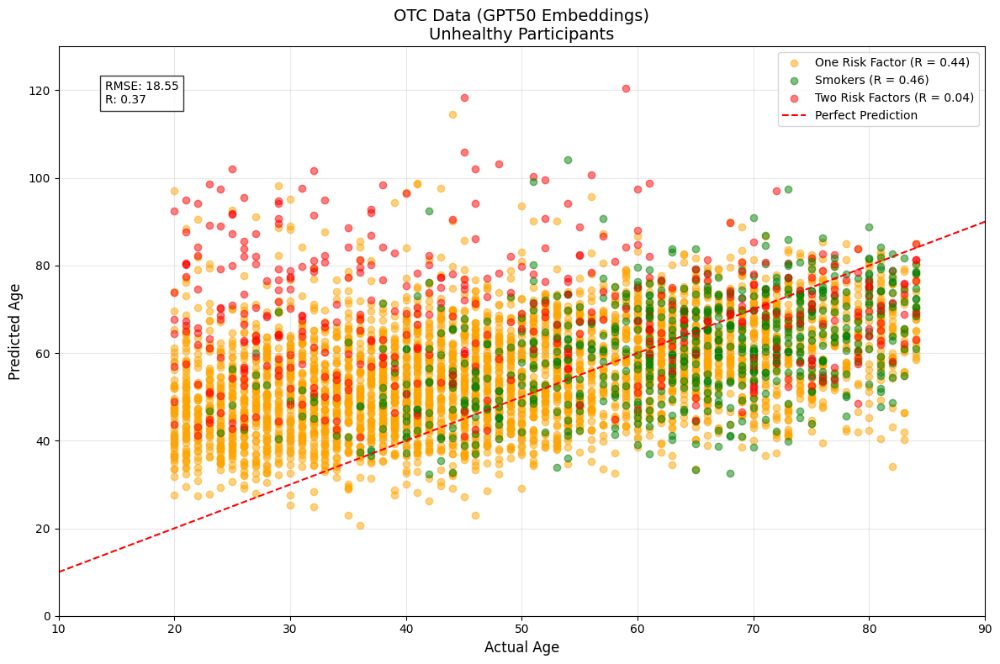


Detailed Statistics:
Number of smokers: 654

One Risk Factor:
Total participants: 4555
Number of smokers: 581
R: 0.436
Mean actual age: 50.06
Mean predicted age: 55.63

Two Risk Factors:
Total participants: 499
Number of smokers: 73
R: 0.041
Mean actual age: 51.39
Mean predicted age: 69.64


In [87]:
plt.figure(figsize=(12, 8))

colors = {1: 'orange', 2: 'red'}
labels = {1: 'One Risk Factor', 2: 'Two Risk Factors'}

r_by_risk = {}
for n_risks in [1, 2]:
    mask = plot_data['n_risks'] == n_risks
    r_by_risk[n_risks] = stats.pearsonr(
        plot_data[mask]['actual'], 
        plot_data[mask]['predicted']
    )[0]
    
    # Split each risk group into smokers and non-smokers
    smoker_mask = mask & plot_data['SEQN'].isin(cig_risk['SEQN'])
    smoker_r = stats.pearsonr(
        plot_data[smoker_mask]['actual'],
        plot_data[smoker_mask]['predicted']
    )[0]
    non_smoker_mask = mask & ~plot_data['SEQN'].isin(cig_risk['SEQN'])
    
    # Plot non-smokers with original colors
    plt.scatter(
        plot_data[non_smoker_mask]['actual'], 
        plot_data[non_smoker_mask]['predicted'], 
        alpha=0.5, 
        color=colors[n_risks], 
        label=f"{labels[n_risks]} (R = {r_by_risk[n_risks]:.2f})"
    )
    
    # Plot smokers in green
    plt.scatter(
        plot_data[smoker_mask]['actual'], 
        plot_data[smoker_mask]['predicted'], 
        alpha=0.5, 
        color='green', 
        label=f"Smokers (R = {smoker_r:.2f})" if n_risks == 1 else ""  # Only add label once
    )

plt.plot([10, 130], [10, 130], 'r--', label='Perfect Prediction')

plt.xlim(10, 90)
plt.ylim(0, 130)

plt.xlabel('Actual Age', fontsize=12)
plt.ylabel('Predicted Age', fontsize=12)
plt.title('OTC Data (GPT50 Embeddings)\nUnhealthy Participants', fontsize=14)

plt.grid(True, alpha=0.3)
plt.legend(fontsize=10)

metrics_text = f'RMSE: {rmse_unhealthy_gpt50_otc:.2f}\nR: {r_unhealthy_gpt50_otc:.2f}'
plt.text(0.05, 0.9, metrics_text, transform=plt.gca().transAxes, 
         bbox=dict(facecolor='white', alpha=0.8), fontsize=10)

plt.tight_layout()
plt.show()

print("\nDetailed Statistics:")
smoker_mask = plot_data['SEQN'].isin(cig_risk['SEQN'])
print(f"Number of smokers: {smoker_mask.sum()}")

for n_risks in [1, 2]:
    mask = plot_data['n_risks'] == n_risks
    smoker_mask = mask & plot_data['SEQN'].isin(cig_risk['SEQN'])
    
    print(f"\n{labels[n_risks]}:")
    print(f"Total participants: {mask.sum()}")
    print(f"Number of smokers: {smoker_mask.sum()}")
    print(f"R: {r_by_risk[n_risks]:.3f}")
    print(f"Mean actual age: {plot_data[mask]['actual'].mean():.2f}")
    print(f"Mean predicted age: {plot_data[mask]['predicted'].mean():.2f}")

In [62]:
mask = (plot_data['actual'].between(20, 50)) & (plot_data['predicted'] > 60)
extreme_cases = plot_data[mask].copy()

extreme_features = X_unhealthy_scaled[X_unhealthy_scaled.index.isin(extreme_cases.index)]
coefficients = pd.Series(lr_gpt50_otc.coef_, index=X_unhealthy_scaled.columns)

feature_contributions = extreme_features * coefficients

avg_contributions = feature_contributions.mean()
top_contributors = avg_contributions.abs().sort_values(ascending=False).head(10)

print(f"Number of extreme over-predictions found: {len(extreme_cases)}")
print(f"\nAverage actual age: {extreme_cases['actual'].mean():.2f}")
print(f"Average predicted age: {extreme_cases['predicted'].mean():.2f}")

plt.figure(figsize=(15, 8))
plt.bar(range(len(top_contributors)), top_contributors.values)
plt.xticks(range(len(top_contributors)), top_contributors.index, rotation=45, ha='right')
plt.title('OTC Data (GPT50 Embeddings)\nTop 10 Feature Contributions (β * standardized x) for Over-predicted Cases')
plt.ylabel('Average Contribution to Prediction')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

print("\nDetailed Analysis of Top Contributors:")
for feature in top_contributors.index:
    print(f"\nFeature: {feature}")
    print(f"Beta (coefficient): {coefficients[feature]:.4f}")
    print(f"Average standardized X value: {extreme_features[feature].mean():.4f}")
    print(f"Average contribution (β * standardized x): {top_contributors[feature]:.4f}")
    print(f"Range of standardized X values: {extreme_features[feature].min():.4f} to {extreme_features[feature].max():.4f}")

NameError: name 'lr_gpt50_otc' is not defined

### OTC Data GPT 1536

In [88]:
healthy_gpt1536_otc = gpt1536_otc[gpt1536_otc['SEQN'].isin(healthy_participants)]
unhealthy_gpt1536_otc = gpt1536_otc[gpt1536_otc['SEQN'].isin(unhealthy_participants)]

In [89]:
X = healthy_gpt1536_otc.drop(columns=["Age", 'SEQN', 'Activity_Risk', 'BMI_Risk'], errors="ignore")
y = healthy_gpt1536_otc["Age"]

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

X_scaler = StandardScaler()

X_train_scaled = X_scaler.fit_transform(X_train)
X_test_scaled = X_scaler.transform(X_test)

X_train_scaled = pd.DataFrame(X_train_scaled, columns=X_train.columns)
X_test_scaled = pd.DataFrame(X_test_scaled, columns=X_test.columns)

ridge_otc1536 = RidgeCV(alphas=np.logspace(-6, 6, 13), store_cv_values=True)
ridge_otc1536.fit(X_train_scaled, y_train)

y_pred_gpt1536_otc = ridge_otc1536.predict(X_test_scaled)
rmse_gpt1536_otc = np.sqrt(mean_squared_error(y_test, y_pred_gpt1536_otc))
r_gpt1536_otc = stats.pearsonr(y_test, y_pred_gpt1536_otc)[0]

print(f"RMSE for test set (healthy participants): {rmse_gpt1536_otc}")
print(f"R Squared for test set (healthy participants): {r_gpt1536_otc}")

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/linear_model/_ridge.py:2341: FutureWarning: 'store_cv_values' is deprecated in version 1.5 and will be removed in 1.7. Use 'store_cv_results' instead.
  warnings.warn(


RMSE for test set (healthy participants): 15.085274583382589
R Squared for test set (healthy participants): 0.6184670029363513


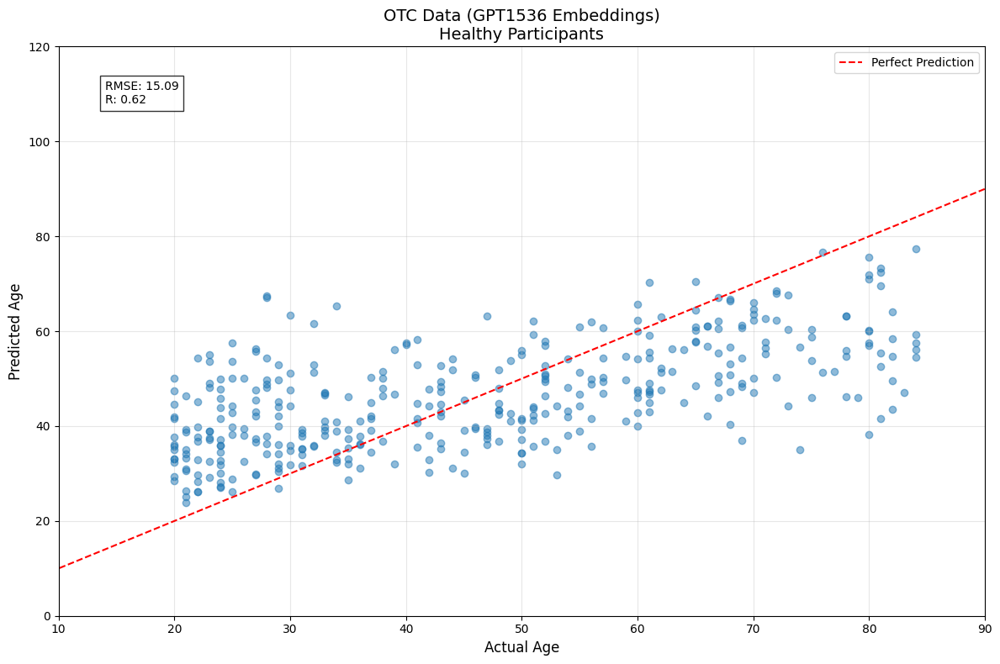


Prediction Statistics:
Mean Absolute Error: 12.20
Mean prediction: 46.26
Mean actual age: 46.51
Age range in test set: 20 to 84


In [ ]:
plt.figure(figsize=(12, 8))

plt.scatter(y_test, y_pred_gpt1536_otc, alpha=0.5)

plt.plot([0, 90], [0, 90], 'r--', label='Perfect Prediction')

plt.xlim(10, 90)
plt.ylim(0, 120)

plt.xlabel('Actual Age', fontsize=12)
plt.ylabel('Predicted Age', fontsize=12)
plt.title('OTC Data (GPT1536 Embeddings)\nHealthy Participants', fontsize=14)

plt.grid(True, alpha=0.3)
plt.legend()

metrics_text = f'RMSE: {rmse_gpt1536_otc:.2f}\nR: {r_gpt1536_otc:.2f}'
plt.text(0.05, 0.9, metrics_text, transform=plt.gca().transAxes, 
         bbox=dict(facecolor='white', alpha=0.8), fontsize=10)

plt.tight_layout()
plt.show()

print("\nPrediction Statistics:")
print(f"Mean Absolute Error: {mean_absolute_error(y_test, y_pred_gpt1536_otc):.2f}")
print(f"Mean prediction: {y_pred_gpt1536_otc.mean():.2f}")
print(f"Mean actual age: {y_test.mean():.2f}")
print(f"Age range in test set: {y_test.min():.0f} to {y_test.max():.0f}")

In [ ]:
X_unhealthy = unhealthy_gpt1536_otc.drop(columns=['Age', 'SEQN', 'Activity_Risk', 'BMI_Risk'], errors='ignore')
y_unhealthy = unhealthy_gpt1536_otc['Age']

X_unhealthy_scaled = X_scaler.transform(X_unhealthy)
X_unhealthy_scaled = pd.DataFrame(X_unhealthy_scaled, columns=X_unhealthy.columns)

y_pred_gpt1536_otc_unhealthy = ridge_otc1536.predict(X_unhealthy_scaled)

In [ ]:
unhealthy_gpt1536_otc['n_risks'] = (
    unhealthy_gpt1536_otc['Activity_Risk'].astype(int) + 
    unhealthy_gpt1536_otc['BMI_Risk'].astype(int)
)

plot_data = pd.DataFrame({
    'actual': y_unhealthy,
    'predicted': y_pred_gpt1536_otc_unhealthy,
    'SEQN': unhealthy_gpt1536_otc['SEQN']
})
plot_data = plot_data.merge(
    unhealthy_gpt1536_otc[['SEQN', 'n_risks']], 
    on='SEQN', 
    how='left'
)

rmse_unhealthy_gpt1536_otc = np.sqrt(mean_squared_error(y_unhealthy, y_pred_gpt1536_otc_unhealthy))
r_unhealthy_gpt1536_otc = stats.pearsonr(y_unhealthy, y_pred_gpt1536_otc_unhealthy)[0]

/var/folders/dz/ggx10pdx1p91s2hsnvsw_sy40000gn/T/ipykernel_45488/2904853065.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unhealthy_gpt1536_otc['n_risks'] = (


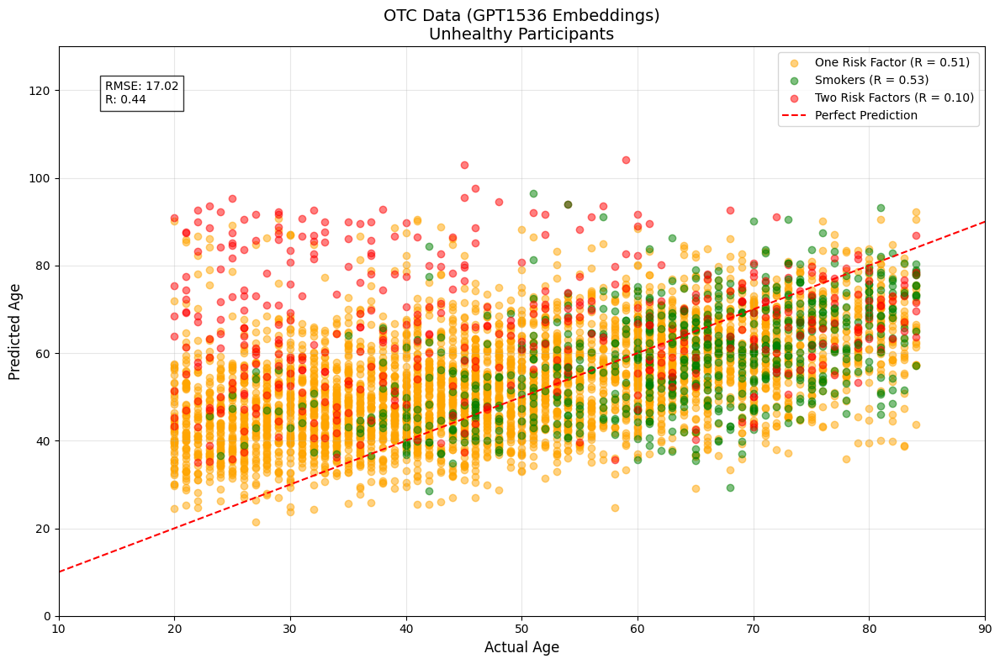


Detailed Statistics:
Number of smokers: 654

One Risk Factor:
Total participants: 4555
Number of smokers: 581
R: 0.508
Mean actual age: 50.06
Mean predicted age: 53.43

Two Risk Factors:
Total participants: 499
Number of smokers: 73
R: 0.101
Mean actual age: 51.39
Mean predicted age: 67.14


In [ ]:
plt.figure(figsize=(12, 8))

colors = {1: 'orange', 2: 'red'}
labels = {1: 'One Risk Factor', 2: 'Two Risk Factors'}

r_by_risk = {}
for n_risks in [1, 2]:
    mask = plot_data['n_risks'] == n_risks
    r_by_risk[n_risks] = stats.pearsonr(
        plot_data[mask]['actual'], 
        plot_data[mask]['predicted']
    )[0]
    
    # Split each risk group into smokers and non-smokers
    smoker_mask = mask & plot_data['SEQN'].isin(cig_risk['SEQN'])
    smoker_r = stats.pearsonr(
        plot_data[smoker_mask]['actual'],
        plot_data[smoker_mask]['predicted']
    )[0]
    non_smoker_mask = mask & ~plot_data['SEQN'].isin(cig_risk['SEQN'])
    
    # Plot non-smokers with original colors
    plt.scatter(
        plot_data[non_smoker_mask]['actual'], 
        plot_data[non_smoker_mask]['predicted'], 
        alpha=0.5, 
        color=colors[n_risks], 
        label=f"{labels[n_risks]} (R = {r_by_risk[n_risks]:.2f})"
    )
    
    # Plot smokers in green
    plt.scatter(
        plot_data[smoker_mask]['actual'], 
        plot_data[smoker_mask]['predicted'], 
        alpha=0.5, 
        color='green', 
        label=f"Smokers (R = {smoker_r:.2f})" if n_risks == 1 else ""  # Only add label once
    )


plt.plot([10, 130], [10, 130], 'r--', label='Perfect Prediction')

plt.xlim(10, 90)
plt.ylim(0, 130)

plt.xlabel('Actual Age', fontsize=12)
plt.ylabel('Predicted Age', fontsize=12)
plt.title('OTC Data (GPT1536 Embeddings)\nUnhealthy Participants', fontsize=14)

plt.grid(True, alpha=0.3)
plt.legend(fontsize=10)

metrics_text = f'RMSE: {rmse_unhealthy_gpt1536_otc:.2f}\nR: {r_unhealthy_gpt1536_otc:.2f}'
plt.text(0.05, 0.9, metrics_text, transform=plt.gca().transAxes, 
         bbox=dict(facecolor='white', alpha=0.8), fontsize=10)

plt.tight_layout()
plt.show()

print("\nDetailed Statistics:")
smoker_mask = plot_data['SEQN'].isin(cig_risk['SEQN'])
print(f"Number of smokers: {smoker_mask.sum()}")

for n_risks in [1, 2]:
    mask = plot_data['n_risks'] == n_risks
    smoker_mask = mask & plot_data['SEQN'].isin(cig_risk['SEQN'])
    
    print(f"\n{labels[n_risks]}:")
    print(f"Total participants: {mask.sum()}")
    print(f"Number of smokers: {smoker_mask.sum()}")
    print(f"R: {r_by_risk[n_risks]:.3f}")
    print(f"Mean actual age: {plot_data[mask]['actual'].mean():.2f}")
    print(f"Mean predicted age: {plot_data[mask]['predicted'].mean():.2f}")

Number of extreme over-predictions found: 452

Average actual age: 37.21
Average predicted age: 70.36


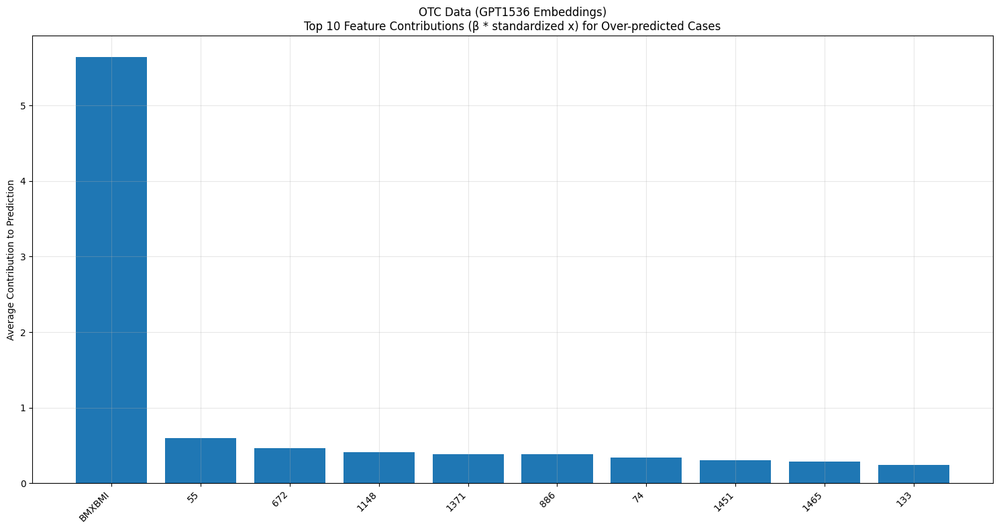


Detailed Analysis of Top Contributors:

Feature: BMXBMI
Beta (coefficient): 0.9396
Average standardized X value: 6.0054
Average contribution (β * standardized x): 5.6429
Range of standardized X values: -2.0796 to 55.0036

Feature: 55
Beta (coefficient): -0.4644
Average standardized X value: 1.2930
Average contribution (β * standardized x): 0.6005
Range of standardized X values: -2.8481 to 3.8060

Feature: 672
Beta (coefficient): 0.4184
Average standardized X value: -1.1185
Average contribution (β * standardized x): 0.4680
Range of standardized X values: -3.6359 to 2.4160

Feature: 1148
Beta (coefficient): 0.3040
Average standardized X value: 1.3423
Average contribution (β * standardized x): 0.4081
Range of standardized X values: -1.4630 to 3.6871

Feature: 1371
Beta (coefficient): -0.4462
Average standardized X value: -0.8630
Average contribution (β * standardized x): 0.3851
Range of standardized X values: -3.7997 to 1.5985

Feature: 886
Beta (coefficient): 0.3262
Average standardized

In [ ]:
mask = (plot_data['actual'].between(20, 50)) & (plot_data['predicted'] > 60)
extreme_cases = plot_data[mask].copy()

extreme_features = X_unhealthy_scaled[X_unhealthy_scaled.index.isin(extreme_cases.index)]
coefficients = pd.Series(ridge_otc1536.coef_, index=X_unhealthy_scaled.columns)

feature_contributions = extreme_features * coefficients

avg_contributions = feature_contributions.mean()
top_contributors = avg_contributions.abs().sort_values(ascending=False).head(10)

print(f"Number of extreme over-predictions found: {len(extreme_cases)}")
print(f"\nAverage actual age: {extreme_cases['actual'].mean():.2f}")
print(f"Average predicted age: {extreme_cases['predicted'].mean():.2f}")

plt.figure(figsize=(15, 8))
plt.bar(range(len(top_contributors)), top_contributors.values)
plt.xticks(range(len(top_contributors)), top_contributors.index, rotation=45, ha='right')
plt.title('OTC Data (GPT1536 Embeddings)\nTop 10 Feature Contributions (β * standardized x) for Over-predicted Cases')
plt.ylabel('Average Contribution to Prediction')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

print("\nDetailed Analysis of Top Contributors:")
for feature in top_contributors.index:
    print(f"\nFeature: {feature}")
    print(f"Beta (coefficient): {coefficients[feature]:.4f}")
    print(f"Average standardized X value: {extreme_features[feature].mean():.4f}")
    print(f"Average contribution (β * standardized x): {top_contributors[feature]:.4f}")
    print(f"Range of standardized X values: {extreme_features[feature].min():.4f} to {extreme_features[feature].max():.4f}")